![Perth_House.png](https://datasciencecc.s3.us-east-2.amazonaws.com/Perth_House.png)

**Es importante resaltar que este laboratorio es con fines personales y que sus resultados no tiene que reflejarse completamente a la realidad**

# <p style="background-color:red; font-family:calibri; color:white; font-size:150%; text-align:center; border-radius:50px 50px;"> 1. Introducción:</p>

Debido al aumento de las ventas de viviendas ubicadas en el Suroeste de Australia especificamente en la ciudad de Perth y al desconocimiento de la valorización de muchas propiedades segun sus caracteristicas especificas como se puede observar en la [base de datos](https://www.kaggle.com/datasets/syuzai/perth-house-prices/data), se vio la necesidad de evaluar diferentes modelos predictivos para el precio de las viviendas ubicadas en dicha localidad. Además, de realizar un analisis de las variables más importantes para la creación del modelo.

Las variables que contiene nuestra base de datos estan resumidas en la siguiente tabla:

- ADDRESS : Dirección fisica del inmueble
- SUBURB : Lugar especifico ubicado en Perth
- PRICE : Precio por el que cada propiedad fue vendida [AUD]
- BEDROOMS : Numero de dormitorios
- BATHROOMS : Numero de baños
- GARAGE : Numero de garajes 
- LAND_AREA : Area total del terreno [$m^2$]
- FLOOR_AREA : Area construida [$m^2$]
- BUILD_YEAR : Año en el que la propiedad fue construida
- CBD_DIST : Distancia desde el centro de Perth [m]
- NEAREST_STN : La estación de transporte publico mas cerca a la propiedad
- NEAREST_STN_DIST : La distancia  a la estación de transporte mas cerca a la propiedad [m]
- DATE_SOLD : Año y mes en que la propiedad fue vendida
- POSTCODE : Codigo postal del area
- LATITUDE : Ubicación geografica de la propiedad (Latitud)
- LONGITIDE : Ubicación geografica de la propiedad (Longitud)
- NEAREST_SCH : El colegio más cerca a la propiedad
- NEAREST_SCH_DIST : La distancia al colegio más cerca a la propiedad
- NEAREST_SCH_RANK : Ranking del colegio más cercano a la propiedad

# <p style="background-color:red; font-family:calibri; color:white; font-size:150%; text-align:center; border-radius:50px 50px;"> 2. Importación de datos y analisis preliminar:</p>

In [4]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
import os
from scipy.stats import gaussian_kde

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn import metrics
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor

from sklearn.model_selection import GridSearchCV, RandomizedSearchCV


import warnings
warnings.filterwarnings(action='ignore')

In [5]:
data = pd.read_csv('all_perth_310121.csv')
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33656 entries, 0 to 33655
Data columns (total 19 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   ADDRESS           33656 non-null  object 
 1   SUBURB            33656 non-null  object 
 2   PRICE             33656 non-null  int64  
 3   BEDROOMS          33656 non-null  int64  
 4   BATHROOMS         33656 non-null  int64  
 5   GARAGE            31178 non-null  float64
 6   LAND_AREA         33656 non-null  int64  
 7   FLOOR_AREA        33656 non-null  int64  
 8   BUILD_YEAR        30501 non-null  float64
 9   CBD_DIST          33656 non-null  int64  
 10  NEAREST_STN       33656 non-null  object 
 11  NEAREST_STN_DIST  33656 non-null  int64  
 12  DATE_SOLD         33656 non-null  object 
 13  POSTCODE          33656 non-null  int64  
 14  LATITUDE          33656 non-null  float64
 15  LONGITUDE         33656 non-null  float64
 16  NEAREST_SCH       33656 non-null  object

In [6]:
data.head(5)

,ADDRESS,SUBURB,PRICE,BEDROOMS,BATHROOMS,GARAGE,LAND_AREA,FLOOR_AREA,BUILD_YEAR,CBD_DIST,NEAREST_STN,NEAREST_STN_DIST,DATE_SOLD,POSTCODE,LATITUDE,LONGITUDE,NEAREST_SCH,NEAREST_SCH_DIST,NEAREST_SCH_RANK
0,1 Acorn Place,South Lake,565000,4,2,2.0,600,160,2003.0,18300,Cockburn Central Station,1800,09-2018\r,6164,-32.115900,115.842450,LAKELAND SENIOR HIGH SCHOOL,0.828339,NaN
1,1 Addis Way,Wandi,365000,3,2,2.0,351,139,2013.0,26900,Kwinana Station,4900,02-2019\r,6167,-32.193470,115.859554,ATWELL COLLEGE,5.524324,129.0
2,1 Ainsley Court,Camillo,287000,3,1,1.0,719,86,1979.0,22600,Challis Station,1900,06-2015\r,6111,-32.120578,115.993579,KELMSCOTT SENIOR HIGH SCHOOL,1.649178,113.0
3,1 Albert Street,Bellevue,255000,2,1,2.0,651,59,1953.0,17900,Midland Station,3600,07-2018\r,6056,-31.900547,116.038009,SWAN VIEW SENIOR HIGH SCHOOL,1.571401,NaN
4,1 Aman Place,Lockridge,325000,4,1,2.0,466,131,1998.0,11200,Bassendean Station,2000,11-2016\r,6054,-31.885790,115.947780,KIARA COLLEGE,1.514922,NaN


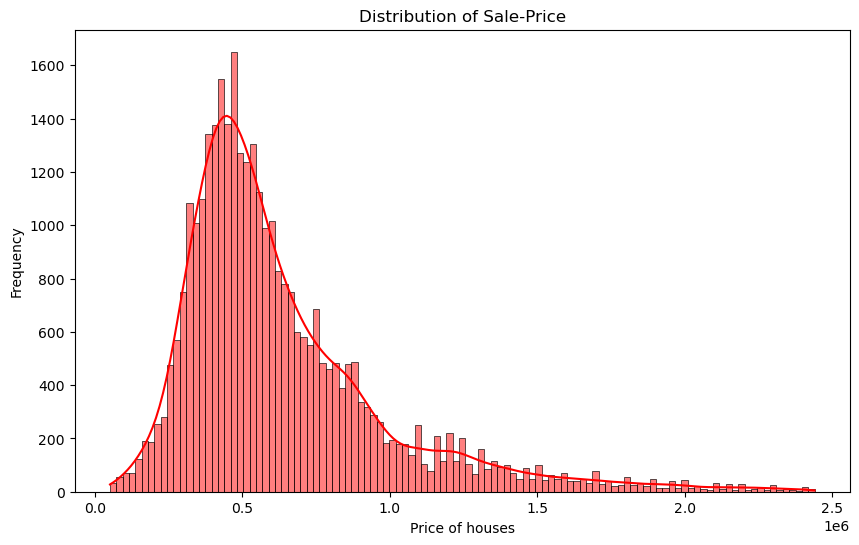

count    3.365600e+04
mean     6.370720e+05
std      3.558256e+05
min      5.100000e+04
25%      4.100000e+05
50%      5.355000e+05
75%      7.600000e+05
max      2.440000e+06
Name: PRICE, dtype: float64

In [7]:
price = data['PRICE']
plt.figure(figsize=(10, 6))
sns.histplot(price, kde=True, color='r')
plt.title('Distribution of Sale-Price')
plt.xlabel('Price of houses')
plt.ylabel('Frequency')
plt.show()
price.describe()

El histograma presenta una distribución sesgada hacia la izquierda, con una mayor concentración de valores en las casas menos costosas. La media del precio de todas las casas de Perth es de 637072.00 Dolares Australianos, mientras que la mediana es de 535500.00. Esto indica que la mayoría de las casas en la muestra cuestan menos de 637072.00 Dolares Australianos.

# <p style="background-color:red; font-family:calibri; color:white; font-size:150%; text-align:center; border-radius:50px 50px;">3. Preprosesamiento y limpieza de datos:</p>

In [8]:
import plotly.express as px
import pandas as pd


color_scale = [(0, 'orange'), (1,'red')]

fig = px.scatter_mapbox(data, 
                        lat="LATITUDE", 
                        lon="LONGITUDE", 
                        hover_name="ADDRESS", 
                        hover_data=["ADDRESS", "PRICE"],
                        color="PRICE",
                        color_continuous_scale="OrRd",
                        size="PRICE",
                        size_max=5,
                        zoom=10, 
                        height=800,
                        width=950)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

Se puede observar que las propiedades cerca a las playas/costas y a las orillas del rio Swan tienden a tener un valor que esta por encima del promedio.

Se determinara aquellas variables que son relevantes para nuestro modelo de Machine learning teniendo en cuenta la cantidad de datos que hay en los atributos de nuestra muestra. Luego se dividira las variables que son de tipo "*Object, Float y Int*" para evaluar si son escenciales para el modelo

In [9]:
X = data

In [10]:
{column: len(X[column].unique()) for column in X.select_dtypes('object').columns}

{'ADDRESS': 33566,
 'SUBURB': 321,
 'NEAREST_STN': 68,
 'DATE_SOLD': 350,
 'NEAREST_SCH': 160}

In [11]:
{column: len(X[column].unique()) for column in X.select_dtypes('int').columns}

{'PRICE': 2297,
 'BEDROOMS': 10,
 'BATHROOMS': 8,
 'LAND_AREA': 4372,
 'FLOOR_AREA': 528,
 'CBD_DIST': 595,
 'NEAREST_STN_DIST': 1189,
 'POSTCODE': 114}

Los atributos"**ADDRESS**" y "**POSTCODE**" no son significativas en nuestro modelo de ML ya que solo nos da la información de la identificación y ubicación de manera precisa en terminos sociales.

In [12]:
X = X.drop(["ADDRESS","POSTCODE"],axis=1)
X.head(5)

,SUBURB,PRICE,BEDROOMS,BATHROOMS,GARAGE,LAND_AREA,FLOOR_AREA,BUILD_YEAR,CBD_DIST,NEAREST_STN,NEAREST_STN_DIST,DATE_SOLD,LATITUDE,LONGITUDE,NEAREST_SCH,NEAREST_SCH_DIST,NEAREST_SCH_RANK
0,South Lake,565000,4,2,2.0,600,160,2003.0,18300,Cockburn Central Station,1800,09-2018\r,-32.115900,115.842450,LAKELAND SENIOR HIGH SCHOOL,0.828339,NaN
1,Wandi,365000,3,2,2.0,351,139,2013.0,26900,Kwinana Station,4900,02-2019\r,-32.193470,115.859554,ATWELL COLLEGE,5.524324,129.0
2,Camillo,287000,3,1,1.0,719,86,1979.0,22600,Challis Station,1900,06-2015\r,-32.120578,115.993579,KELMSCOTT SENIOR HIGH SCHOOL,1.649178,113.0
3,Bellevue,255000,2,1,2.0,651,59,1953.0,17900,Midland Station,3600,07-2018\r,-31.900547,116.038009,SWAN VIEW SENIOR HIGH SCHOOL,1.571401,NaN
4,Lockridge,325000,4,1,2.0,466,131,1998.0,11200,Bassendean Station,2000,11-2016\r,-31.885790,115.947780,KIARA COLLEGE,1.514922,NaN


Para identificar los valores nulos y el porcentaje de estos sobre el total de los datos se realiza el siguiente grafico

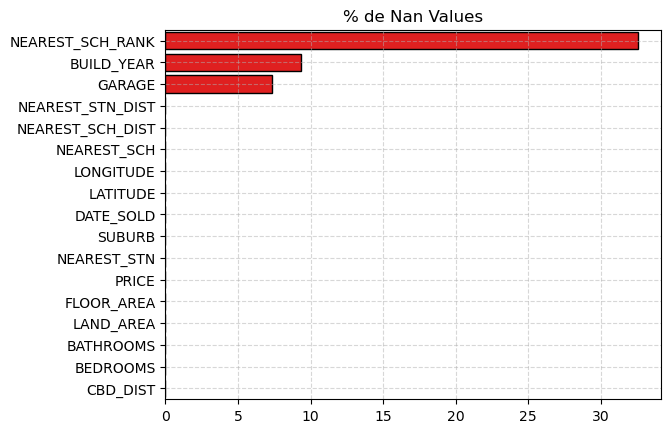

In [13]:
fig, ax = plt.subplots()
nan = (X.isnull().sum()/len(X)*100).sort_values(ascending = False)
sns.barplot(x=nan,y=nan.index, edgecolor='k',color='red')
plt.title("% de Nan Values")
ax.grid(ls='--',alpha = 0.5)
plt.show()

En la teoría, cuando se cuenta con atributos que tienen menos del 70% de los datos completos, se puede tomar la decisión de eliminar cicha variable, como lo es en esta ocasión para "**NEAREST_SCH_RANK**". Para aquellas que tienen datos nulos pero que no superan el 30% de los datos se pueden rellenar con las siguientes opciones:

- [x] La medía de todos los valores de la variable
- [x] La moda de todos los valores de la variable
- [ ] La mediana de todos los valores de la variable
- [ ] El promedio entre el valor superior e inferior
- [ ] Igual valor al superior o el inferior

Para esta ocasión, rellenamos los datos faltantes en las variables ***"BUILD_YEAR" y "GARAGE"*** con la opción seleccionada anteriormentepara respectivamente

Para tener más inf de las variables podemos ver los metadatos. En caso de no encontrar inf relevante, se puede visualizar los datos de cada variable

    df = df.drop('NEAREST_SCH_RANK',axis=1)

In [14]:
X = X.drop('NEAREST_SCH_RANK',axis=1)

Debido a la inf que esta disponible, se estima que la variable "**GARAGE**" indica la cantidad de vehiculos que pueden estar dentro del garaje, asi que,  los datos null seran sustituidos por la mediana de la variable.
Los datos nulos de la variable "**BUILD_YEAR**" sera sustituida por la mediana del año de construccion de todas las casas en venta

In [15]:
X['GARAGE'] = X['GARAGE'].fillna(X['GARAGE'].median())  
X['BUILD_YEAR'] = X['BUILD_YEAR'].fillna(X['BUILD_YEAR'].median())

In [16]:
X.isna().mean()

SUBURB              0.0
PRICE               0.0
BEDROOMS            0.0
BATHROOMS           0.0
GARAGE              0.0
LAND_AREA           0.0
FLOOR_AREA          0.0
BUILD_YEAR          0.0
CBD_DIST            0.0
NEAREST_STN         0.0
NEAREST_STN_DIST    0.0
DATE_SOLD           0.0
LATITUDE            0.0
LONGITUDE           0.0
NEAREST_SCH         0.0
NEAREST_SCH_DIST    0.0
dtype: float64

Para extraer la fecha que se vendio la casa convertimos el dato "DATE_SOLD" con datetime

In [17]:
X['DATE_SOLD'] = pd.to_datetime(X['DATE_SOLD'])
X['DATE_YEAR'] = X['DATE_SOLD'].apply(lambda x: x.year)
X['DATE_MONTH'] = X['DATE_SOLD'].apply(lambda x: x.month)
X = X.drop('DATE_SOLD',axis=1)

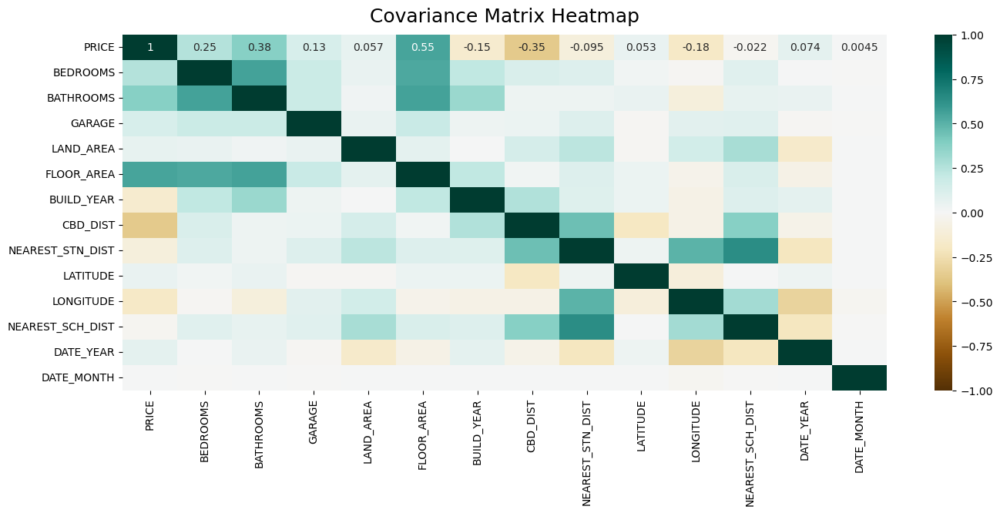

In [17]:
data_num = X.drop(X.select_dtypes(include=['object']).columns,axis=1)
plt.figure(figsize=(16, 6))
heatmap = sns.heatmap(data_num.corr(), vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Covariance Matrix Heatmap', fontdict={'fontsize':18}, pad=12);

A partir de la grafica de correlación anterior, se observa una fuerte correlación en el aumento del precio cuando el area construida es mayor. Ademas de la cantidad de baños, dormitorios y vehiculos que entran en el garaje son de vital importancia para aumentar el costo de la vivienda.

Utilizamos "***get_dummies***" para facilitar el manejo de las variables categóricas en el modelo de ML

In [18]:
X = pd.get_dummies(X, columns=['SUBURB', 'NEAREST_STN', 'NEAREST_SCH', 'GARAGE'], dtype=float)
#X = X.drop(['SUBURB', 'NEAREST_STN', 'NEAREST_SCH', 'GARAGE'],axis=1)

In [19]:
y = X['PRICE']
X = X.drop('PRICE',axis=1)

MODELO ML

# <p style="background-color:red; font-family:calibri; color:white; font-size:150%; text-align:center; border-radius:50px 50px;">4. Machine Learning:</p>

## <code style="background-color:red; font-family:calibri; color:white; font-size:150%; text-align:center; border-radius:50px 50px;">Training:</code>

In [20]:
X_train, X_test, y_train, y_test = train_test_split (X, y, train_size= 0.7, shuffle=True, random_state=1)
scaler = StandardScaler()
scaler.fit(X_train)
X_train = pd.DataFrame(scaler.transform(X_train), index = X_train.index, columns = X_train.columns)
X_test = pd.DataFrame(scaler.transform(X_test), index = X_test.index, columns = X_test.columns)

## <code style="background-color:red; font-family:calibri; color:white; font-size:150%; text-align:center; border-radius:50px 50px;">Results:</code>

## Chapter 1. My First Subsection <a class="anchor"  id="subsection1"></a>

In [21]:
evaluation_results = [] 
def evaluate_model_regression(model, model_name, X_train, y_train, X_test, y_test):
    # Training the model
    model.fit(X_train, y_train)

    # Printing training score
    training_score = model.score(X_train, y_train)
    print(f'Training score : {training_score}')

    # Printing testing score
    testing_score = model.score(X_test, y_test)
    print(f'Testing score : {testing_score}')
    
    evaluation_results.append({
        "Model": model_name,
        "Training Score": training_score,
        "Testing Score": testing_score,
    })

    # Making predictions on the test set
    y_prediction = model.predict(X_test)
    
    # Calculating and printing evaluation metrics for regression
    print(f'R2 score : {metrics.r2_score(y_test, y_prediction)}')
    print(f'MAE : {metrics.mean_absolute_error(y_test, y_prediction)}')
    print(f'MSE : {metrics.mean_squared_error(y_test, y_prediction)}')
    print(f'RMSE : {np.sqrt(metrics.mean_squared_error(y_test, y_prediction))}')
    
    # Plotting the distribution of residuals
    plt.figure(figsize=(12, 6))
    sns.distplot(y_test - y_prediction, color='orange', hist_kws=dict(edgecolor="black", linewidth=1))
    plt.title('Residuals Distribution', fontsize=16, color='blue')
    plt.xlabel('Residuals', fontsize=12, color='green')
    plt.ylabel('Density', fontsize=12, color='purple')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()

    # Scatter plot comparing true values with predicted values
    plt.figure(figsize=(10, 6))
    plt.scatter(y_test, y_prediction, color='blue', alpha=0.5)
    plt.title('Scatter Plot of True Values vs. Predicted Values', fontsize=16)
    plt.xlabel('True Values', fontsize=12)
    plt.ylabel('Predicted Values', fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.show()

Training score : 0.782755044127355
Testing score : -1.0769520856966857e+21
R2 score : -1.0769520856966857e+21
MAE : 186327251303617.8
MSE : 1.3945729808580702e+32
RMSE : 1.1809203956482716e+16


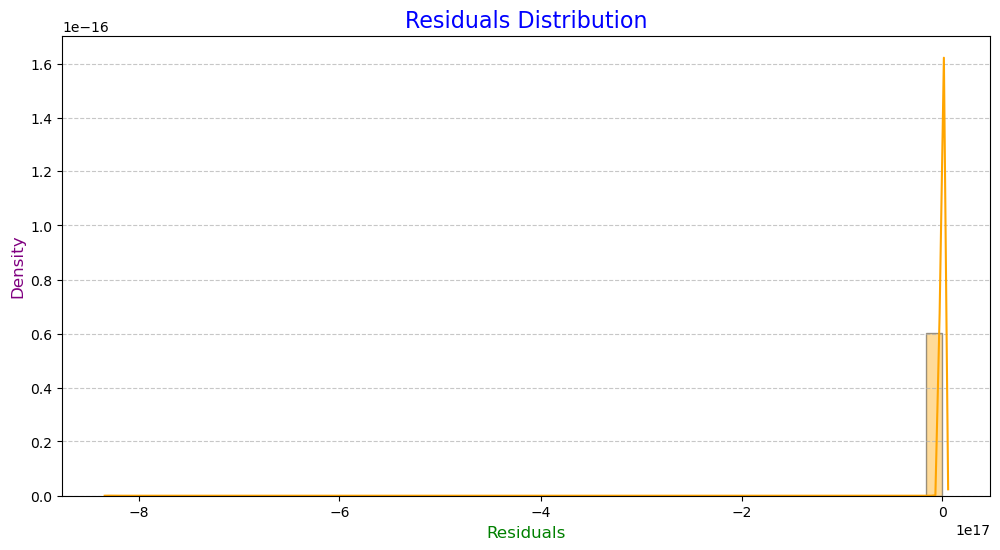

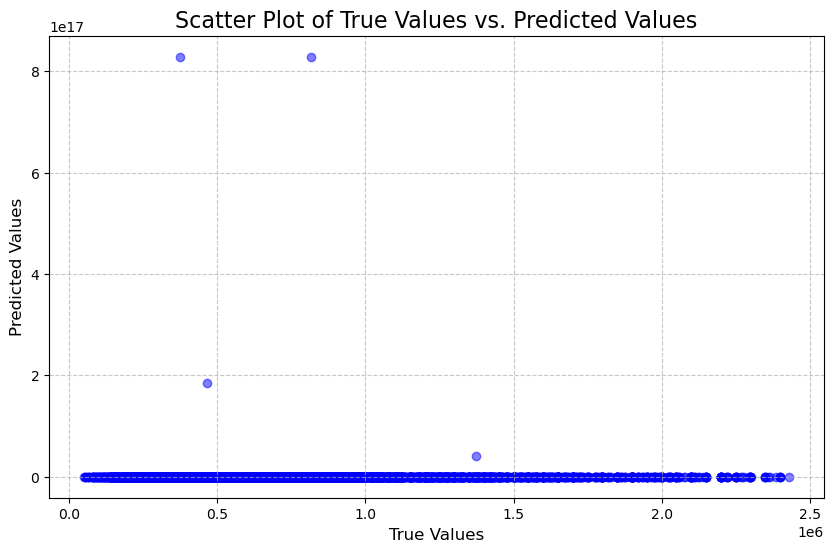

In [22]:
evaluate_model_regression(LinearRegression(), 'Linear Regression', X_train, y_train, X_test, y_test)

Training score : 0.7827894371872158
Testing score : 0.7773487350963223
R2 score : 0.7773487350963223
MAE : 109971.17916344406
MSE : 28831685486.515907
RMSE : 169798.956081938


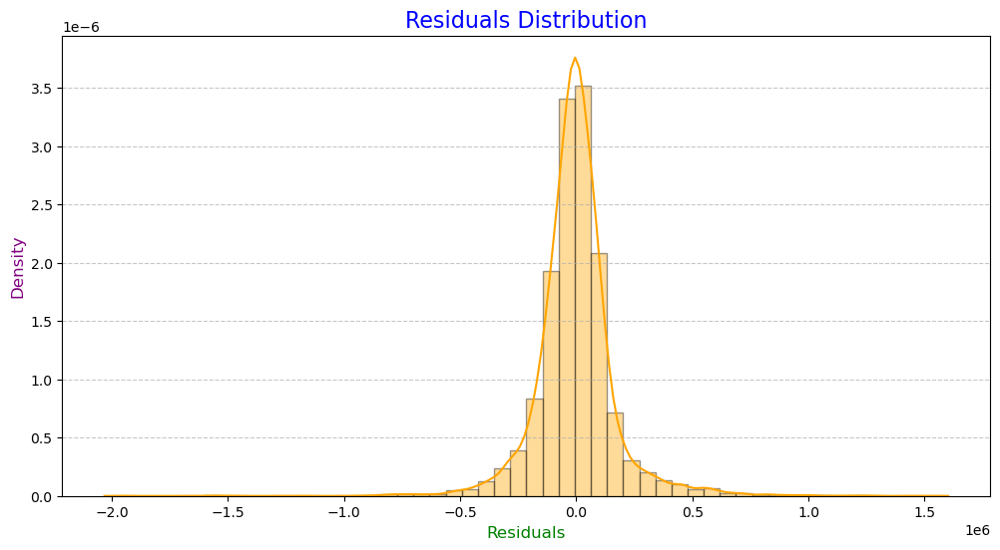

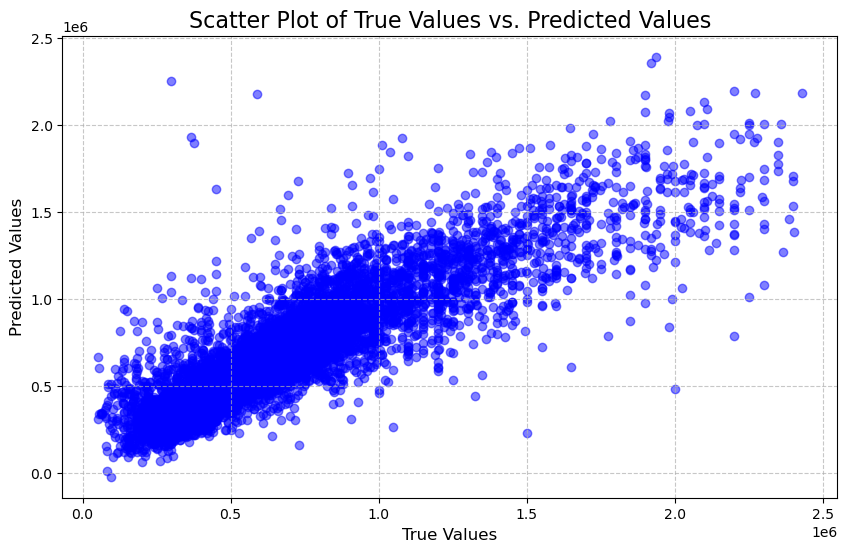

In [23]:
evaluate_model_regression(Ridge(), 'Ridge', X_train, y_train, X_test, y_test)

Training score : 0.7827866668493186
Testing score : 0.7773330829190521
R2 score : 0.7773330829190521
MAE : 109972.06047444072
MSE : 28833712327.24563
RMSE : 169804.9243315565


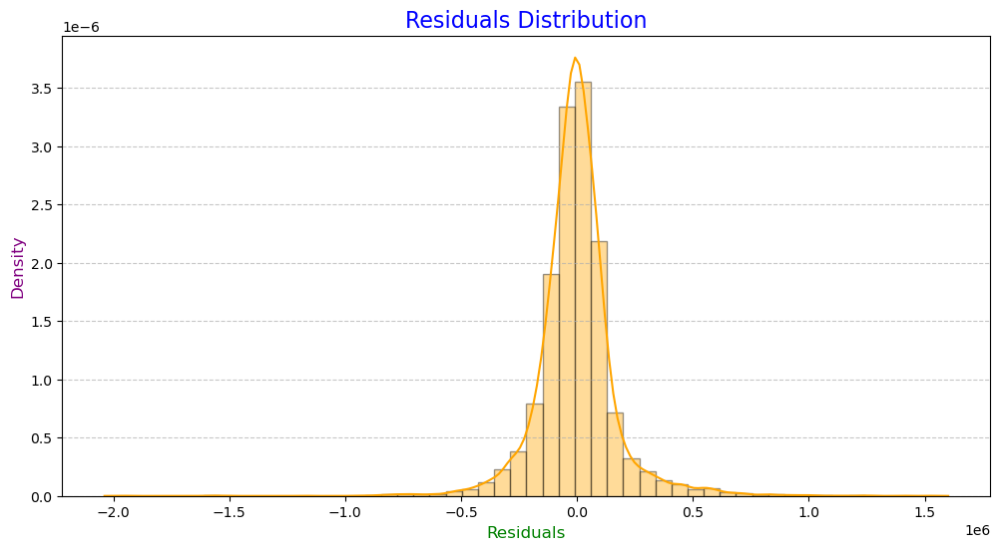

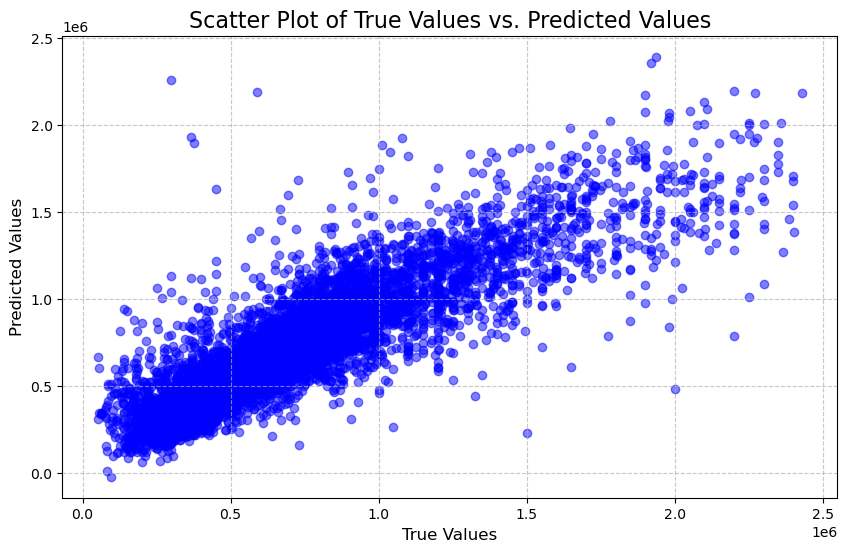

In [24]:
evaluate_model_regression(Lasso(), 'Lasso', X_train, y_train, X_test, y_test)

In [ ]:
evaluate_model_regression(SVR(), 'SVM', X_train, y_train, X_test, y_test)

In [ ]:
evaluate_model_regression(DecisionTreeRegressor(), 'Decision Tree', X_train, y_train, X_test, y_test)

In [ ]:
evaluate_model_regression(XGBRegressor(), 'XG Boost', X_train, y_train, X_test, y_test)

In [ ]:
evaluate_model_regression(CatBoostRegressor(), 'Cat Boost', X_train, y_train, X_test, y_test)

In [ ]:
evaluate_model_regression(LGBMRegressor(), 'LGBM', X_train, y_train, X_test, y_test)

Segun los resultados obtenidos en la evaluación de los modelos de Machine Learning, se puede inferir que los valores que presenta la regresión lineal estan asociados a la evaluación de 4 puntos en especial que superan valores de 8e17. Dada las razones por las que este modelo en especial tiene resultados atipicos, para poder comparar todos los demas modelos se reemplazara el "**Testing Score**"" por un valor de -1 para "**Linear Regression**" que sigue significando 

In [25]:
df_results = pd.DataFrame(evaluation_results)
pd.options.display.float_format = "{:,.3f}".format
df_results = df_results.sort_values(by='Testing Score',ascending=False)
df_results = df_results.reset_index(drop=True)
df_results.loc[df_results['Testing Score'] < -1, 'Testing Score'] = -0.1
df_results

,Model,Training Score,Testing Score
0,Ridge,0.783,0.777
1,Lasso,0.783,0.777
2,Linear Regression,0.783,-0.100


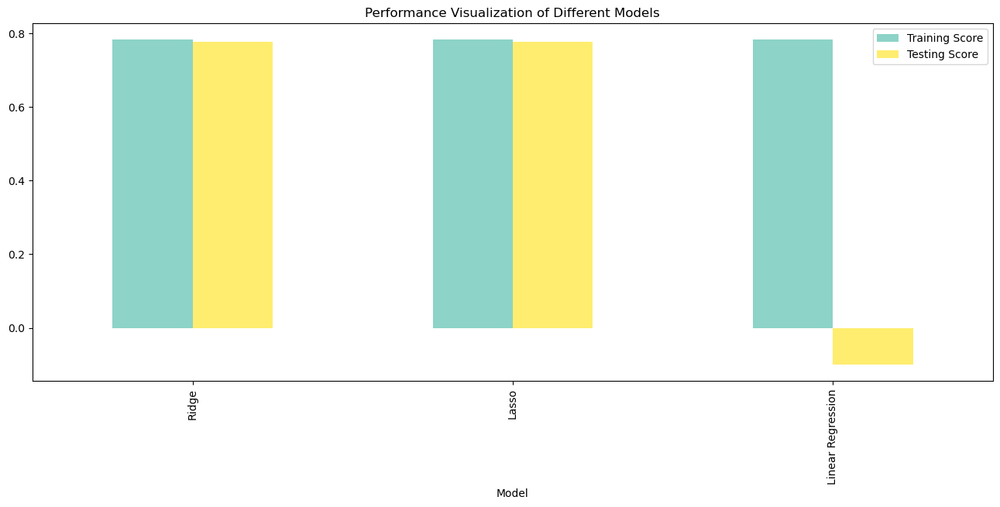

In [26]:
df_results.plot(x="Model",y=["Training Score","Testing Score"], figsize=(16,6),kind="bar",
        title="Performance Visualization of Different Models",colormap="Set3")
plt.show()

Despues de evaluar los modelos de regresión con los que trabajamos, los mejores resultados los obtuvo "**CatBoostRegressor()**". Asi que vamos a buscar los mejores valores de los hiperparametros para obtener mejores resultados y asi concluir nuestro proyecto con una eficiencia esperada conociendo los hiperparametros

In [27]:
param_grid = {
    'learning_rate': [0.1, 0.01, 0.001],
    'iterations': [100, 200, 500],
    'depth': [3, 5, 10],}
grid_search = GridSearchCV(CatBoostRegressor(), param_grid, cv=5)
grid_search.fit(X_train, y_train)

best_params = grid_search.best_params_
best_score = grid_search.best_score_

0:	learn: 341013.6882401	total: 65.3ms	remaining: 6.47s
1:	learn: 328073.1707378	total: 66.9ms	remaining: 3.28s
2:	learn: 316379.6091762	total: 68.2ms	remaining: 2.2s
3:	learn: 306377.3254828	total: 69.3ms	remaining: 1.66s
4:	learn: 297156.5494439	total: 70.5ms	remaining: 1.34s
5:	learn: 289314.6670546	total: 71.6ms	remaining: 1.12s
6:	learn: 282158.1042459	total: 72.8ms	remaining: 967ms
7:	learn: 275153.0867599	total: 73.9ms	remaining: 850ms
8:	learn: 269391.3978207	total: 75ms	remaining: 758ms
9:	learn: 263810.5562379	total: 76.1ms	remaining: 685ms
10:	learn: 259151.2731768	total: 77.3ms	remaining: 626ms
11:	learn: 255171.7532183	total: 78.5ms	remaining: 576ms
12:	learn: 250928.7759914	total: 79.7ms	remaining: 533ms
13:	learn: 247449.8675213	total: 81ms	remaining: 498ms
14:	learn: 244308.8961026	total: 82.2ms	remaining: 466ms
15:	learn: 241408.2681194	total: 83.5ms	remaining: 438ms
16:	learn: 238793.3722041	total: 84.9ms	remaining: 414ms
17:	learn: 236216.6244636	total: 86.1ms	remain

0:	learn: 339543.6499514	total: 1.46ms	remaining: 145ms
1:	learn: 326346.7430828	total: 3.06ms	remaining: 150ms
2:	learn: 315265.4822675	total: 4.47ms	remaining: 145ms
3:	learn: 304988.6931036	total: 6.08ms	remaining: 146ms
4:	learn: 296412.5878843	total: 7.46ms	remaining: 142ms
5:	learn: 288295.6330719	total: 8.93ms	remaining: 140ms
6:	learn: 280921.6226571	total: 10.6ms	remaining: 141ms
7:	learn: 273933.2878397	total: 12.1ms	remaining: 139ms
8:	learn: 268606.7498261	total: 13.6ms	remaining: 138ms
9:	learn: 262938.0022448	total: 15ms	remaining: 135ms
10:	learn: 258471.8354167	total: 17.2ms	remaining: 139ms
11:	learn: 254171.5427375	total: 18.5ms	remaining: 136ms
12:	learn: 249357.6262313	total: 19.9ms	remaining: 133ms
13:	learn: 246124.9911948	total: 21.3ms	remaining: 131ms
14:	learn: 243132.8175714	total: 22.7ms	remaining: 129ms
15:	learn: 239951.6383978	total: 24.1ms	remaining: 126ms
16:	learn: 236903.4035913	total: 25.4ms	remaining: 124ms
17:	learn: 234617.3453053	total: 26.7ms	rem

0:	learn: 339409.7925967	total: 1.42ms	remaining: 141ms
1:	learn: 326395.8462778	total: 2.74ms	remaining: 134ms
2:	learn: 314666.4907554	total: 3.99ms	remaining: 129ms
3:	learn: 304404.1181340	total: 5.27ms	remaining: 127ms
4:	learn: 295684.9263070	total: 6.55ms	remaining: 125ms
5:	learn: 287578.2279255	total: 7.83ms	remaining: 123ms
6:	learn: 280881.6012955	total: 9.07ms	remaining: 120ms
7:	learn: 273945.6625634	total: 10.4ms	remaining: 120ms
8:	learn: 268441.2745885	total: 11.7ms	remaining: 119ms
9:	learn: 264026.2491082	total: 13ms	remaining: 117ms
10:	learn: 259705.4849568	total: 14.3ms	remaining: 116ms
11:	learn: 255461.1773975	total: 15.6ms	remaining: 114ms
12:	learn: 252160.9714090	total: 17ms	remaining: 114ms
13:	learn: 248603.5832868	total: 18.4ms	remaining: 113ms
14:	learn: 245476.3659242	total: 19.6ms	remaining: 111ms
15:	learn: 242623.9961341	total: 20.9ms	remaining: 110ms
16:	learn: 238672.6117642	total: 22.3ms	remaining: 109ms
17:	learn: 235119.0240842	total: 23.7ms	remai

0:	learn: 354142.0490177	total: 1.3ms	remaining: 129ms
1:	learn: 352614.0359378	total: 2.52ms	remaining: 123ms
2:	learn: 351137.2381319	total: 4.1ms	remaining: 132ms
3:	learn: 349649.4889474	total: 5.57ms	remaining: 134ms
4:	learn: 348192.9790056	total: 6.85ms	remaining: 130ms
5:	learn: 346755.7305657	total: 8.22ms	remaining: 129ms
6:	learn: 345345.5225405	total: 9.62ms	remaining: 128ms
7:	learn: 343938.5433196	total: 11ms	remaining: 127ms
8:	learn: 342563.1998720	total: 12.1ms	remaining: 123ms
9:	learn: 341212.1483444	total: 13.4ms	remaining: 121ms
10:	learn: 339874.4349720	total: 14.6ms	remaining: 118ms
11:	learn: 338550.4909991	total: 15.9ms	remaining: 117ms
12:	learn: 337246.0804131	total: 17.1ms	remaining: 114ms
13:	learn: 335979.9976066	total: 18.3ms	remaining: 112ms
14:	learn: 334765.3214605	total: 19.6ms	remaining: 111ms
15:	learn: 333536.4284629	total: 20.8ms	remaining: 109ms
16:	learn: 332290.6173049	total: 22.2ms	remaining: 108ms
17:	learn: 331040.4727339	total: 23.4ms	remai

0:	learn: 347515.2069258	total: 2.68ms	remaining: 265ms
1:	learn: 346017.8717653	total: 5.65ms	remaining: 277ms
2:	learn: 344556.8325519	total: 8.44ms	remaining: 273ms
3:	learn: 343122.1981385	total: 11.4ms	remaining: 275ms
4:	learn: 341710.4323978	total: 13.3ms	remaining: 253ms
5:	learn: 340266.7761724	total: 15.9ms	remaining: 250ms
6:	learn: 338877.1490850	total: 17.3ms	remaining: 230ms
7:	learn: 337526.0769848	total: 18.6ms	remaining: 214ms
8:	learn: 336174.7256440	total: 20.1ms	remaining: 203ms
9:	learn: 334820.7995318	total: 21.3ms	remaining: 192ms
10:	learn: 333484.2653855	total: 22.7ms	remaining: 184ms
11:	learn: 332182.9281935	total: 24ms	remaining: 176ms
12:	learn: 330883.2692283	total: 25.3ms	remaining: 169ms
13:	learn: 329622.2119186	total: 26.5ms	remaining: 162ms
14:	learn: 328370.0596959	total: 27.7ms	remaining: 157ms
15:	learn: 327151.1147314	total: 29ms	remaining: 152ms
16:	learn: 325928.2766018	total: 30.3ms	remaining: 148ms
17:	learn: 324673.3703969	total: 31.6ms	remai

0:	learn: 356177.0608385	total: 1.45ms	remaining: 143ms
1:	learn: 356019.0395037	total: 2.68ms	remaining: 131ms
2:	learn: 355863.8238157	total: 4ms	remaining: 129ms
3:	learn: 355709.9596119	total: 5.23ms	remaining: 126ms
4:	learn: 355555.2781768	total: 6.42ms	remaining: 122ms
5:	learn: 355399.1933080	total: 7.65ms	remaining: 120ms
6:	learn: 355243.9220239	total: 8.82ms	remaining: 117ms
7:	learn: 355092.9812811	total: 10.4ms	remaining: 119ms
8:	learn: 354941.8099021	total: 11.8ms	remaining: 120ms
9:	learn: 354787.5664447	total: 13.1ms	remaining: 118ms
10:	learn: 354634.5187036	total: 14.3ms	remaining: 116ms
11:	learn: 354479.5742826	total: 15.5ms	remaining: 114ms
12:	learn: 354326.8355228	total: 16.7ms	remaining: 112ms
13:	learn: 354173.3506550	total: 18ms	remaining: 110ms
14:	learn: 354021.7428721	total: 19.2ms	remaining: 109ms
15:	learn: 353869.7571320	total: 20.6ms	remaining: 108ms
16:	learn: 353722.2134624	total: 21.7ms	remaining: 106ms
17:	learn: 353573.7592815	total: 23.1ms	remain

0:	learn: 354416.1690134	total: 1.32ms	remaining: 131ms
1:	learn: 354261.9098806	total: 2.62ms	remaining: 128ms
2:	learn: 354107.1898101	total: 3.91ms	remaining: 127ms
3:	learn: 353954.0031206	total: 5.3ms	remaining: 127ms
4:	learn: 353803.4263140	total: 6.5ms	remaining: 123ms
5:	learn: 353648.7023732	total: 7.84ms	remaining: 123ms
6:	learn: 353497.1326194	total: 9.24ms	remaining: 123ms
7:	learn: 353342.3036308	total: 10.5ms	remaining: 121ms
8:	learn: 353192.0266636	total: 11.9ms	remaining: 121ms
9:	learn: 353039.1283616	total: 13.4ms	remaining: 120ms
10:	learn: 352888.5190294	total: 14.6ms	remaining: 118ms
11:	learn: 352745.7201981	total: 15.7ms	remaining: 115ms
12:	learn: 352594.0198178	total: 17ms	remaining: 113ms
13:	learn: 352446.0238276	total: 18.4ms	remaining: 113ms
14:	learn: 352294.8231063	total: 19.8ms	remaining: 112ms
15:	learn: 352143.6595763	total: 21.2ms	remaining: 111ms
16:	learn: 351995.6735197	total: 22.5ms	remaining: 110ms
17:	learn: 351845.4365177	total: 23.8ms	remai

0:	learn: 354422.6744889	total: 1.45ms	remaining: 144ms
1:	learn: 354275.0626695	total: 2.8ms	remaining: 137ms
2:	learn: 354124.6289045	total: 4.12ms	remaining: 133ms
3:	learn: 353970.2255988	total: 5.39ms	remaining: 129ms
4:	learn: 353816.3314002	total: 6.65ms	remaining: 126ms
5:	learn: 353660.8813700	total: 7.87ms	remaining: 123ms
6:	learn: 353508.7815599	total: 9.83ms	remaining: 131ms
7:	learn: 353356.4267442	total: 11.3ms	remaining: 130ms
8:	learn: 353204.7990452	total: 12.8ms	remaining: 129ms
9:	learn: 353051.9616409	total: 14.2ms	remaining: 128ms
10:	learn: 352902.0956648	total: 15.6ms	remaining: 126ms
11:	learn: 352752.0594252	total: 16.8ms	remaining: 123ms
12:	learn: 352599.6840502	total: 18.1ms	remaining: 121ms
13:	learn: 352450.4268818	total: 19.5ms	remaining: 120ms
14:	learn: 352299.3067576	total: 20.7ms	remaining: 117ms
15:	learn: 352147.2178407	total: 21.9ms	remaining: 115ms
16:	learn: 352000.0418171	total: 23.4ms	remaining: 114ms
17:	learn: 351849.9991362	total: 24.7ms	re

157:	learn: 159513.8725477	total: 198ms	remaining: 52.7ms
158:	learn: 159369.0990242	total: 200ms	remaining: 51.4ms
159:	learn: 159233.2880988	total: 201ms	remaining: 50.2ms
160:	learn: 159139.3586836	total: 202ms	remaining: 48.9ms
161:	learn: 159015.3376755	total: 203ms	remaining: 47.6ms
162:	learn: 158899.7487712	total: 204ms	remaining: 46.4ms
163:	learn: 158841.6039195	total: 206ms	remaining: 45.1ms
164:	learn: 158717.9664818	total: 207ms	remaining: 43.8ms
165:	learn: 158651.4507018	total: 208ms	remaining: 42.6ms
166:	learn: 158552.9580529	total: 209ms	remaining: 41.3ms
167:	learn: 158455.6740946	total: 211ms	remaining: 40.1ms
168:	learn: 158392.4183175	total: 212ms	remaining: 38.9ms
169:	learn: 158314.9698151	total: 213ms	remaining: 37.6ms
170:	learn: 158150.3065977	total: 214ms	remaining: 36.4ms
171:	learn: 158036.9981783	total: 216ms	remaining: 35.1ms
172:	learn: 157932.9317226	total: 217ms	remaining: 33.9ms
173:	learn: 157792.5360177	total: 218ms	remaining: 32.6ms
174:	learn: 15

0:	learn: 339543.6499514	total: 1.37ms	remaining: 273ms
1:	learn: 326346.7430828	total: 2.89ms	remaining: 286ms
2:	learn: 315265.4822675	total: 4.26ms	remaining: 280ms
3:	learn: 304988.6931036	total: 5.53ms	remaining: 271ms
4:	learn: 296412.5878843	total: 6.96ms	remaining: 271ms
5:	learn: 288295.6330719	total: 8.23ms	remaining: 266ms
6:	learn: 280921.6226571	total: 9.53ms	remaining: 263ms
7:	learn: 273933.2878397	total: 10.8ms	remaining: 259ms
8:	learn: 268606.7498261	total: 12ms	remaining: 255ms
9:	learn: 262938.0022448	total: 13.5ms	remaining: 257ms
10:	learn: 258471.8354167	total: 14.9ms	remaining: 255ms
11:	learn: 254171.5427375	total: 16.1ms	remaining: 252ms
12:	learn: 249357.6262313	total: 17.3ms	remaining: 249ms
13:	learn: 246124.9911948	total: 18.6ms	remaining: 247ms
14:	learn: 243132.8175714	total: 19.8ms	remaining: 244ms
15:	learn: 239951.6383978	total: 21.1ms	remaining: 242ms
16:	learn: 236903.4035913	total: 22.5ms	remaining: 242ms
17:	learn: 234617.3453053	total: 23.8ms	rem

153:	learn: 159140.9031131	total: 197ms	remaining: 58.7ms
154:	learn: 159027.7296549	total: 198ms	remaining: 57.4ms
155:	learn: 158942.3157500	total: 199ms	remaining: 56.2ms
156:	learn: 158777.1582675	total: 200ms	remaining: 54.9ms
157:	learn: 158696.5841697	total: 202ms	remaining: 53.6ms
158:	learn: 158578.2604137	total: 203ms	remaining: 52.3ms
159:	learn: 158499.5827873	total: 204ms	remaining: 51ms
160:	learn: 158364.4470324	total: 205ms	remaining: 49.7ms
161:	learn: 158238.8551169	total: 207ms	remaining: 48.5ms
162:	learn: 158125.8133317	total: 208ms	remaining: 47.3ms
163:	learn: 158048.4596055	total: 210ms	remaining: 46ms
164:	learn: 157936.7973669	total: 211ms	remaining: 44.7ms
165:	learn: 157808.7182690	total: 212ms	remaining: 43.4ms
166:	learn: 157625.2473031	total: 213ms	remaining: 42.1ms
167:	learn: 157346.7967607	total: 214ms	remaining: 40.8ms
168:	learn: 157267.2448860	total: 216ms	remaining: 39.5ms
169:	learn: 157137.8586008	total: 217ms	remaining: 38.3ms
170:	learn: 157023

152:	learn: 156461.6845115	total: 197ms	remaining: 60.5ms
153:	learn: 156386.7307435	total: 198ms	remaining: 59.3ms
154:	learn: 156252.8561459	total: 200ms	remaining: 58.1ms
155:	learn: 156166.3258114	total: 201ms	remaining: 56.8ms
156:	learn: 156029.6742918	total: 203ms	remaining: 55.5ms
157:	learn: 155960.0076444	total: 204ms	remaining: 54.3ms
158:	learn: 155870.4997800	total: 205ms	remaining: 53ms
159:	learn: 155745.8471945	total: 207ms	remaining: 51.7ms
160:	learn: 155609.2125784	total: 208ms	remaining: 50.4ms
161:	learn: 155526.4145299	total: 209ms	remaining: 49.1ms
162:	learn: 155445.2345017	total: 210ms	remaining: 47.7ms
163:	learn: 155388.3863489	total: 212ms	remaining: 46.5ms
164:	learn: 155335.2574223	total: 213ms	remaining: 45.2ms
165:	learn: 155228.0457998	total: 214ms	remaining: 43.9ms
166:	learn: 155050.6344696	total: 215ms	remaining: 42.6ms
167:	learn: 154925.1762283	total: 217ms	remaining: 41.3ms
168:	learn: 154796.3238318	total: 218ms	remaining: 40ms
169:	learn: 154696

193:	learn: 154997.9924041	total: 248ms	remaining: 7.68ms
194:	learn: 154866.7497225	total: 250ms	remaining: 6.41ms
195:	learn: 154821.2022239	total: 251ms	remaining: 5.13ms
196:	learn: 154732.8372513	total: 253ms	remaining: 3.85ms
197:	learn: 154652.9524063	total: 254ms	remaining: 2.57ms
198:	learn: 154594.5412759	total: 255ms	remaining: 1.28ms
199:	learn: 154495.1582276	total: 257ms	remaining: 0us
0:	learn: 354761.3120346	total: 1.44ms	remaining: 286ms
1:	learn: 353206.4457341	total: 2.68ms	remaining: 265ms
2:	learn: 351690.8257674	total: 4.43ms	remaining: 291ms
3:	learn: 350208.2273246	total: 5.72ms	remaining: 280ms
4:	learn: 348738.2468045	total: 7.05ms	remaining: 275ms
5:	learn: 347271.9003301	total: 8.4ms	remaining: 272ms
6:	learn: 345858.0692825	total: 9.62ms	remaining: 265ms
7:	learn: 344455.6873857	total: 10.8ms	remaining: 260ms
8:	learn: 343094.9899222	total: 12.1ms	remaining: 256ms
9:	learn: 341714.5297747	total: 13.3ms	remaining: 252ms
10:	learn: 340369.4523094	total: 14.5m

0:	learn: 354142.0490177	total: 1.47ms	remaining: 293ms
1:	learn: 352614.0359378	total: 2.96ms	remaining: 294ms
2:	learn: 351137.2381319	total: 4.36ms	remaining: 287ms
3:	learn: 349649.4889474	total: 5.59ms	remaining: 274ms
4:	learn: 348192.9790056	total: 6.88ms	remaining: 268ms
5:	learn: 346755.7305657	total: 8.2ms	remaining: 265ms
6:	learn: 345345.5225405	total: 9.9ms	remaining: 273ms
7:	learn: 343938.5433196	total: 11.2ms	remaining: 270ms
8:	learn: 342563.1998720	total: 12.5ms	remaining: 266ms
9:	learn: 341212.1483444	total: 13.8ms	remaining: 262ms
10:	learn: 339874.4349720	total: 15.1ms	remaining: 259ms
11:	learn: 338550.4909991	total: 16.4ms	remaining: 257ms
12:	learn: 337246.0804131	total: 17.6ms	remaining: 253ms
13:	learn: 335979.9976066	total: 19ms	remaining: 252ms
14:	learn: 334765.3214605	total: 20.2ms	remaining: 249ms
15:	learn: 333536.4284629	total: 21.5ms	remaining: 247ms
16:	learn: 332290.6173049	total: 22.6ms	remaining: 244ms
17:	learn: 331040.4727339	total: 23.8ms	remai

154:	learn: 244144.7020908	total: 198ms	remaining: 57.5ms
155:	learn: 243842.0505330	total: 200ms	remaining: 56.3ms
156:	learn: 243445.0198636	total: 201ms	remaining: 55.1ms
157:	learn: 243158.9570111	total: 203ms	remaining: 53.8ms
158:	learn: 242866.9625027	total: 204ms	remaining: 52.6ms
159:	learn: 242585.0549308	total: 205ms	remaining: 51.3ms
160:	learn: 242308.8136052	total: 207ms	remaining: 50.1ms
161:	learn: 242040.5013287	total: 208ms	remaining: 48.8ms
162:	learn: 241771.2705405	total: 210ms	remaining: 47.6ms
163:	learn: 241487.6620009	total: 211ms	remaining: 46.3ms
164:	learn: 241121.1812758	total: 212ms	remaining: 45ms
165:	learn: 240751.3489756	total: 213ms	remaining: 43.7ms
166:	learn: 240448.0921989	total: 215ms	remaining: 42.4ms
167:	learn: 240165.2939684	total: 216ms	remaining: 41.2ms
168:	learn: 239913.3952011	total: 217ms	remaining: 39.9ms
169:	learn: 239645.7546635	total: 219ms	remaining: 38.6ms
170:	learn: 239397.4714589	total: 220ms	remaining: 37.3ms
171:	learn: 2390

196:	learn: 231649.5269155	total: 253ms	remaining: 3.85ms
197:	learn: 231387.1903884	total: 254ms	remaining: 2.57ms
198:	learn: 231111.7410394	total: 256ms	remaining: 1.28ms
199:	learn: 230857.9900816	total: 257ms	remaining: 0us
0:	learn: 347515.2069258	total: 1.31ms	remaining: 260ms
1:	learn: 346017.8717653	total: 2.54ms	remaining: 252ms
2:	learn: 344556.8325519	total: 3.84ms	remaining: 252ms
3:	learn: 343122.1981385	total: 5.44ms	remaining: 266ms
4:	learn: 341710.4323978	total: 6.72ms	remaining: 262ms
5:	learn: 340266.7761724	total: 8.1ms	remaining: 262ms
6:	learn: 338877.1490850	total: 9.46ms	remaining: 261ms
7:	learn: 337526.0769848	total: 10.7ms	remaining: 256ms
8:	learn: 336174.7256440	total: 11.9ms	remaining: 253ms
9:	learn: 334820.7995318	total: 13.2ms	remaining: 251ms
10:	learn: 333484.2653855	total: 14.5ms	remaining: 249ms
11:	learn: 332182.9281935	total: 15.7ms	remaining: 246ms
12:	learn: 330883.2692283	total: 16.9ms	remaining: 243ms
13:	learn: 329622.2119186	total: 18.5ms	r

0:	learn: 353020.8347497	total: 1.41ms	remaining: 281ms
1:	learn: 351564.8772310	total: 2.98ms	remaining: 295ms
2:	learn: 350100.8761085	total: 4.44ms	remaining: 291ms
3:	learn: 348630.6047695	total: 5.69ms	remaining: 279ms
4:	learn: 347202.6349179	total: 6.94ms	remaining: 271ms
5:	learn: 345736.7277670	total: 8.3ms	remaining: 268ms
6:	learn: 344319.5907315	total: 9.83ms	remaining: 271ms
7:	learn: 342914.9975933	total: 11.3ms	remaining: 270ms
8:	learn: 341534.8769964	total: 12.6ms	remaining: 268ms
9:	learn: 340161.6117300	total: 13.8ms	remaining: 262ms
10:	learn: 338815.4234291	total: 15.3ms	remaining: 263ms
11:	learn: 337548.5577313	total: 16.7ms	remaining: 261ms
12:	learn: 336208.0637656	total: 17.9ms	remaining: 258ms
13:	learn: 334895.6176073	total: 19.2ms	remaining: 255ms
14:	learn: 333605.2759877	total: 20.6ms	remaining: 254ms
15:	learn: 332329.4343178	total: 21.9ms	remaining: 252ms
16:	learn: 331121.1934708	total: 23.1ms	remaining: 249ms
17:	learn: 329898.0446242	total: 24.4ms	re

153:	learn: 244371.4750338	total: 198ms	remaining: 59.1ms
154:	learn: 244069.6574296	total: 199ms	remaining: 57.8ms
155:	learn: 243769.7164821	total: 200ms	remaining: 56.5ms
156:	learn: 243428.9593479	total: 202ms	remaining: 55.2ms
157:	learn: 243164.3278532	total: 203ms	remaining: 53.9ms
158:	learn: 242882.6248734	total: 204ms	remaining: 52.6ms
159:	learn: 242649.3610440	total: 205ms	remaining: 51.3ms
160:	learn: 242299.3165303	total: 206ms	remaining: 50ms
161:	learn: 242013.8778700	total: 208ms	remaining: 48.7ms
162:	learn: 241698.3276566	total: 209ms	remaining: 47.4ms
163:	learn: 241415.7107088	total: 210ms	remaining: 46.2ms
164:	learn: 241159.7366493	total: 212ms	remaining: 44.9ms
165:	learn: 240829.6786631	total: 213ms	remaining: 43.7ms
166:	learn: 240529.6265666	total: 215ms	remaining: 42.4ms
167:	learn: 240281.0725979	total: 216ms	remaining: 41.1ms
168:	learn: 240009.4240225	total: 217ms	remaining: 39.8ms
169:	learn: 239730.5181384	total: 218ms	remaining: 38.6ms
170:	learn: 2393

0:	learn: 355499.0747327	total: 1.5ms	remaining: 299ms
1:	learn: 355343.6670340	total: 2.77ms	remaining: 274ms
2:	learn: 355192.1192157	total: 4.05ms	remaining: 266ms
3:	learn: 355037.5121880	total: 5.27ms	remaining: 258ms
4:	learn: 354884.1612289	total: 6.56ms	remaining: 256ms
5:	learn: 354734.9956894	total: 7.88ms	remaining: 255ms
6:	learn: 354582.7659575	total: 9.15ms	remaining: 252ms
7:	learn: 354430.0085336	total: 10.5ms	remaining: 253ms
8:	learn: 354279.5536924	total: 11.7ms	remaining: 248ms
9:	learn: 354125.8855910	total: 13ms	remaining: 247ms
10:	learn: 353975.6804530	total: 14.5ms	remaining: 249ms
11:	learn: 353825.0778924	total: 15.7ms	remaining: 245ms
12:	learn: 353674.1527418	total: 16.9ms	remaining: 242ms
13:	learn: 353522.5470741	total: 18.4ms	remaining: 244ms
14:	learn: 353369.6069033	total: 19.6ms	remaining: 242ms
15:	learn: 353222.1759038	total: 21ms	remaining: 241ms
16:	learn: 353068.2839863	total: 22.2ms	remaining: 239ms
17:	learn: 352916.2025956	total: 23.4ms	remain

155:	learn: 333978.1606096	total: 198ms	remaining: 55.9ms
156:	learn: 333857.6359853	total: 200ms	remaining: 54.7ms
157:	learn: 333730.6707724	total: 201ms	remaining: 53.4ms
158:	learn: 333602.0733450	total: 202ms	remaining: 52.1ms
159:	learn: 333476.0647141	total: 204ms	remaining: 50.9ms
160:	learn: 333350.8687067	total: 205ms	remaining: 49.7ms
161:	learn: 333225.1893065	total: 207ms	remaining: 48.5ms
162:	learn: 333099.6373582	total: 208ms	remaining: 47.2ms
163:	learn: 332975.2978760	total: 209ms	remaining: 46ms
164:	learn: 332850.9154406	total: 211ms	remaining: 44.7ms
165:	learn: 332729.0936377	total: 212ms	remaining: 43.4ms
166:	learn: 332604.0646121	total: 213ms	remaining: 42.1ms
167:	learn: 332479.8446145	total: 214ms	remaining: 40.8ms
168:	learn: 332358.3025374	total: 216ms	remaining: 39.6ms
169:	learn: 332235.9800326	total: 217ms	remaining: 38.3ms
170:	learn: 332109.1483763	total: 218ms	remaining: 37ms
171:	learn: 331987.0074152	total: 220ms	remaining: 35.8ms
172:	learn: 331867

198:	learn: 327613.9283942	total: 256ms	remaining: 1.28ms
199:	learn: 327493.1410278	total: 257ms	remaining: 0us
0:	learn: 348902.3953515	total: 1.24ms	remaining: 247ms
1:	learn: 348752.0264947	total: 2.64ms	remaining: 261ms
2:	learn: 348602.2425070	total: 3.96ms	remaining: 260ms
3:	learn: 348450.3673603	total: 5.24ms	remaining: 257ms
4:	learn: 348301.9974314	total: 6.52ms	remaining: 254ms
5:	learn: 348150.2253190	total: 7.81ms	remaining: 253ms
6:	learn: 348000.5860113	total: 9.06ms	remaining: 250ms
7:	learn: 347851.1286847	total: 10.3ms	remaining: 248ms
8:	learn: 347700.0047130	total: 11.6ms	remaining: 247ms
9:	learn: 347549.3486600	total: 12.9ms	remaining: 245ms
10:	learn: 347398.4551546	total: 14.1ms	remaining: 243ms
11:	learn: 347249.6286005	total: 15.4ms	remaining: 242ms
12:	learn: 347101.5630054	total: 16.8ms	remaining: 241ms
13:	learn: 346956.6678306	total: 18ms	remaining: 240ms
14:	learn: 346809.3833129	total: 19.5ms	remaining: 241ms
15:	learn: 346661.6787609	total: 20.8ms	rema

172:	learn: 325553.4616370	total: 221ms	remaining: 34.5ms
173:	learn: 325429.7015373	total: 222ms	remaining: 33.2ms
174:	learn: 325307.4060213	total: 224ms	remaining: 32ms
175:	learn: 325187.1673238	total: 225ms	remaining: 30.7ms
176:	learn: 325066.7426012	total: 226ms	remaining: 29.4ms
177:	learn: 324945.5056018	total: 228ms	remaining: 28.1ms
178:	learn: 324826.8279748	total: 229ms	remaining: 26.8ms
179:	learn: 324708.2833819	total: 230ms	remaining: 25.6ms
180:	learn: 324585.7739361	total: 231ms	remaining: 24.3ms
181:	learn: 324464.5834442	total: 233ms	remaining: 23ms
182:	learn: 324345.4422545	total: 234ms	remaining: 21.8ms
183:	learn: 324222.7962651	total: 235ms	remaining: 20.5ms
184:	learn: 324101.1679286	total: 237ms	remaining: 19.2ms
185:	learn: 323980.8851136	total: 238ms	remaining: 17.9ms
186:	learn: 323860.3148732	total: 239ms	remaining: 16.6ms
187:	learn: 323739.1127073	total: 241ms	remaining: 15.4ms
188:	learn: 323618.3453099	total: 242ms	remaining: 14.1ms
189:	learn: 323496

0:	learn: 341013.6882401	total: 1.52ms	remaining: 759ms
1:	learn: 328073.1707378	total: 3.07ms	remaining: 764ms
2:	learn: 316379.6091762	total: 4.59ms	remaining: 761ms
3:	learn: 306377.3254828	total: 5.97ms	remaining: 740ms
4:	learn: 297156.5494439	total: 7.42ms	remaining: 734ms
5:	learn: 289314.6670546	total: 8.69ms	remaining: 715ms
6:	learn: 282158.1042459	total: 10ms	remaining: 706ms
7:	learn: 275153.0867599	total: 11.3ms	remaining: 696ms
8:	learn: 269391.3978207	total: 12.5ms	remaining: 683ms
9:	learn: 263810.5562379	total: 13.9ms	remaining: 679ms
10:	learn: 259151.2731768	total: 15.2ms	remaining: 676ms
11:	learn: 255171.7532183	total: 16.6ms	remaining: 677ms
12:	learn: 250928.7759914	total: 18ms	remaining: 675ms
13:	learn: 247449.8675213	total: 19.4ms	remaining: 672ms
14:	learn: 244308.8961026	total: 20.7ms	remaining: 670ms
15:	learn: 241408.2681194	total: 22ms	remaining: 665ms
16:	learn: 238793.3722041	total: 23.3ms	remaining: 662ms
17:	learn: 236216.6244636	total: 24.6ms	remaini

156:	learn: 159639.0791971	total: 197ms	remaining: 431ms
157:	learn: 159513.8725477	total: 199ms	remaining: 430ms
158:	learn: 159369.0990242	total: 200ms	remaining: 429ms
159:	learn: 159233.2880988	total: 201ms	remaining: 427ms
160:	learn: 159139.3586836	total: 202ms	remaining: 426ms
161:	learn: 159015.3376755	total: 203ms	remaining: 425ms
162:	learn: 158899.7487712	total: 205ms	remaining: 423ms
163:	learn: 158841.6039195	total: 206ms	remaining: 422ms
164:	learn: 158717.9664818	total: 207ms	remaining: 420ms
165:	learn: 158651.4507018	total: 208ms	remaining: 419ms
166:	learn: 158552.9580529	total: 210ms	remaining: 418ms
167:	learn: 158455.6740946	total: 211ms	remaining: 417ms
168:	learn: 158392.4183175	total: 212ms	remaining: 416ms
169:	learn: 158314.9698151	total: 214ms	remaining: 415ms
170:	learn: 158150.3065977	total: 215ms	remaining: 413ms
171:	learn: 158036.9981783	total: 216ms	remaining: 412ms
172:	learn: 157932.9317226	total: 217ms	remaining: 410ms
173:	learn: 157792.5360177	tota

314:	learn: 147833.7686742	total: 392ms	remaining: 230ms
315:	learn: 147794.0034706	total: 393ms	remaining: 229ms
316:	learn: 147728.8634378	total: 395ms	remaining: 228ms
317:	learn: 147676.6122563	total: 396ms	remaining: 227ms
318:	learn: 147615.5126631	total: 397ms	remaining: 225ms
319:	learn: 147573.3999493	total: 398ms	remaining: 224ms
320:	learn: 147538.4261720	total: 400ms	remaining: 223ms
321:	learn: 147481.9424005	total: 401ms	remaining: 222ms
322:	learn: 147430.2806207	total: 402ms	remaining: 220ms
323:	learn: 147378.5561166	total: 404ms	remaining: 219ms
324:	learn: 147314.3430192	total: 405ms	remaining: 218ms
325:	learn: 147290.0946284	total: 406ms	remaining: 217ms
326:	learn: 147250.8733168	total: 408ms	remaining: 216ms
327:	learn: 147223.1114988	total: 409ms	remaining: 214ms
328:	learn: 147157.5362589	total: 410ms	remaining: 213ms
329:	learn: 147118.7424059	total: 411ms	remaining: 212ms
330:	learn: 147076.0907782	total: 413ms	remaining: 211ms
331:	learn: 147048.3110731	tota

471:	learn: 141066.7962864	total: 588ms	remaining: 34.9ms
472:	learn: 141045.1945054	total: 590ms	remaining: 33.7ms
473:	learn: 141003.9973257	total: 591ms	remaining: 32.4ms
474:	learn: 140960.9658311	total: 592ms	remaining: 31.2ms
475:	learn: 140935.8964280	total: 593ms	remaining: 29.9ms
476:	learn: 140901.9564284	total: 594ms	remaining: 28.7ms
477:	learn: 140848.2509405	total: 596ms	remaining: 27.4ms
478:	learn: 140827.6085621	total: 597ms	remaining: 26.2ms
479:	learn: 140802.3315319	total: 598ms	remaining: 24.9ms
480:	learn: 140752.0456780	total: 599ms	remaining: 23.7ms
481:	learn: 140693.8007041	total: 601ms	remaining: 22.4ms
482:	learn: 140661.5933970	total: 602ms	remaining: 21.2ms
483:	learn: 140608.0509381	total: 603ms	remaining: 19.9ms
484:	learn: 140566.5203611	total: 605ms	remaining: 18.7ms
485:	learn: 140550.1988084	total: 606ms	remaining: 17.5ms
486:	learn: 140502.1261243	total: 607ms	remaining: 16.2ms
487:	learn: 140487.5757929	total: 609ms	remaining: 15ms
488:	learn: 1404

217:	learn: 154102.0567686	total: 275ms	remaining: 356ms
218:	learn: 154036.5899504	total: 277ms	remaining: 355ms
219:	learn: 153959.3314055	total: 278ms	remaining: 354ms
220:	learn: 153909.7343808	total: 279ms	remaining: 352ms
221:	learn: 153807.7159443	total: 280ms	remaining: 351ms
222:	learn: 153654.6564849	total: 282ms	remaining: 350ms
223:	learn: 153548.7513768	total: 283ms	remaining: 348ms
224:	learn: 153490.2007053	total: 284ms	remaining: 347ms
225:	learn: 153428.8848234	total: 285ms	remaining: 346ms
226:	learn: 153411.6431481	total: 286ms	remaining: 344ms
227:	learn: 153345.1088220	total: 288ms	remaining: 343ms
228:	learn: 153253.3734224	total: 289ms	remaining: 342ms
229:	learn: 153164.2273824	total: 291ms	remaining: 341ms
230:	learn: 153082.1633308	total: 292ms	remaining: 340ms
231:	learn: 152921.5794991	total: 293ms	remaining: 339ms
232:	learn: 152840.8074506	total: 295ms	remaining: 338ms
233:	learn: 152716.2245287	total: 296ms	remaining: 336ms
234:	learn: 152623.5650956	tota

374:	learn: 144049.2621169	total: 471ms	remaining: 157ms
375:	learn: 144016.9460587	total: 472ms	remaining: 156ms
376:	learn: 143972.2075979	total: 474ms	remaining: 155ms
377:	learn: 143905.8161596	total: 475ms	remaining: 153ms
378:	learn: 143897.9649416	total: 476ms	remaining: 152ms
379:	learn: 143839.2084624	total: 477ms	remaining: 151ms
380:	learn: 143783.4139629	total: 478ms	remaining: 149ms
381:	learn: 143718.7922150	total: 480ms	remaining: 148ms
382:	learn: 143665.9112524	total: 481ms	remaining: 147ms
383:	learn: 143625.0708969	total: 482ms	remaining: 146ms
384:	learn: 143595.2286794	total: 484ms	remaining: 144ms
385:	learn: 143551.9774793	total: 485ms	remaining: 143ms
386:	learn: 143514.2811803	total: 486ms	remaining: 142ms
387:	learn: 143481.4066650	total: 487ms	remaining: 141ms
388:	learn: 143442.0517329	total: 488ms	remaining: 139ms
389:	learn: 143414.6460138	total: 490ms	remaining: 138ms
390:	learn: 143354.7640089	total: 491ms	remaining: 137ms
391:	learn: 143271.3573443	tota

157:	learn: 158696.5841697	total: 198ms	remaining: 428ms
158:	learn: 158578.2604137	total: 199ms	remaining: 427ms
159:	learn: 158499.5827873	total: 200ms	remaining: 426ms
160:	learn: 158364.4470324	total: 202ms	remaining: 425ms
161:	learn: 158238.8551169	total: 203ms	remaining: 424ms
162:	learn: 158125.8133317	total: 204ms	remaining: 422ms
163:	learn: 158048.4596055	total: 205ms	remaining: 421ms
164:	learn: 157936.7973669	total: 207ms	remaining: 420ms
165:	learn: 157808.7182690	total: 208ms	remaining: 419ms
166:	learn: 157625.2473031	total: 210ms	remaining: 418ms
167:	learn: 157346.7967607	total: 211ms	remaining: 417ms
168:	learn: 157267.2448860	total: 212ms	remaining: 416ms
169:	learn: 157137.8586008	total: 214ms	remaining: 415ms
170:	learn: 157023.5000358	total: 215ms	remaining: 414ms
171:	learn: 156928.8963894	total: 216ms	remaining: 412ms
172:	learn: 156815.8229196	total: 218ms	remaining: 411ms
173:	learn: 156698.5061184	total: 219ms	remaining: 410ms
174:	learn: 156603.9841753	tota

312:	learn: 145871.8002231	total: 394ms	remaining: 235ms
313:	learn: 145801.2019968	total: 395ms	remaining: 234ms
314:	learn: 145743.3820111	total: 396ms	remaining: 233ms
315:	learn: 145667.8244596	total: 398ms	remaining: 232ms
316:	learn: 145621.6660881	total: 399ms	remaining: 230ms
317:	learn: 145551.1207635	total: 400ms	remaining: 229ms
318:	learn: 145498.0515678	total: 401ms	remaining: 228ms
319:	learn: 145447.4065041	total: 403ms	remaining: 226ms
320:	learn: 145384.6195626	total: 404ms	remaining: 225ms
321:	learn: 145312.6377224	total: 405ms	remaining: 224ms
322:	learn: 145280.4710810	total: 407ms	remaining: 223ms
323:	learn: 145226.0350388	total: 408ms	remaining: 222ms
324:	learn: 145188.6502534	total: 409ms	remaining: 220ms
325:	learn: 145106.1780945	total: 410ms	remaining: 219ms
326:	learn: 145040.0138141	total: 411ms	remaining: 218ms
327:	learn: 144997.7690662	total: 413ms	remaining: 216ms
328:	learn: 144932.0679379	total: 414ms	remaining: 215ms
329:	learn: 144868.9961108	tota

470:	learn: 138787.0763364	total: 590ms	remaining: 36.3ms
471:	learn: 138750.3446087	total: 591ms	remaining: 35.1ms
472:	learn: 138728.2241157	total: 593ms	remaining: 33.8ms
473:	learn: 138670.5015465	total: 594ms	remaining: 32.6ms
474:	learn: 138630.8938391	total: 595ms	remaining: 31.3ms
475:	learn: 138606.2523524	total: 596ms	remaining: 30.1ms
476:	learn: 138580.6005571	total: 597ms	remaining: 28.8ms
477:	learn: 138531.9901249	total: 599ms	remaining: 27.6ms
478:	learn: 138479.1368470	total: 600ms	remaining: 26.3ms
479:	learn: 138435.4720070	total: 601ms	remaining: 25.1ms
480:	learn: 138405.0613201	total: 603ms	remaining: 23.8ms
481:	learn: 138380.7201303	total: 604ms	remaining: 22.5ms
482:	learn: 138355.1454948	total: 605ms	remaining: 21.3ms
483:	learn: 138320.7009117	total: 607ms	remaining: 20.1ms
484:	learn: 138289.7108567	total: 608ms	remaining: 18.8ms
485:	learn: 138235.5139088	total: 609ms	remaining: 17.5ms
486:	learn: 138200.3454457	total: 610ms	remaining: 16.3ms
487:	learn: 13

218:	learn: 149993.1111650	total: 274ms	remaining: 352ms
219:	learn: 149904.3659594	total: 275ms	remaining: 351ms
220:	learn: 149884.0249693	total: 277ms	remaining: 349ms
221:	learn: 149762.0927353	total: 278ms	remaining: 348ms
222:	learn: 149742.7593184	total: 279ms	remaining: 346ms
223:	learn: 149649.5430015	total: 280ms	remaining: 345ms
224:	learn: 149570.8182056	total: 281ms	remaining: 344ms
225:	learn: 149519.7709279	total: 283ms	remaining: 343ms
226:	learn: 149404.6988014	total: 284ms	remaining: 341ms
227:	learn: 149307.1736750	total: 285ms	remaining: 340ms
228:	learn: 149252.6341579	total: 287ms	remaining: 339ms
229:	learn: 149153.0025912	total: 288ms	remaining: 338ms
230:	learn: 149103.1737410	total: 289ms	remaining: 337ms
231:	learn: 149000.7577141	total: 291ms	remaining: 336ms
232:	learn: 148929.0511324	total: 292ms	remaining: 334ms
233:	learn: 148863.1423083	total: 293ms	remaining: 333ms
234:	learn: 148815.5558037	total: 295ms	remaining: 332ms
235:	learn: 148751.0996488	tota

374:	learn: 140842.2470893	total: 471ms	remaining: 157ms
375:	learn: 140792.7408415	total: 472ms	remaining: 156ms
376:	learn: 140742.7236822	total: 473ms	remaining: 154ms
377:	learn: 140716.1953365	total: 474ms	remaining: 153ms
378:	learn: 140677.5429799	total: 476ms	remaining: 152ms
379:	learn: 140664.2951627	total: 477ms	remaining: 151ms
380:	learn: 140622.6633482	total: 478ms	remaining: 149ms
381:	learn: 140581.7931487	total: 479ms	remaining: 148ms
382:	learn: 140530.2751614	total: 480ms	remaining: 147ms
383:	learn: 140484.3578096	total: 482ms	remaining: 146ms
384:	learn: 140431.9582361	total: 483ms	remaining: 144ms
385:	learn: 140410.9498262	total: 485ms	remaining: 143ms
386:	learn: 140387.3916113	total: 486ms	remaining: 142ms
387:	learn: 140343.7964069	total: 487ms	remaining: 141ms
388:	learn: 140297.4293860	total: 489ms	remaining: 139ms
389:	learn: 140268.7303936	total: 490ms	remaining: 138ms
390:	learn: 140230.1705812	total: 491ms	remaining: 137ms
391:	learn: 140207.9998891	tota

154:	learn: 159045.5520575	total: 197ms	remaining: 438ms
155:	learn: 158948.9073520	total: 198ms	remaining: 437ms
156:	learn: 158840.1599811	total: 200ms	remaining: 436ms
157:	learn: 158654.0998152	total: 201ms	remaining: 435ms
158:	learn: 158553.7161467	total: 202ms	remaining: 433ms
159:	learn: 158404.8928132	total: 203ms	remaining: 432ms
160:	learn: 158320.7916393	total: 205ms	remaining: 431ms
161:	learn: 158132.3485648	total: 206ms	remaining: 429ms
162:	learn: 158016.9489825	total: 207ms	remaining: 428ms
163:	learn: 157940.3390824	total: 208ms	remaining: 427ms
164:	learn: 157863.1721375	total: 210ms	remaining: 426ms
165:	learn: 157784.8047363	total: 211ms	remaining: 425ms
166:	learn: 157651.6734078	total: 213ms	remaining: 424ms
167:	learn: 157558.3544415	total: 214ms	remaining: 423ms
168:	learn: 157455.5562874	total: 215ms	remaining: 422ms
169:	learn: 157331.0343736	total: 216ms	remaining: 420ms
170:	learn: 157252.7898911	total: 218ms	remaining: 419ms
171:	learn: 157195.4911042	tota

311:	learn: 146910.0941548	total: 394ms	remaining: 237ms
312:	learn: 146873.8390524	total: 395ms	remaining: 236ms
313:	learn: 146798.5539514	total: 396ms	remaining: 235ms
314:	learn: 146747.0764504	total: 397ms	remaining: 233ms
315:	learn: 146703.6221848	total: 398ms	remaining: 232ms
316:	learn: 146667.9614829	total: 400ms	remaining: 231ms
317:	learn: 146646.7668429	total: 401ms	remaining: 229ms
318:	learn: 146577.1396905	total: 402ms	remaining: 228ms
319:	learn: 146517.2198608	total: 404ms	remaining: 227ms
320:	learn: 146444.1283989	total: 405ms	remaining: 226ms
321:	learn: 146408.9610453	total: 406ms	remaining: 225ms
322:	learn: 146367.3367408	total: 408ms	remaining: 223ms
323:	learn: 146332.3242936	total: 409ms	remaining: 222ms
324:	learn: 146272.7545798	total: 410ms	remaining: 221ms
325:	learn: 146209.4664568	total: 411ms	remaining: 219ms
326:	learn: 146128.6180969	total: 412ms	remaining: 218ms
327:	learn: 146046.7441407	total: 414ms	remaining: 217ms
328:	learn: 146035.5612392	tota

469:	learn: 140121.8079182	total: 590ms	remaining: 37.7ms
470:	learn: 140077.9148779	total: 592ms	remaining: 36.4ms
471:	learn: 140045.0366840	total: 593ms	remaining: 35.2ms
472:	learn: 140033.7217689	total: 594ms	remaining: 33.9ms
473:	learn: 139979.3645374	total: 595ms	remaining: 32.6ms
474:	learn: 139934.4826885	total: 596ms	remaining: 31.4ms
475:	learn: 139897.4770243	total: 597ms	remaining: 30.1ms
476:	learn: 139857.3204988	total: 599ms	remaining: 28.9ms
477:	learn: 139808.9429928	total: 600ms	remaining: 27.6ms
478:	learn: 139758.6105901	total: 601ms	remaining: 26.4ms
479:	learn: 139711.3237354	total: 604ms	remaining: 25.1ms
480:	learn: 139671.4831290	total: 610ms	remaining: 24.1ms
481:	learn: 139595.2389536	total: 612ms	remaining: 22.9ms
482:	learn: 139572.5039702	total: 614ms	remaining: 21.6ms
483:	learn: 139527.9715249	total: 617ms	remaining: 20.4ms
484:	learn: 139453.2595322	total: 619ms	remaining: 19.1ms
485:	learn: 139415.8970315	total: 623ms	remaining: 17.9ms
486:	learn: 13

201:	learn: 232179.8788465	total: 261ms	remaining: 386ms
202:	learn: 231843.3261057	total: 263ms	remaining: 385ms
203:	learn: 231486.9407446	total: 264ms	remaining: 383ms
204:	learn: 231155.5163756	total: 266ms	remaining: 382ms
205:	learn: 230827.9373015	total: 267ms	remaining: 381ms
206:	learn: 230581.9309332	total: 268ms	remaining: 380ms
207:	learn: 230272.7930914	total: 270ms	remaining: 378ms
208:	learn: 229987.6194720	total: 271ms	remaining: 377ms
209:	learn: 229750.7748491	total: 272ms	remaining: 376ms
210:	learn: 229468.9458336	total: 274ms	remaining: 375ms
211:	learn: 229295.6088995	total: 275ms	remaining: 374ms
212:	learn: 228966.6459034	total: 277ms	remaining: 373ms
213:	learn: 228717.7109845	total: 278ms	remaining: 371ms
214:	learn: 228477.6389952	total: 279ms	remaining: 370ms
215:	learn: 228245.2996628	total: 280ms	remaining: 369ms
216:	learn: 227998.8702333	total: 282ms	remaining: 368ms
217:	learn: 227721.4915007	total: 283ms	remaining: 366ms
218:	learn: 227496.0231584	tota

349:	learn: 204208.1483103	total: 457ms	remaining: 196ms
350:	learn: 204091.8028450	total: 458ms	remaining: 194ms
351:	learn: 203972.5247905	total: 459ms	remaining: 193ms
352:	learn: 203838.9232879	total: 461ms	remaining: 192ms
353:	learn: 203748.3271117	total: 462ms	remaining: 191ms
354:	learn: 203565.9804448	total: 463ms	remaining: 189ms
355:	learn: 203415.8251137	total: 464ms	remaining: 188ms
356:	learn: 203324.3718134	total: 466ms	remaining: 186ms
357:	learn: 203180.3787548	total: 467ms	remaining: 185ms
358:	learn: 203083.6421368	total: 469ms	remaining: 184ms
359:	learn: 202893.7415474	total: 470ms	remaining: 183ms
360:	learn: 202790.3036434	total: 472ms	remaining: 182ms
361:	learn: 202686.9887905	total: 473ms	remaining: 180ms
362:	learn: 202564.5873617	total: 474ms	remaining: 179ms
363:	learn: 202431.7593028	total: 476ms	remaining: 178ms
364:	learn: 202318.7251145	total: 477ms	remaining: 176ms
365:	learn: 202210.6374228	total: 478ms	remaining: 175ms
366:	learn: 202095.8857384	tota

0:	learn: 354142.0490177	total: 1.8ms	remaining: 898ms
1:	learn: 352614.0359378	total: 3.62ms	remaining: 902ms
2:	learn: 351137.2381319	total: 5.09ms	remaining: 844ms
3:	learn: 349649.4889474	total: 6.63ms	remaining: 822ms
4:	learn: 348192.9790056	total: 8.19ms	remaining: 810ms
5:	learn: 346755.7305657	total: 9.83ms	remaining: 809ms
6:	learn: 345345.5225405	total: 11.4ms	remaining: 801ms
7:	learn: 343938.5433196	total: 12.9ms	remaining: 792ms
8:	learn: 342563.1998720	total: 14.5ms	remaining: 791ms
9:	learn: 341212.1483444	total: 16.1ms	remaining: 787ms
10:	learn: 339874.4349720	total: 17.7ms	remaining: 786ms
11:	learn: 338550.4909991	total: 19.2ms	remaining: 781ms
12:	learn: 337246.0804131	total: 20.9ms	remaining: 781ms
13:	learn: 335979.9976066	total: 22.3ms	remaining: 773ms
14:	learn: 334765.3214605	total: 23.9ms	remaining: 772ms
15:	learn: 333536.4284629	total: 25.5ms	remaining: 771ms
16:	learn: 332290.6173049	total: 27.1ms	remaining: 771ms
17:	learn: 331040.4727339	total: 28.8ms	re

283:	learn: 213518.4402467	total: 393ms	remaining: 299ms
284:	learn: 213254.5911416	total: 394ms	remaining: 297ms
285:	learn: 213055.9791813	total: 395ms	remaining: 296ms
286:	learn: 212890.1895318	total: 396ms	remaining: 294ms
287:	learn: 212638.3437279	total: 398ms	remaining: 293ms
288:	learn: 212434.1846958	total: 399ms	remaining: 291ms
289:	learn: 212276.4486631	total: 400ms	remaining: 290ms
290:	learn: 212143.5232077	total: 402ms	remaining: 289ms
291:	learn: 211973.0974807	total: 403ms	remaining: 287ms
292:	learn: 211831.0877610	total: 405ms	remaining: 286ms
293:	learn: 211697.0599477	total: 406ms	remaining: 284ms
294:	learn: 211548.2592647	total: 407ms	remaining: 283ms
295:	learn: 211311.7263408	total: 408ms	remaining: 281ms
296:	learn: 211195.5310218	total: 409ms	remaining: 280ms
297:	learn: 211024.0431096	total: 411ms	remaining: 278ms
298:	learn: 210895.3154329	total: 412ms	remaining: 277ms
299:	learn: 210741.6821443	total: 413ms	remaining: 275ms
300:	learn: 210614.5549579	tota

441:	learn: 193071.2566498	total: 588ms	remaining: 77.2ms
442:	learn: 192993.0323200	total: 589ms	remaining: 75.8ms
443:	learn: 192909.1391811	total: 590ms	remaining: 74.5ms
444:	learn: 192823.0377516	total: 592ms	remaining: 73.1ms
445:	learn: 192749.1097807	total: 593ms	remaining: 71.8ms
446:	learn: 192687.0568072	total: 594ms	remaining: 70.4ms
447:	learn: 192610.7567914	total: 595ms	remaining: 69.1ms
448:	learn: 192545.6530527	total: 596ms	remaining: 67.7ms
449:	learn: 192479.6829736	total: 598ms	remaining: 66.4ms
450:	learn: 192398.5512635	total: 599ms	remaining: 65.1ms
451:	learn: 192315.4940750	total: 600ms	remaining: 63.8ms
452:	learn: 192244.7165031	total: 602ms	remaining: 62.4ms
453:	learn: 192159.7321159	total: 603ms	remaining: 61.1ms
454:	learn: 192020.3477005	total: 604ms	remaining: 59.8ms
455:	learn: 191950.1671481	total: 606ms	remaining: 58.4ms
456:	learn: 191875.3396094	total: 607ms	remaining: 57.1ms
457:	learn: 191794.5108149	total: 608ms	remaining: 55.8ms
458:	learn: 19

188:	learn: 233920.7130217	total: 241ms	remaining: 396ms
189:	learn: 233691.2057546	total: 242ms	remaining: 395ms
190:	learn: 233344.3493444	total: 243ms	remaining: 393ms
191:	learn: 233095.1365682	total: 244ms	remaining: 392ms
192:	learn: 232803.7267358	total: 246ms	remaining: 391ms
193:	learn: 232471.8958135	total: 247ms	remaining: 389ms
194:	learn: 232135.7254106	total: 248ms	remaining: 388ms
195:	learn: 231864.7024627	total: 249ms	remaining: 387ms
196:	learn: 231649.5269155	total: 251ms	remaining: 385ms
197:	learn: 231387.1903884	total: 252ms	remaining: 384ms
198:	learn: 231111.7410394	total: 253ms	remaining: 383ms
199:	learn: 230857.9900816	total: 255ms	remaining: 382ms
200:	learn: 230635.4963946	total: 256ms	remaining: 381ms
201:	learn: 230412.9510098	total: 257ms	remaining: 380ms
202:	learn: 230162.4885787	total: 259ms	remaining: 379ms
203:	learn: 229894.4072741	total: 260ms	remaining: 377ms
204:	learn: 229583.6305616	total: 261ms	remaining: 376ms
205:	learn: 229347.4666798	tota

341:	learn: 204355.4529356	total: 436ms	remaining: 201ms
342:	learn: 204234.7541521	total: 437ms	remaining: 200ms
343:	learn: 204095.1216649	total: 439ms	remaining: 199ms
344:	learn: 203948.8947442	total: 440ms	remaining: 198ms
345:	learn: 203826.2398561	total: 442ms	remaining: 197ms
346:	learn: 203683.1635569	total: 443ms	remaining: 195ms
347:	learn: 203548.5104549	total: 444ms	remaining: 194ms
348:	learn: 203387.7381118	total: 445ms	remaining: 193ms
349:	learn: 203225.0698030	total: 446ms	remaining: 191ms
350:	learn: 203070.3303320	total: 448ms	remaining: 190ms
351:	learn: 202869.9236283	total: 449ms	remaining: 189ms
352:	learn: 202733.9845918	total: 450ms	remaining: 188ms
353:	learn: 202637.6901523	total: 452ms	remaining: 186ms
354:	learn: 202527.5047444	total: 453ms	remaining: 185ms
355:	learn: 202400.1400261	total: 454ms	remaining: 184ms
356:	learn: 202216.9829525	total: 455ms	remaining: 182ms
357:	learn: 202079.2145091	total: 457ms	remaining: 181ms
358:	learn: 201992.4581184	tota

0:	learn: 347515.2069258	total: 1.36ms	remaining: 677ms
1:	learn: 346017.8717653	total: 2.84ms	remaining: 707ms
2:	learn: 344556.8325519	total: 4.22ms	remaining: 699ms
3:	learn: 343122.1981385	total: 5.54ms	remaining: 687ms
4:	learn: 341710.4323978	total: 6.81ms	remaining: 674ms
5:	learn: 340266.7761724	total: 8.17ms	remaining: 672ms
6:	learn: 338877.1490850	total: 9.5ms	remaining: 669ms
7:	learn: 337526.0769848	total: 10.8ms	remaining: 665ms
8:	learn: 336174.7256440	total: 12ms	remaining: 656ms
9:	learn: 334820.7995318	total: 13.3ms	remaining: 653ms
10:	learn: 333484.2653855	total: 14.6ms	remaining: 649ms
11:	learn: 332182.9281935	total: 15.8ms	remaining: 644ms
12:	learn: 330883.2692283	total: 17.2ms	remaining: 643ms
13:	learn: 329622.2119186	total: 18.4ms	remaining: 638ms
14:	learn: 328370.0596959	total: 19.7ms	remaining: 636ms
15:	learn: 327151.1147314	total: 20.9ms	remaining: 632ms
16:	learn: 325928.2766018	total: 22.2ms	remaining: 629ms
17:	learn: 324673.3703969	total: 23.4ms	rema

155:	learn: 239357.2937723	total: 197ms	remaining: 435ms
156:	learn: 239055.8779896	total: 199ms	remaining: 434ms
157:	learn: 238786.1567989	total: 200ms	remaining: 433ms
158:	learn: 238493.5285938	total: 201ms	remaining: 432ms
159:	learn: 238202.5268403	total: 202ms	remaining: 430ms
160:	learn: 237921.3769264	total: 204ms	remaining: 429ms
161:	learn: 237514.5380955	total: 205ms	remaining: 427ms
162:	learn: 237164.4276458	total: 206ms	remaining: 426ms
163:	learn: 236797.6286624	total: 207ms	remaining: 424ms
164:	learn: 236418.4068716	total: 209ms	remaining: 424ms
165:	learn: 236043.8267450	total: 210ms	remaining: 423ms
166:	learn: 235763.1407457	total: 211ms	remaining: 422ms
167:	learn: 235453.1029483	total: 213ms	remaining: 420ms
168:	learn: 235093.4000662	total: 214ms	remaining: 419ms
169:	learn: 234817.5748356	total: 215ms	remaining: 418ms
170:	learn: 234497.6463920	total: 216ms	remaining: 416ms
171:	learn: 234244.6154611	total: 218ms	remaining: 415ms
172:	learn: 234030.8338899	tota

313:	learn: 204453.3595352	total: 393ms	remaining: 233ms
314:	learn: 204267.1869569	total: 394ms	remaining: 232ms
315:	learn: 204116.0109041	total: 396ms	remaining: 230ms
316:	learn: 204008.5173630	total: 397ms	remaining: 229ms
317:	learn: 203840.6177785	total: 398ms	remaining: 228ms
318:	learn: 203710.8395882	total: 399ms	remaining: 227ms
319:	learn: 203576.5458377	total: 400ms	remaining: 225ms
320:	learn: 203342.0944205	total: 402ms	remaining: 224ms
321:	learn: 203238.3674548	total: 403ms	remaining: 223ms
322:	learn: 203142.5764188	total: 405ms	remaining: 222ms
323:	learn: 202937.9845661	total: 406ms	remaining: 221ms
324:	learn: 202796.7192513	total: 408ms	remaining: 219ms
325:	learn: 202636.0317260	total: 409ms	remaining: 218ms
326:	learn: 202520.1783636	total: 410ms	remaining: 217ms
327:	learn: 202299.5829655	total: 411ms	remaining: 216ms
328:	learn: 202191.3453123	total: 413ms	remaining: 215ms
329:	learn: 201995.4992672	total: 414ms	remaining: 213ms
330:	learn: 201804.2141956	tota

469:	learn: 186800.6173470	total: 589ms	remaining: 37.6ms
470:	learn: 186741.0006147	total: 590ms	remaining: 36.3ms
471:	learn: 186664.1962507	total: 591ms	remaining: 35.1ms
472:	learn: 186562.1751970	total: 592ms	remaining: 33.8ms
473:	learn: 186478.8496002	total: 594ms	remaining: 32.6ms
474:	learn: 186398.6102068	total: 595ms	remaining: 31.3ms
475:	learn: 186325.9941865	total: 596ms	remaining: 30.1ms
476:	learn: 186209.3865016	total: 597ms	remaining: 28.8ms
477:	learn: 186129.8814733	total: 599ms	remaining: 27.5ms
478:	learn: 186063.7987944	total: 600ms	remaining: 26.3ms
479:	learn: 185946.7920835	total: 601ms	remaining: 25ms
480:	learn: 185864.1828710	total: 603ms	remaining: 23.8ms
481:	learn: 185786.7947214	total: 606ms	remaining: 22.6ms
482:	learn: 185713.8428246	total: 611ms	remaining: 21.5ms
483:	learn: 185651.0490513	total: 613ms	remaining: 20.3ms
484:	learn: 185582.5071473	total: 616ms	remaining: 19ms
485:	learn: 185517.5459169	total: 619ms	remaining: 17.8ms
486:	learn: 185445

199:	learn: 231547.3770402	total: 256ms	remaining: 384ms
200:	learn: 231299.9134950	total: 257ms	remaining: 383ms
201:	learn: 230995.8629786	total: 259ms	remaining: 381ms
202:	learn: 230767.9054954	total: 260ms	remaining: 380ms
203:	learn: 230579.8541824	total: 261ms	remaining: 379ms
204:	learn: 230367.4915338	total: 262ms	remaining: 378ms
205:	learn: 230049.5832701	total: 264ms	remaining: 376ms
206:	learn: 229834.7139598	total: 265ms	remaining: 375ms
207:	learn: 229647.6154987	total: 266ms	remaining: 374ms
208:	learn: 229474.5458296	total: 268ms	remaining: 373ms
209:	learn: 229185.5183282	total: 269ms	remaining: 372ms
210:	learn: 229007.8134538	total: 270ms	remaining: 370ms
211:	learn: 228818.6471779	total: 272ms	remaining: 369ms
212:	learn: 228475.5399756	total: 273ms	remaining: 368ms
213:	learn: 228268.5059160	total: 274ms	remaining: 366ms
214:	learn: 228057.9975233	total: 275ms	remaining: 365ms
215:	learn: 227756.3688568	total: 277ms	remaining: 364ms
216:	learn: 227560.8288440	tota

353:	learn: 202756.3093674	total: 453ms	remaining: 187ms
354:	learn: 202608.9990586	total: 454ms	remaining: 186ms
355:	learn: 202481.8312024	total: 456ms	remaining: 184ms
356:	learn: 202390.4434408	total: 457ms	remaining: 183ms
357:	learn: 202252.2408471	total: 458ms	remaining: 182ms
358:	learn: 202090.0616637	total: 459ms	remaining: 180ms
359:	learn: 201982.6107349	total: 461ms	remaining: 179ms
360:	learn: 201856.3032664	total: 462ms	remaining: 178ms
361:	learn: 201769.0172571	total: 463ms	remaining: 176ms
362:	learn: 201599.6318947	total: 464ms	remaining: 175ms
363:	learn: 201515.7271904	total: 466ms	remaining: 174ms
364:	learn: 201393.0715480	total: 467ms	remaining: 173ms
365:	learn: 201280.0669666	total: 468ms	remaining: 171ms
366:	learn: 201166.0852353	total: 469ms	remaining: 170ms
367:	learn: 201063.9471051	total: 471ms	remaining: 169ms
368:	learn: 200938.1523738	total: 472ms	remaining: 168ms
369:	learn: 200810.2256716	total: 473ms	remaining: 166ms
370:	learn: 200685.4010787	tota

0:	learn: 356177.0608385	total: 1.42ms	remaining: 710ms
1:	learn: 356019.0395037	total: 2.85ms	remaining: 710ms
2:	learn: 355863.8238157	total: 4.15ms	remaining: 687ms
3:	learn: 355709.9596119	total: 5.48ms	remaining: 680ms
4:	learn: 355555.2781768	total: 6.95ms	remaining: 688ms
5:	learn: 355399.1933080	total: 8.29ms	remaining: 682ms
6:	learn: 355243.9220239	total: 9.61ms	remaining: 677ms
7:	learn: 355092.9812811	total: 10.9ms	remaining: 668ms
8:	learn: 354941.8099021	total: 12.2ms	remaining: 665ms
9:	learn: 354787.5664447	total: 13.5ms	remaining: 660ms
10:	learn: 354634.5187036	total: 14.7ms	remaining: 654ms
11:	learn: 354479.5742826	total: 16.1ms	remaining: 653ms
12:	learn: 354326.8355228	total: 17.3ms	remaining: 647ms
13:	learn: 354173.3506550	total: 18.5ms	remaining: 644ms
14:	learn: 354021.7428721	total: 19.9ms	remaining: 642ms
15:	learn: 353869.7571320	total: 21.3ms	remaining: 645ms
16:	learn: 353722.2134624	total: 22.6ms	remaining: 641ms
17:	learn: 353573.7592815	total: 23.7ms	r

155:	learn: 334488.1050421	total: 197ms	remaining: 435ms
156:	learn: 334357.7911276	total: 199ms	remaining: 434ms
157:	learn: 334234.9705683	total: 200ms	remaining: 433ms
158:	learn: 334108.9233876	total: 201ms	remaining: 431ms
159:	learn: 333983.9637633	total: 202ms	remaining: 430ms
160:	learn: 333858.7481696	total: 204ms	remaining: 428ms
161:	learn: 333732.2082727	total: 205ms	remaining: 427ms
162:	learn: 333604.7083930	total: 206ms	remaining: 426ms
163:	learn: 333477.2823340	total: 207ms	remaining: 424ms
164:	learn: 333350.1681553	total: 209ms	remaining: 424ms
165:	learn: 333229.7912833	total: 210ms	remaining: 423ms
166:	learn: 333104.8313350	total: 211ms	remaining: 422ms
167:	learn: 332979.4896421	total: 213ms	remaining: 420ms
168:	learn: 332855.9174843	total: 214ms	remaining: 419ms
169:	learn: 332728.9508757	total: 215ms	remaining: 418ms
170:	learn: 332605.4773305	total: 217ms	remaining: 417ms
171:	learn: 332482.8207831	total: 218ms	remaining: 415ms
172:	learn: 332358.8499024	tota

311:	learn: 316521.8178378	total: 394ms	remaining: 238ms
312:	learn: 316421.4898860	total: 396ms	remaining: 236ms
313:	learn: 316314.5005574	total: 397ms	remaining: 235ms
314:	learn: 316210.2307011	total: 398ms	remaining: 234ms
315:	learn: 316107.2840145	total: 399ms	remaining: 233ms
316:	learn: 316006.9181155	total: 401ms	remaining: 231ms
317:	learn: 315905.3511878	total: 402ms	remaining: 230ms
318:	learn: 315799.3697998	total: 403ms	remaining: 229ms
319:	learn: 315696.0359187	total: 404ms	remaining: 228ms
320:	learn: 315588.2172519	total: 406ms	remaining: 226ms
321:	learn: 315486.6495144	total: 407ms	remaining: 225ms
322:	learn: 315382.7658955	total: 409ms	remaining: 224ms
323:	learn: 315279.0626756	total: 410ms	remaining: 223ms
324:	learn: 315175.3336717	total: 411ms	remaining: 221ms
325:	learn: 315077.8664380	total: 412ms	remaining: 220ms
326:	learn: 314969.2965525	total: 413ms	remaining: 219ms
327:	learn: 314869.0230018	total: 415ms	remaining: 217ms
328:	learn: 314766.2953428	tota

466:	learn: 301784.9752010	total: 591ms	remaining: 41.7ms
467:	learn: 301700.1807517	total: 592ms	remaining: 40.5ms
468:	learn: 301611.6846904	total: 593ms	remaining: 39.2ms
469:	learn: 301526.3034126	total: 594ms	remaining: 37.9ms
470:	learn: 301440.1172934	total: 595ms	remaining: 36.7ms
471:	learn: 301351.8116429	total: 597ms	remaining: 35.4ms
472:	learn: 301260.9356173	total: 598ms	remaining: 34.1ms
473:	learn: 301177.2178281	total: 599ms	remaining: 32.9ms
474:	learn: 301086.6089313	total: 600ms	remaining: 31.6ms
475:	learn: 300999.1878798	total: 602ms	remaining: 30.3ms
476:	learn: 300914.2632552	total: 603ms	remaining: 29.1ms
477:	learn: 300830.1431607	total: 604ms	remaining: 27.8ms
478:	learn: 300744.8773132	total: 606ms	remaining: 26.5ms
479:	learn: 300658.8920069	total: 607ms	remaining: 25.3ms
480:	learn: 300569.7478261	total: 608ms	remaining: 24ms
481:	learn: 300484.5172972	total: 609ms	remaining: 22.8ms
482:	learn: 300401.9852628	total: 611ms	remaining: 21.5ms
483:	learn: 3003

215:	learn: 326725.1635947	total: 274ms	remaining: 360ms
216:	learn: 326607.6045444	total: 275ms	remaining: 359ms
217:	learn: 326497.0968760	total: 276ms	remaining: 357ms
218:	learn: 326382.3796831	total: 278ms	remaining: 356ms
219:	learn: 326269.1824794	total: 279ms	remaining: 355ms
220:	learn: 326155.1534425	total: 280ms	remaining: 354ms
221:	learn: 326040.2510919	total: 282ms	remaining: 353ms
222:	learn: 325926.0418203	total: 283ms	remaining: 352ms
223:	learn: 325813.1962146	total: 284ms	remaining: 350ms
224:	learn: 325700.6823782	total: 286ms	remaining: 349ms
225:	learn: 325581.1808996	total: 287ms	remaining: 348ms
226:	learn: 325460.6011913	total: 288ms	remaining: 347ms
227:	learn: 325347.7721721	total: 290ms	remaining: 345ms
228:	learn: 325233.0633950	total: 291ms	remaining: 344ms
229:	learn: 325114.7850494	total: 292ms	remaining: 343ms
230:	learn: 325001.0293589	total: 293ms	remaining: 342ms
231:	learn: 324885.5287715	total: 295ms	remaining: 340ms
232:	learn: 324771.8899023	tota

373:	learn: 309942.6540820	total: 470ms	remaining: 158ms
374:	learn: 309847.6116847	total: 472ms	remaining: 157ms
375:	learn: 309749.1230699	total: 473ms	remaining: 156ms
376:	learn: 309652.1124060	total: 474ms	remaining: 155ms
377:	learn: 309552.8360445	total: 475ms	remaining: 153ms
378:	learn: 309458.2847199	total: 477ms	remaining: 152ms
379:	learn: 309367.3259383	total: 478ms	remaining: 151ms
380:	learn: 309270.6715800	total: 479ms	remaining: 150ms
381:	learn: 309173.8569833	total: 480ms	remaining: 148ms
382:	learn: 309080.3836949	total: 482ms	remaining: 147ms
383:	learn: 308985.3230765	total: 484ms	remaining: 146ms
384:	learn: 308891.0401592	total: 485ms	remaining: 145ms
385:	learn: 308798.0668898	total: 486ms	remaining: 144ms
386:	learn: 308699.0425610	total: 487ms	remaining: 142ms
387:	learn: 308609.0967700	total: 489ms	remaining: 141ms
388:	learn: 308519.4317623	total: 490ms	remaining: 140ms
389:	learn: 308426.0073667	total: 491ms	remaining: 139ms
390:	learn: 308332.5169290	tota

154:	learn: 333013.6703514	total: 198ms	remaining: 440ms
155:	learn: 332889.4599409	total: 199ms	remaining: 439ms
156:	learn: 332759.7063146	total: 200ms	remaining: 438ms
157:	learn: 332637.0354561	total: 202ms	remaining: 436ms
158:	learn: 332511.2637498	total: 203ms	remaining: 435ms
159:	learn: 332387.7129534	total: 204ms	remaining: 434ms
160:	learn: 332262.8508555	total: 205ms	remaining: 432ms
161:	learn: 332137.5577562	total: 207ms	remaining: 431ms
162:	learn: 332009.9363150	total: 208ms	remaining: 431ms
163:	learn: 331883.2674511	total: 210ms	remaining: 429ms
164:	learn: 331757.5172688	total: 211ms	remaining: 429ms
165:	learn: 331635.0000416	total: 212ms	remaining: 427ms
166:	learn: 331513.1868388	total: 214ms	remaining: 426ms
167:	learn: 331388.1912274	total: 215ms	remaining: 425ms
168:	learn: 331265.1751913	total: 216ms	remaining: 423ms
169:	learn: 331142.9524657	total: 217ms	remaining: 422ms
170:	learn: 331018.3692252	total: 219ms	remaining: 421ms
171:	learn: 330895.7940659	tota

308:	learn: 315336.9338343	total: 394ms	remaining: 244ms
309:	learn: 315231.1944417	total: 396ms	remaining: 242ms
310:	learn: 315129.4190080	total: 397ms	remaining: 241ms
311:	learn: 315025.6935194	total: 398ms	remaining: 240ms
312:	learn: 314925.0550713	total: 399ms	remaining: 239ms
313:	learn: 314820.4939271	total: 401ms	remaining: 237ms
314:	learn: 314717.9367270	total: 402ms	remaining: 236ms
315:	learn: 314614.3452803	total: 403ms	remaining: 235ms
316:	learn: 314513.9266051	total: 405ms	remaining: 234ms
317:	learn: 314412.6649198	total: 406ms	remaining: 232ms
318:	learn: 314305.3486426	total: 407ms	remaining: 231ms
319:	learn: 314203.2006643	total: 409ms	remaining: 230ms
320:	learn: 314100.7839545	total: 410ms	remaining: 228ms
321:	learn: 314000.0693032	total: 411ms	remaining: 227ms
322:	learn: 313897.5193431	total: 412ms	remaining: 226ms
323:	learn: 313794.5322861	total: 414ms	remaining: 225ms
324:	learn: 313693.7502268	total: 415ms	remaining: 223ms
325:	learn: 313594.6435752	tota

462:	learn: 300705.7422148	total: 591ms	remaining: 47.2ms
463:	learn: 300619.5375729	total: 592ms	remaining: 45.9ms
464:	learn: 300534.6078311	total: 593ms	remaining: 44.6ms
465:	learn: 300449.9781018	total: 594ms	remaining: 43.3ms
466:	learn: 300359.8968706	total: 595ms	remaining: 42.1ms
467:	learn: 300273.8516170	total: 596ms	remaining: 40.8ms
468:	learn: 300189.0259136	total: 598ms	remaining: 39.5ms
469:	learn: 300103.4165927	total: 599ms	remaining: 38.2ms
470:	learn: 300013.9000592	total: 600ms	remaining: 36.9ms
471:	learn: 299929.8528287	total: 601ms	remaining: 35.7ms
472:	learn: 299846.8099476	total: 606ms	remaining: 34.6ms
473:	learn: 299763.5031420	total: 610ms	remaining: 33.4ms
474:	learn: 299675.6062782	total: 612ms	remaining: 32.2ms
475:	learn: 299586.9790756	total: 615ms	remaining: 31ms
476:	learn: 299503.2228736	total: 618ms	remaining: 29.8ms
477:	learn: 299419.3612205	total: 620ms	remaining: 28.5ms
478:	learn: 299336.1380452	total: 623ms	remaining: 27.3ms
479:	learn: 2992

197:	learn: 322550.6483436	total: 251ms	remaining: 383ms
198:	learn: 322428.7587039	total: 253ms	remaining: 382ms
199:	learn: 322314.4126571	total: 254ms	remaining: 381ms
200:	learn: 322196.4273430	total: 255ms	remaining: 379ms
201:	learn: 322078.5018028	total: 256ms	remaining: 378ms
202:	learn: 321961.1419023	total: 258ms	remaining: 377ms
203:	learn: 321847.9821473	total: 259ms	remaining: 376ms
204:	learn: 321733.9467852	total: 260ms	remaining: 374ms
205:	learn: 321627.9908184	total: 262ms	remaining: 373ms
206:	learn: 321509.0888757	total: 263ms	remaining: 372ms
207:	learn: 321393.5469545	total: 265ms	remaining: 372ms
208:	learn: 321278.9759927	total: 266ms	remaining: 370ms
209:	learn: 321163.9459682	total: 267ms	remaining: 369ms
210:	learn: 321042.9535601	total: 269ms	remaining: 368ms
211:	learn: 320929.5610638	total: 270ms	remaining: 366ms
212:	learn: 320817.4122556	total: 271ms	remaining: 365ms
213:	learn: 320701.0715547	total: 272ms	remaining: 364ms
214:	learn: 320587.2607471	tota

352:	learn: 305934.7139324	total: 448ms	remaining: 187ms
353:	learn: 305840.3995507	total: 449ms	remaining: 185ms
354:	learn: 305741.2198249	total: 451ms	remaining: 184ms
355:	learn: 305644.5320353	total: 452ms	remaining: 183ms
356:	learn: 305550.4507024	total: 453ms	remaining: 181ms
357:	learn: 305453.4662501	total: 454ms	remaining: 180ms
358:	learn: 305358.6699920	total: 455ms	remaining: 179ms
359:	learn: 305260.1065053	total: 457ms	remaining: 178ms
360:	learn: 305164.8716103	total: 458ms	remaining: 176ms
361:	learn: 305065.4196751	total: 460ms	remaining: 175ms
362:	learn: 304968.3277460	total: 461ms	remaining: 174ms
363:	learn: 304870.1087196	total: 462ms	remaining: 173ms
364:	learn: 304775.8005532	total: 463ms	remaining: 171ms
365:	learn: 304678.3463727	total: 465ms	remaining: 170ms
366:	learn: 304583.5807712	total: 466ms	remaining: 169ms
367:	learn: 304489.3478556	total: 467ms	remaining: 168ms
368:	learn: 304393.7975349	total: 469ms	remaining: 166ms
369:	learn: 304293.2411904	tota

0:	learn: 354422.6744889	total: 1.45ms	remaining: 724ms
1:	learn: 354275.0626695	total: 2.72ms	remaining: 679ms
2:	learn: 354124.6289045	total: 3.93ms	remaining: 652ms
3:	learn: 353970.2255988	total: 5.26ms	remaining: 652ms
4:	learn: 353816.3314002	total: 6.5ms	remaining: 643ms
5:	learn: 353660.8813700	total: 7.75ms	remaining: 638ms
6:	learn: 353508.7815599	total: 9.07ms	remaining: 639ms
7:	learn: 353356.4267442	total: 10.3ms	remaining: 636ms
8:	learn: 353204.7990452	total: 11.6ms	remaining: 631ms
9:	learn: 353051.9616409	total: 12.9ms	remaining: 632ms
10:	learn: 352902.0956648	total: 14.2ms	remaining: 632ms
11:	learn: 352752.0594252	total: 15.6ms	remaining: 633ms
12:	learn: 352599.6840502	total: 16.8ms	remaining: 630ms
13:	learn: 352450.4268818	total: 18.1ms	remaining: 627ms
14:	learn: 352299.3067576	total: 19.4ms	remaining: 627ms
15:	learn: 352147.2178407	total: 20.6ms	remaining: 623ms
16:	learn: 352000.0418171	total: 21.8ms	remaining: 620ms
17:	learn: 351849.9991362	total: 23ms	rema

156:	learn: 332731.3245795	total: 199ms	remaining: 434ms
157:	learn: 332605.9201094	total: 200ms	remaining: 433ms
158:	learn: 332481.3878235	total: 201ms	remaining: 432ms
159:	learn: 332353.4569548	total: 203ms	remaining: 430ms
160:	learn: 332225.9464422	total: 204ms	remaining: 429ms
161:	learn: 332101.6797901	total: 205ms	remaining: 428ms
162:	learn: 331976.8797551	total: 206ms	remaining: 426ms
163:	learn: 331857.2835057	total: 208ms	remaining: 426ms
164:	learn: 331732.1746729	total: 209ms	remaining: 425ms
165:	learn: 331609.5804397	total: 211ms	remaining: 424ms
166:	learn: 331486.3009222	total: 212ms	remaining: 423ms
167:	learn: 331363.0268989	total: 213ms	remaining: 422ms
168:	learn: 331238.5305301	total: 215ms	remaining: 421ms
169:	learn: 331111.6761505	total: 216ms	remaining: 420ms
170:	learn: 330987.8843695	total: 218ms	remaining: 419ms
171:	learn: 330863.9863106	total: 219ms	remaining: 418ms
172:	learn: 330739.4327278	total: 220ms	remaining: 417ms
173:	learn: 330617.6829452	tota

310:	learn: 315133.1426081	total: 395ms	remaining: 240ms
311:	learn: 315026.1613447	total: 396ms	remaining: 239ms
312:	learn: 314925.5393876	total: 397ms	remaining: 237ms
313:	learn: 314821.3872741	total: 398ms	remaining: 236ms
314:	learn: 314713.7497672	total: 400ms	remaining: 235ms
315:	learn: 314609.5164589	total: 401ms	remaining: 233ms
316:	learn: 314507.8103445	total: 402ms	remaining: 232ms
317:	learn: 314410.1660308	total: 403ms	remaining: 231ms
318:	learn: 314304.8032280	total: 404ms	remaining: 229ms
319:	learn: 314200.9410353	total: 406ms	remaining: 228ms
320:	learn: 314095.7731202	total: 407ms	remaining: 227ms
321:	learn: 313991.4477548	total: 408ms	remaining: 226ms
322:	learn: 313885.6685515	total: 410ms	remaining: 225ms
323:	learn: 313782.4686155	total: 411ms	remaining: 223ms
324:	learn: 313679.8712583	total: 412ms	remaining: 222ms
325:	learn: 313587.3226025	total: 413ms	remaining: 221ms
326:	learn: 313483.6752307	total: 415ms	remaining: 219ms
327:	learn: 313384.6062526	tota

464:	learn: 300478.2085453	total: 591ms	remaining: 44.5ms
465:	learn: 300391.8986393	total: 592ms	remaining: 43.2ms
466:	learn: 300302.1379236	total: 593ms	remaining: 41.9ms
467:	learn: 300218.3515449	total: 594ms	remaining: 40.6ms
468:	learn: 300128.3946084	total: 596ms	remaining: 39.4ms
469:	learn: 300038.2300454	total: 597ms	remaining: 38.1ms
470:	learn: 299957.1616826	total: 598ms	remaining: 36.8ms
471:	learn: 299870.4011104	total: 599ms	remaining: 35.6ms
472:	learn: 299784.1750315	total: 601ms	remaining: 34.3ms
473:	learn: 299700.0615121	total: 602ms	remaining: 33ms
474:	learn: 299614.1299438	total: 604ms	remaining: 31.8ms
475:	learn: 299525.0638984	total: 605ms	remaining: 30.5ms
476:	learn: 299440.0829565	total: 606ms	remaining: 29.2ms
477:	learn: 299355.9281506	total: 608ms	remaining: 28ms
478:	learn: 299267.6833105	total: 609ms	remaining: 26.7ms
479:	learn: 299184.6274638	total: 610ms	remaining: 25.4ms
480:	learn: 299096.2728771	total: 611ms	remaining: 24.1ms
481:	learn: 299009

0:	learn: 337337.3765915	total: 2ms	remaining: 198ms
1:	learn: 320724.4290481	total: 4.08ms	remaining: 200ms
2:	learn: 306519.8370595	total: 5.96ms	remaining: 193ms
3:	learn: 294052.3287930	total: 7.79ms	remaining: 187ms
4:	learn: 283122.1270278	total: 9.57ms	remaining: 182ms
5:	learn: 274283.6968178	total: 11.5ms	remaining: 180ms
6:	learn: 265855.9114008	total: 13.4ms	remaining: 178ms
7:	learn: 258737.1465889	total: 15.3ms	remaining: 176ms
8:	learn: 251395.9856834	total: 17.4ms	remaining: 176ms
9:	learn: 245092.1143903	total: 19.3ms	remaining: 174ms
10:	learn: 239798.2828284	total: 21.4ms	remaining: 173ms
11:	learn: 234093.3956604	total: 23.3ms	remaining: 171ms
12:	learn: 228778.7143552	total: 25.2ms	remaining: 169ms
13:	learn: 223685.4101446	total: 27ms	remaining: 166ms
14:	learn: 219831.3748939	total: 28.8ms	remaining: 163ms
15:	learn: 216853.6745015	total: 30.8ms	remaining: 162ms
16:	learn: 213422.1595934	total: 32.7ms	remaining: 160ms
17:	learn: 209539.7202009	total: 34.6ms	remain

0:	learn: 336114.8971659	total: 2.13ms	remaining: 211ms
1:	learn: 320872.1010942	total: 4.31ms	remaining: 211ms
2:	learn: 306678.7662212	total: 6.3ms	remaining: 204ms
3:	learn: 294638.7749852	total: 8.07ms	remaining: 194ms
4:	learn: 284102.2730042	total: 9.76ms	remaining: 185ms
5:	learn: 273624.1003313	total: 11.6ms	remaining: 182ms
6:	learn: 265176.5952807	total: 13.5ms	remaining: 180ms
7:	learn: 257320.8951635	total: 15.6ms	remaining: 179ms
8:	learn: 250564.3114622	total: 17.4ms	remaining: 175ms
9:	learn: 243686.0943176	total: 19.3ms	remaining: 174ms
10:	learn: 238580.5412395	total: 21.1ms	remaining: 171ms
11:	learn: 233666.5606037	total: 23.1ms	remaining: 170ms
12:	learn: 228700.9487682	total: 24.9ms	remaining: 167ms
13:	learn: 223953.6801762	total: 26.7ms	remaining: 164ms
14:	learn: 220239.5475336	total: 28.4ms	remaining: 161ms
15:	learn: 217028.3969309	total: 30.3ms	remaining: 159ms
16:	learn: 212799.4036690	total: 32.4ms	remaining: 158ms
17:	learn: 209332.7179334	total: 34.3ms	re

0:	learn: 353758.2139902	total: 1.91ms	remaining: 189ms
1:	learn: 352044.9113138	total: 3.76ms	remaining: 184ms
2:	learn: 350236.6746295	total: 5.54ms	remaining: 179ms
3:	learn: 348532.7081658	total: 7.35ms	remaining: 176ms
4:	learn: 346868.6066088	total: 9.16ms	remaining: 174ms
5:	learn: 345083.5829277	total: 11.1ms	remaining: 175ms
6:	learn: 343414.6192359	total: 13.1ms	remaining: 174ms
7:	learn: 341683.0468821	total: 14.9ms	remaining: 171ms
8:	learn: 339989.8558312	total: 16.8ms	remaining: 170ms
9:	learn: 338353.4718160	total: 18.7ms	remaining: 168ms
10:	learn: 336764.9892287	total: 20.5ms	remaining: 166ms
11:	learn: 335219.4511606	total: 22.3ms	remaining: 163ms
12:	learn: 333659.9909041	total: 24.1ms	remaining: 161ms
13:	learn: 332077.0455470	total: 25.9ms	remaining: 159ms
14:	learn: 330465.9927262	total: 27.9ms	remaining: 158ms
15:	learn: 328940.1118238	total: 29.8ms	remaining: 156ms
16:	learn: 327408.1009489	total: 31.5ms	remaining: 154ms
17:	learn: 325976.0912691	total: 33.4ms	r

0:	learn: 347327.3538338	total: 1.93ms	remaining: 191ms
1:	learn: 345471.5498168	total: 3.89ms	remaining: 191ms
2:	learn: 343722.5750838	total: 5.73ms	remaining: 185ms
3:	learn: 341972.2376827	total: 7.5ms	remaining: 180ms
4:	learn: 340288.7695267	total: 9.41ms	remaining: 179ms
5:	learn: 338595.1479433	total: 11.3ms	remaining: 176ms
6:	learn: 336943.0238863	total: 13.1ms	remaining: 175ms
7:	learn: 335279.7581405	total: 15.1ms	remaining: 174ms
8:	learn: 333617.7043216	total: 17.2ms	remaining: 174ms
9:	learn: 331996.7285521	total: 19.1ms	remaining: 172ms
10:	learn: 330354.5861440	total: 21.1ms	remaining: 170ms
11:	learn: 328818.7466636	total: 22.9ms	remaining: 168ms
12:	learn: 327246.6471503	total: 24.7ms	remaining: 166ms
13:	learn: 325741.6067828	total: 26.8ms	remaining: 165ms
14:	learn: 324214.7142417	total: 28.6ms	remaining: 162ms
15:	learn: 322693.2025252	total: 30.5ms	remaining: 160ms
16:	learn: 321204.1844687	total: 32.3ms	remaining: 158ms
17:	learn: 319804.5137535	total: 34.4ms	re

0:	learn: 356152.9283761	total: 1.9ms	remaining: 188ms
1:	learn: 355961.4215970	total: 3.83ms	remaining: 187ms
2:	learn: 355770.3041531	total: 5.78ms	remaining: 187ms
3:	learn: 355581.5421125	total: 7.65ms	remaining: 184ms
4:	learn: 355401.3092569	total: 9.48ms	remaining: 180ms
5:	learn: 355216.2052671	total: 11.3ms	remaining: 176ms
6:	learn: 355040.0589845	total: 13.2ms	remaining: 175ms
7:	learn: 354854.8974217	total: 15ms	remaining: 172ms
8:	learn: 354670.6612663	total: 16.8ms	remaining: 170ms
9:	learn: 354488.0893916	total: 18.7ms	remaining: 168ms
10:	learn: 354311.4123140	total: 20.5ms	remaining: 166ms
11:	learn: 354133.1500314	total: 22.4ms	remaining: 164ms
12:	learn: 353957.3932624	total: 24.2ms	remaining: 162ms
13:	learn: 353774.9065481	total: 26.1ms	remaining: 160ms
14:	learn: 353586.1401838	total: 28ms	remaining: 159ms
15:	learn: 353403.8819823	total: 29.8ms	remaining: 156ms
16:	learn: 353224.8379770	total: 31.6ms	remaining: 154ms
17:	learn: 353043.0353258	total: 33.4ms	remain

0:	learn: 354394.0236484	total: 1.9ms	remaining: 188ms
1:	learn: 354201.9808113	total: 4ms	remaining: 196ms
2:	learn: 354026.0105659	total: 5.8ms	remaining: 187ms
3:	learn: 353837.2455032	total: 7.57ms	remaining: 182ms
4:	learn: 353660.0801457	total: 9.55ms	remaining: 181ms
5:	learn: 353477.6824364	total: 11.3ms	remaining: 177ms
6:	learn: 353302.7614595	total: 13.4ms	remaining: 177ms
7:	learn: 353120.7442337	total: 15.2ms	remaining: 174ms
8:	learn: 352934.2832653	total: 17.1ms	remaining: 173ms
9:	learn: 352751.8073324	total: 19ms	remaining: 171ms
10:	learn: 352563.7488448	total: 20.9ms	remaining: 169ms
11:	learn: 352379.5606701	total: 22.9ms	remaining: 168ms
12:	learn: 352200.2650889	total: 24.9ms	remaining: 167ms
13:	learn: 352022.7122593	total: 26.8ms	remaining: 165ms
14:	learn: 351841.0925410	total: 28.7ms	remaining: 162ms
15:	learn: 351660.4015502	total: 30.5ms	remaining: 160ms
16:	learn: 351481.3565416	total: 32.3ms	remaining: 158ms
17:	learn: 351301.4071766	total: 34.2ms	remainin

0:	learn: 354389.6750534	total: 2.09ms	remaining: 207ms
1:	learn: 354209.5279703	total: 4.36ms	remaining: 214ms
2:	learn: 354024.7657263	total: 6.14ms	remaining: 199ms
3:	learn: 353838.1566297	total: 8.2ms	remaining: 197ms
4:	learn: 353661.6090791	total: 10ms	remaining: 191ms
5:	learn: 353484.7914975	total: 11.9ms	remaining: 187ms
6:	learn: 353314.7027870	total: 13.9ms	remaining: 185ms
7:	learn: 353139.4142834	total: 15.7ms	remaining: 181ms
8:	learn: 352966.9784031	total: 17.7ms	remaining: 179ms
9:	learn: 352781.1978034	total: 19.4ms	remaining: 175ms
10:	learn: 352606.0509754	total: 21.3ms	remaining: 173ms
11:	learn: 352430.3705675	total: 23.3ms	remaining: 171ms
12:	learn: 352252.9737946	total: 25.2ms	remaining: 169ms
13:	learn: 352070.6600563	total: 27ms	remaining: 166ms
14:	learn: 351897.9391303	total: 29ms	remaining: 164ms
15:	learn: 351721.8506200	total: 30.8ms	remaining: 162ms
16:	learn: 351543.3510668	total: 32.7ms	remaining: 160ms
17:	learn: 351361.6495206	total: 34.6ms	remainin

109:	learn: 152203.0511382	total: 200ms	remaining: 164ms
110:	learn: 152019.0308310	total: 202ms	remaining: 162ms
111:	learn: 151832.8572328	total: 204ms	remaining: 160ms
112:	learn: 151530.1424634	total: 206ms	remaining: 158ms
113:	learn: 151343.0581187	total: 207ms	remaining: 156ms
114:	learn: 151150.0315429	total: 209ms	remaining: 154ms
115:	learn: 151046.5727821	total: 211ms	remaining: 152ms
116:	learn: 150865.8850269	total: 217ms	remaining: 154ms
117:	learn: 150783.1973195	total: 223ms	remaining: 155ms
118:	learn: 150648.4614571	total: 227ms	remaining: 154ms
119:	learn: 150397.1142670	total: 230ms	remaining: 153ms
120:	learn: 150277.7435141	total: 234ms	remaining: 153ms
121:	learn: 150073.4184526	total: 237ms	remaining: 151ms
122:	learn: 149799.8668209	total: 239ms	remaining: 150ms
123:	learn: 149703.4859165	total: 241ms	remaining: 148ms
124:	learn: 149510.1836528	total: 243ms	remaining: 146ms
125:	learn: 149393.4040385	total: 245ms	remaining: 144ms
126:	learn: 149211.9744467	tota

108:	learn: 151825.1665725	total: 199ms	remaining: 166ms
109:	learn: 151691.7599002	total: 201ms	remaining: 164ms
110:	learn: 151457.4027895	total: 202ms	remaining: 162ms
111:	learn: 151267.0161898	total: 204ms	remaining: 160ms
112:	learn: 151174.3144749	total: 206ms	remaining: 158ms
113:	learn: 150984.6932145	total: 208ms	remaining: 157ms
114:	learn: 150835.0496337	total: 210ms	remaining: 155ms
115:	learn: 150639.2345518	total: 212ms	remaining: 153ms
116:	learn: 150542.0440696	total: 214ms	remaining: 152ms
117:	learn: 150382.5314386	total: 216ms	remaining: 150ms
118:	learn: 150236.4165881	total: 218ms	remaining: 148ms
119:	learn: 150103.2000788	total: 220ms	remaining: 146ms
120:	learn: 149918.1937301	total: 221ms	remaining: 145ms
121:	learn: 149828.7907074	total: 223ms	remaining: 143ms
122:	learn: 149601.8906983	total: 225ms	remaining: 141ms
123:	learn: 149415.1210503	total: 227ms	remaining: 139ms
124:	learn: 149296.9897364	total: 228ms	remaining: 137ms
125:	learn: 149191.1535812	tota

108:	learn: 150749.5884689	total: 200ms	remaining: 167ms
109:	learn: 150555.4557050	total: 202ms	remaining: 165ms
110:	learn: 150259.4392649	total: 203ms	remaining: 163ms
111:	learn: 150126.0723212	total: 205ms	remaining: 161ms
112:	learn: 149976.2594656	total: 207ms	remaining: 159ms
113:	learn: 149820.1364926	total: 208ms	remaining: 157ms
114:	learn: 149677.7685262	total: 211ms	remaining: 156ms
115:	learn: 149545.9260500	total: 213ms	remaining: 154ms
116:	learn: 149334.1747036	total: 214ms	remaining: 152ms
117:	learn: 149224.4864636	total: 216ms	remaining: 150ms
118:	learn: 149106.9652023	total: 218ms	remaining: 149ms
119:	learn: 148931.5531987	total: 220ms	remaining: 147ms
120:	learn: 148660.5693547	total: 222ms	remaining: 145ms
121:	learn: 148511.6324154	total: 224ms	remaining: 143ms
122:	learn: 148354.6807867	total: 226ms	remaining: 141ms
123:	learn: 148121.5229727	total: 227ms	remaining: 139ms
124:	learn: 147962.0941446	total: 229ms	remaining: 138ms
125:	learn: 147842.3913916	tota

142:	learn: 143979.9267870	total: 264ms	remaining: 105ms
143:	learn: 143857.1811909	total: 265ms	remaining: 103ms
144:	learn: 143720.7500121	total: 267ms	remaining: 101ms
145:	learn: 143588.3872784	total: 269ms	remaining: 99.4ms
146:	learn: 143456.4803314	total: 270ms	remaining: 97.5ms
147:	learn: 143294.8470451	total: 272ms	remaining: 95.7ms
148:	learn: 143142.0818387	total: 274ms	remaining: 93.9ms
149:	learn: 143010.0619046	total: 276ms	remaining: 92.2ms
150:	learn: 142933.0181559	total: 278ms	remaining: 90.3ms
151:	learn: 142787.5406351	total: 280ms	remaining: 88.5ms
152:	learn: 142522.0545609	total: 282ms	remaining: 86.6ms
153:	learn: 142424.3320396	total: 284ms	remaining: 84.8ms
154:	learn: 142316.5665321	total: 286ms	remaining: 82.9ms
155:	learn: 142108.4920372	total: 287ms	remaining: 81ms
156:	learn: 141944.0547496	total: 289ms	remaining: 79.2ms
157:	learn: 141920.4007588	total: 291ms	remaining: 77.3ms
158:	learn: 141686.3607207	total: 293ms	remaining: 75.5ms
159:	learn: 141515.

113:	learn: 151585.2836644	total: 212ms	remaining: 160ms
114:	learn: 151437.8036055	total: 214ms	remaining: 158ms
115:	learn: 151269.8445820	total: 216ms	remaining: 156ms
116:	learn: 151090.7760527	total: 218ms	remaining: 154ms
117:	learn: 150966.2367364	total: 219ms	remaining: 152ms
118:	learn: 150757.9317251	total: 221ms	remaining: 151ms
119:	learn: 150565.5051540	total: 223ms	remaining: 149ms
120:	learn: 150441.2270239	total: 225ms	remaining: 147ms
121:	learn: 150292.7533357	total: 227ms	remaining: 145ms
122:	learn: 150117.6637333	total: 229ms	remaining: 143ms
123:	learn: 150004.6527738	total: 231ms	remaining: 141ms
124:	learn: 149768.6109690	total: 233ms	remaining: 140ms
125:	learn: 149513.3382681	total: 235ms	remaining: 138ms
126:	learn: 149484.9476268	total: 237ms	remaining: 136ms
127:	learn: 149346.6593352	total: 239ms	remaining: 134ms
128:	learn: 149222.7722631	total: 241ms	remaining: 132ms
129:	learn: 149057.2995971	total: 243ms	remaining: 131ms
130:	learn: 148854.7346516	tota

107:	learn: 242583.2329380	total: 201ms	remaining: 172ms
108:	learn: 242018.6557995	total: 203ms	remaining: 170ms
109:	learn: 241470.5400703	total: 205ms	remaining: 168ms
110:	learn: 240926.8719045	total: 207ms	remaining: 166ms
111:	learn: 240410.8800798	total: 209ms	remaining: 164ms
112:	learn: 239828.1912138	total: 211ms	remaining: 162ms
113:	learn: 239237.9156425	total: 213ms	remaining: 160ms
114:	learn: 238625.2251471	total: 215ms	remaining: 159ms
115:	learn: 238153.0041397	total: 217ms	remaining: 157ms
116:	learn: 237633.5444819	total: 218ms	remaining: 155ms
117:	learn: 237120.9322043	total: 220ms	remaining: 153ms
118:	learn: 236582.8824300	total: 222ms	remaining: 151ms
119:	learn: 236082.6622863	total: 224ms	remaining: 149ms
120:	learn: 235641.6168436	total: 226ms	remaining: 147ms
121:	learn: 235118.8313086	total: 228ms	remaining: 146ms
122:	learn: 234635.3949295	total: 230ms	remaining: 144ms
123:	learn: 234109.1088346	total: 232ms	remaining: 142ms
124:	learn: 233558.9477878	tota

106:	learn: 242343.2418212	total: 200ms	remaining: 174ms
107:	learn: 241810.2460825	total: 202ms	remaining: 172ms
108:	learn: 241249.2447285	total: 203ms	remaining: 170ms
109:	learn: 240630.9954545	total: 205ms	remaining: 168ms
110:	learn: 240059.9496503	total: 207ms	remaining: 166ms
111:	learn: 239487.5747025	total: 209ms	remaining: 164ms
112:	learn: 238926.1610544	total: 211ms	remaining: 162ms
113:	learn: 238354.8485298	total: 213ms	remaining: 161ms
114:	learn: 237819.8410185	total: 218ms	remaining: 161ms
115:	learn: 237307.5982428	total: 227ms	remaining: 165ms
116:	learn: 236801.2560180	total: 231ms	remaining: 164ms
117:	learn: 236300.2608517	total: 236ms	remaining: 164ms
118:	learn: 235786.8761856	total: 239ms	remaining: 162ms
119:	learn: 235337.1594204	total: 242ms	remaining: 161ms
120:	learn: 234761.7666518	total: 244ms	remaining: 159ms
121:	learn: 234217.8054987	total: 246ms	remaining: 157ms
122:	learn: 233717.7639079	total: 248ms	remaining: 155ms
123:	learn: 233223.4356454	tota

106:	learn: 241536.5508111	total: 200ms	remaining: 174ms
107:	learn: 241012.2810576	total: 202ms	remaining: 172ms
108:	learn: 240458.7931881	total: 204ms	remaining: 170ms
109:	learn: 239911.9199846	total: 206ms	remaining: 168ms
110:	learn: 239333.8783642	total: 208ms	remaining: 167ms
111:	learn: 238821.7874210	total: 209ms	remaining: 165ms
112:	learn: 238262.9330094	total: 212ms	remaining: 163ms
113:	learn: 237722.5663061	total: 214ms	remaining: 161ms
114:	learn: 237121.4972226	total: 215ms	remaining: 159ms
115:	learn: 236565.8775520	total: 217ms	remaining: 157ms
116:	learn: 236069.5683349	total: 219ms	remaining: 156ms
117:	learn: 235576.2872261	total: 221ms	remaining: 154ms
118:	learn: 235039.6606914	total: 223ms	remaining: 152ms
119:	learn: 234541.2595910	total: 225ms	remaining: 150ms
120:	learn: 234028.1554483	total: 227ms	remaining: 148ms
121:	learn: 233511.2968038	total: 229ms	remaining: 146ms
122:	learn: 233040.4256865	total: 230ms	remaining: 144ms
123:	learn: 232529.5877970	tota

106:	learn: 237857.3432807	total: 200ms	remaining: 174ms
107:	learn: 237316.6893649	total: 202ms	remaining: 172ms
108:	learn: 236774.0020115	total: 204ms	remaining: 170ms
109:	learn: 236185.0164889	total: 205ms	remaining: 168ms
110:	learn: 235581.1668875	total: 207ms	remaining: 166ms
111:	learn: 235051.1996123	total: 209ms	remaining: 164ms
112:	learn: 234470.8526680	total: 211ms	remaining: 162ms
113:	learn: 233891.2877980	total: 213ms	remaining: 160ms
114:	learn: 233283.1816872	total: 214ms	remaining: 159ms
115:	learn: 232743.3894620	total: 216ms	remaining: 157ms
116:	learn: 232223.6916899	total: 218ms	remaining: 155ms
117:	learn: 231786.5269666	total: 220ms	remaining: 153ms
118:	learn: 231254.9873625	total: 222ms	remaining: 151ms
119:	learn: 230750.3829842	total: 224ms	remaining: 149ms
120:	learn: 230238.8792784	total: 225ms	remaining: 147ms
121:	learn: 229722.0096045	total: 227ms	remaining: 145ms
122:	learn: 229258.8598800	total: 229ms	remaining: 143ms
123:	learn: 228747.7503163	tota

101:	learn: 244857.7336190	total: 200ms	remaining: 192ms
102:	learn: 244247.6420917	total: 202ms	remaining: 191ms
103:	learn: 243646.2325915	total: 204ms	remaining: 188ms
104:	learn: 243088.6137261	total: 206ms	remaining: 187ms
105:	learn: 242553.0809080	total: 208ms	remaining: 184ms
106:	learn: 241937.2452938	total: 211ms	remaining: 183ms
107:	learn: 241397.9527246	total: 213ms	remaining: 182ms
108:	learn: 240804.7540776	total: 215ms	remaining: 180ms
109:	learn: 240280.4504654	total: 217ms	remaining: 178ms
110:	learn: 239746.2794172	total: 219ms	remaining: 176ms
111:	learn: 239175.4175071	total: 221ms	remaining: 174ms
112:	learn: 238651.5709924	total: 223ms	remaining: 172ms
113:	learn: 238134.9106859	total: 225ms	remaining: 169ms
114:	learn: 237607.3108457	total: 227ms	remaining: 167ms
115:	learn: 237039.3023786	total: 228ms	remaining: 165ms
116:	learn: 236489.0208703	total: 230ms	remaining: 163ms
117:	learn: 235965.3777952	total: 232ms	remaining: 161ms
118:	learn: 235486.8455704	tota

95:	learn: 339624.1298601	total: 201ms	remaining: 218ms
96:	learn: 339453.8866196	total: 203ms	remaining: 216ms
97:	learn: 339289.1411192	total: 206ms	remaining: 214ms
98:	learn: 339127.0209539	total: 208ms	remaining: 212ms
99:	learn: 338965.0550997	total: 211ms	remaining: 211ms
100:	learn: 338802.6575838	total: 213ms	remaining: 209ms
101:	learn: 338636.8129719	total: 216ms	remaining: 207ms
102:	learn: 338475.3187144	total: 218ms	remaining: 205ms
103:	learn: 338308.9522567	total: 220ms	remaining: 203ms
104:	learn: 338147.4190366	total: 222ms	remaining: 201ms
105:	learn: 337986.7863405	total: 224ms	remaining: 199ms
106:	learn: 337822.9056378	total: 226ms	remaining: 197ms
107:	learn: 337663.4003114	total: 229ms	remaining: 195ms
108:	learn: 337497.5715778	total: 231ms	remaining: 193ms
109:	learn: 337333.2290016	total: 233ms	remaining: 191ms
110:	learn: 337167.7972653	total: 235ms	remaining: 189ms
111:	learn: 337000.3028032	total: 237ms	remaining: 186ms
112:	learn: 336835.7785759	total: 23

139:	learn: 332118.2810801	total: 262ms	remaining: 112ms
140:	learn: 331956.9484239	total: 264ms	remaining: 110ms
141:	learn: 331803.4327085	total: 266ms	remaining: 108ms
142:	learn: 331655.9631077	total: 267ms	remaining: 107ms
143:	learn: 331498.5234767	total: 269ms	remaining: 105ms
144:	learn: 331342.2993497	total: 271ms	remaining: 103ms
145:	learn: 331182.6717409	total: 273ms	remaining: 101ms
146:	learn: 331025.8844603	total: 275ms	remaining: 99.1ms
147:	learn: 330872.7449861	total: 277ms	remaining: 97.3ms
148:	learn: 330717.7524031	total: 279ms	remaining: 95.5ms
149:	learn: 330564.2595669	total: 281ms	remaining: 93.6ms
150:	learn: 330413.5762758	total: 283ms	remaining: 91.7ms
151:	learn: 330258.4515944	total: 284ms	remaining: 89.8ms
152:	learn: 330105.0605509	total: 287ms	remaining: 88.1ms
153:	learn: 329956.1829835	total: 289ms	remaining: 86.2ms
154:	learn: 329798.4294853	total: 291ms	remaining: 84.3ms
155:	learn: 329644.8201223	total: 293ms	remaining: 82.5ms
156:	learn: 329486.24

106:	learn: 336160.5757717	total: 202ms	remaining: 176ms
107:	learn: 336002.0174423	total: 204ms	remaining: 174ms
108:	learn: 335836.6916151	total: 206ms	remaining: 172ms
109:	learn: 335676.9107411	total: 208ms	remaining: 170ms
110:	learn: 335513.5008063	total: 210ms	remaining: 168ms
111:	learn: 335353.1253713	total: 212ms	remaining: 166ms
112:	learn: 335194.2422024	total: 213ms	remaining: 164ms
113:	learn: 335028.8078463	total: 217ms	remaining: 163ms
114:	learn: 334868.5646524	total: 221ms	remaining: 164ms
115:	learn: 334712.9305096	total: 226ms	remaining: 163ms
116:	learn: 334551.6931248	total: 230ms	remaining: 163ms
117:	learn: 334396.5503314	total: 234ms	remaining: 163ms
118:	learn: 334229.9329207	total: 240ms	remaining: 163ms
119:	learn: 334073.1658869	total: 242ms	remaining: 161ms
120:	learn: 333913.4879247	total: 244ms	remaining: 159ms
121:	learn: 333754.6521185	total: 246ms	remaining: 157ms
122:	learn: 333598.7594408	total: 248ms	remaining: 155ms
123:	learn: 333442.5476364	tota

107:	learn: 330846.6930797	total: 202ms	remaining: 172ms
108:	learn: 330680.9920905	total: 203ms	remaining: 170ms
109:	learn: 330519.5063613	total: 205ms	remaining: 168ms
110:	learn: 330356.9560489	total: 207ms	remaining: 166ms
111:	learn: 330196.8695355	total: 209ms	remaining: 164ms
112:	learn: 330036.8798324	total: 211ms	remaining: 162ms
113:	learn: 329879.4601632	total: 213ms	remaining: 161ms
114:	learn: 329719.8246676	total: 215ms	remaining: 159ms
115:	learn: 329564.0067920	total: 217ms	remaining: 157ms
116:	learn: 329405.5461700	total: 219ms	remaining: 155ms
117:	learn: 329252.1005918	total: 221ms	remaining: 153ms
118:	learn: 329103.6776901	total: 222ms	remaining: 151ms
119:	learn: 328948.0233734	total: 224ms	remaining: 149ms
120:	learn: 328790.0467396	total: 226ms	remaining: 148ms
121:	learn: 328638.0181676	total: 228ms	remaining: 146ms
122:	learn: 328484.0317897	total: 230ms	remaining: 144ms
123:	learn: 328325.6810594	total: 231ms	remaining: 142ms
124:	learn: 328170.5358875	tota

106:	learn: 336276.0504275	total: 201ms	remaining: 175ms
107:	learn: 336115.1858006	total: 203ms	remaining: 173ms
108:	learn: 335958.7164945	total: 205ms	remaining: 171ms
109:	learn: 335789.9570422	total: 207ms	remaining: 169ms
110:	learn: 335627.5832347	total: 208ms	remaining: 167ms
111:	learn: 335461.5474666	total: 210ms	remaining: 165ms
112:	learn: 335302.1076858	total: 212ms	remaining: 163ms
113:	learn: 335146.7477373	total: 214ms	remaining: 161ms
114:	learn: 334985.7865945	total: 216ms	remaining: 160ms
115:	learn: 334833.8340179	total: 218ms	remaining: 158ms
116:	learn: 334675.8001882	total: 220ms	remaining: 156ms
117:	learn: 334517.4357292	total: 222ms	remaining: 154ms
118:	learn: 334355.5914085	total: 224ms	remaining: 153ms
119:	learn: 334206.1892666	total: 226ms	remaining: 151ms
120:	learn: 334062.9830236	total: 228ms	remaining: 149ms
121:	learn: 333902.8044718	total: 230ms	remaining: 147ms
122:	learn: 333744.1724738	total: 232ms	remaining: 145ms
123:	learn: 333578.5544076	tota

109:	learn: 152203.0511382	total: 200ms	remaining: 709ms
110:	learn: 152019.0308310	total: 202ms	remaining: 708ms
111:	learn: 151832.8572328	total: 204ms	remaining: 706ms
112:	learn: 151530.1424634	total: 205ms	remaining: 704ms
113:	learn: 151343.0581187	total: 207ms	remaining: 702ms
114:	learn: 151150.0315429	total: 209ms	remaining: 700ms
115:	learn: 151046.5727821	total: 211ms	remaining: 699ms
116:	learn: 150865.8850269	total: 213ms	remaining: 698ms
117:	learn: 150783.1973195	total: 215ms	remaining: 696ms
118:	learn: 150648.4614571	total: 217ms	remaining: 694ms
119:	learn: 150397.1142670	total: 219ms	remaining: 693ms
120:	learn: 150277.7435141	total: 221ms	remaining: 691ms
121:	learn: 150073.4184526	total: 223ms	remaining: 690ms
122:	learn: 149799.8668209	total: 225ms	remaining: 689ms
123:	learn: 149703.4859165	total: 227ms	remaining: 687ms
124:	learn: 149510.1836528	total: 228ms	remaining: 685ms
125:	learn: 149393.4040385	total: 230ms	remaining: 683ms
126:	learn: 149211.9744467	tota

328:	learn: 130959.0182365	total: 594ms	remaining: 309ms
329:	learn: 130925.5997657	total: 596ms	remaining: 307ms
330:	learn: 130862.7913970	total: 597ms	remaining: 305ms
331:	learn: 130812.6461631	total: 599ms	remaining: 303ms
332:	learn: 130732.1985171	total: 601ms	remaining: 301ms
333:	learn: 130717.6926869	total: 603ms	remaining: 299ms
334:	learn: 130634.6021712	total: 604ms	remaining: 298ms
335:	learn: 130580.7248571	total: 606ms	remaining: 296ms
336:	learn: 130499.8253060	total: 608ms	remaining: 294ms
337:	learn: 130464.0077066	total: 610ms	remaining: 292ms
338:	learn: 130418.4036444	total: 612ms	remaining: 291ms
339:	learn: 130369.9658747	total: 614ms	remaining: 289ms
340:	learn: 130325.5746885	total: 615ms	remaining: 287ms
341:	learn: 130284.0991847	total: 617ms	remaining: 285ms
342:	learn: 130233.2032267	total: 619ms	remaining: 283ms
343:	learn: 130157.3426188	total: 621ms	remaining: 281ms
344:	learn: 130097.9222598	total: 622ms	remaining: 280ms
345:	learn: 130062.1250239	tota

0:	learn: 337147.3853240	total: 2.2ms	remaining: 1.1s
1:	learn: 321438.8900604	total: 3.99ms	remaining: 993ms
2:	learn: 307537.4390354	total: 5.93ms	remaining: 983ms
3:	learn: 295662.3195152	total: 7.94ms	remaining: 985ms
4:	learn: 284931.4641694	total: 9.7ms	remaining: 960ms
5:	learn: 275173.2284639	total: 11.6ms	remaining: 953ms
6:	learn: 265900.5288164	total: 13.5ms	remaining: 949ms
7:	learn: 257794.9102044	total: 15.4ms	remaining: 945ms
8:	learn: 251195.7264797	total: 17.4ms	remaining: 951ms
9:	learn: 244461.3517649	total: 19.6ms	remaining: 961ms
10:	learn: 239050.5798153	total: 21.6ms	remaining: 961ms
11:	learn: 233865.0872378	total: 23.4ms	remaining: 952ms
12:	learn: 228571.6252079	total: 25.2ms	remaining: 945ms
13:	learn: 223828.1916850	total: 27ms	remaining: 938ms
14:	learn: 219099.1602953	total: 29.1ms	remaining: 940ms
15:	learn: 215100.0309947	total: 31ms	remaining: 939ms
16:	learn: 211117.3274250	total: 32.8ms	remaining: 931ms
17:	learn: 208126.1469691	total: 34.5ms	remainin

218:	learn: 138877.3989965	total: 396ms	remaining: 508ms
219:	learn: 138774.2109211	total: 398ms	remaining: 506ms
220:	learn: 138703.5585000	total: 399ms	remaining: 504ms
221:	learn: 138605.4343512	total: 401ms	remaining: 503ms
222:	learn: 138565.7128568	total: 403ms	remaining: 501ms
223:	learn: 138455.9181587	total: 405ms	remaining: 499ms
224:	learn: 138371.5886254	total: 407ms	remaining: 498ms
225:	learn: 138285.9827667	total: 414ms	remaining: 502ms
226:	learn: 138214.9038093	total: 418ms	remaining: 502ms
227:	learn: 138138.3420200	total: 421ms	remaining: 502ms
228:	learn: 138116.1254397	total: 426ms	remaining: 504ms
229:	learn: 138047.7877400	total: 429ms	remaining: 503ms
230:	learn: 137965.9617002	total: 433ms	remaining: 504ms
231:	learn: 137875.3280662	total: 435ms	remaining: 502ms
232:	learn: 137812.9367616	total: 437ms	remaining: 500ms
233:	learn: 137709.2069807	total: 439ms	remaining: 499ms
234:	learn: 137623.6124777	total: 440ms	remaining: 497ms
235:	learn: 137556.4315627	tota

428:	learn: 124956.4484688	total: 790ms	remaining: 131ms
429:	learn: 124900.6445616	total: 792ms	remaining: 129ms
430:	learn: 124844.0227335	total: 794ms	remaining: 127ms
431:	learn: 124782.1242801	total: 796ms	remaining: 125ms
432:	learn: 124708.2338158	total: 797ms	remaining: 123ms
433:	learn: 124662.6210988	total: 799ms	remaining: 122ms
434:	learn: 124617.6472226	total: 801ms	remaining: 120ms
435:	learn: 124577.2722907	total: 803ms	remaining: 118ms
436:	learn: 124519.8153105	total: 805ms	remaining: 116ms
437:	learn: 124479.7806867	total: 807ms	remaining: 114ms
438:	learn: 124413.8904018	total: 809ms	remaining: 112ms
439:	learn: 124370.8683754	total: 810ms	remaining: 111ms
440:	learn: 124340.9278433	total: 812ms	remaining: 109ms
441:	learn: 124285.6537454	total: 814ms	remaining: 107ms
442:	learn: 124264.7618431	total: 815ms	remaining: 105ms
443:	learn: 124206.6417483	total: 817ms	remaining: 103ms
444:	learn: 124177.1506224	total: 819ms	remaining: 101ms
445:	learn: 124139.4223651	tota

109:	learn: 150555.4557050	total: 201ms	remaining: 711ms
110:	learn: 150259.4392649	total: 202ms	remaining: 709ms
111:	learn: 150126.0723212	total: 204ms	remaining: 707ms
112:	learn: 149976.2594656	total: 206ms	remaining: 704ms
113:	learn: 149820.1364926	total: 207ms	remaining: 702ms
114:	learn: 149677.7685262	total: 209ms	remaining: 700ms
115:	learn: 149545.9260500	total: 211ms	remaining: 698ms
116:	learn: 149334.1747036	total: 213ms	remaining: 697ms
117:	learn: 149224.4864636	total: 215ms	remaining: 695ms
118:	learn: 149106.9652023	total: 217ms	remaining: 694ms
119:	learn: 148931.5531987	total: 219ms	remaining: 693ms
120:	learn: 148660.5693547	total: 221ms	remaining: 691ms
121:	learn: 148511.6324154	total: 222ms	remaining: 689ms
122:	learn: 148354.6807867	total: 225ms	remaining: 689ms
123:	learn: 148121.5229727	total: 227ms	remaining: 687ms
124:	learn: 147962.0941446	total: 228ms	remaining: 685ms
125:	learn: 147842.3913916	total: 230ms	remaining: 683ms
126:	learn: 147710.1372174	tota

327:	learn: 129464.0439431	total: 596ms	remaining: 313ms
328:	learn: 129408.7899290	total: 598ms	remaining: 311ms
329:	learn: 129364.3670641	total: 600ms	remaining: 309ms
330:	learn: 129300.4922720	total: 601ms	remaining: 307ms
331:	learn: 129250.0568539	total: 603ms	remaining: 305ms
332:	learn: 129222.3256162	total: 605ms	remaining: 303ms
333:	learn: 129166.2866061	total: 607ms	remaining: 302ms
334:	learn: 129111.8680723	total: 609ms	remaining: 300ms
335:	learn: 129032.0045278	total: 611ms	remaining: 298ms
336:	learn: 128954.7821797	total: 613ms	remaining: 296ms
337:	learn: 128890.2155135	total: 615ms	remaining: 295ms
338:	learn: 128815.0624731	total: 617ms	remaining: 293ms
339:	learn: 128746.6442074	total: 618ms	remaining: 291ms
340:	learn: 128666.3342521	total: 620ms	remaining: 289ms
341:	learn: 128621.6161360	total: 622ms	remaining: 287ms
342:	learn: 128509.6296840	total: 624ms	remaining: 285ms
343:	learn: 128426.8161959	total: 625ms	remaining: 284ms
344:	learn: 128386.1070447	tota

0:	learn: 332171.9489837	total: 2.11ms	remaining: 1.05s
1:	learn: 315819.7870762	total: 4.07ms	remaining: 1.01s
2:	learn: 302403.5358426	total: 6.06ms	remaining: 1s
3:	learn: 290115.9775880	total: 7.83ms	remaining: 971ms
4:	learn: 279175.7525229	total: 9.67ms	remaining: 958ms
5:	learn: 269218.5575796	total: 11.8ms	remaining: 973ms
6:	learn: 260807.1349543	total: 13.9ms	remaining: 977ms
7:	learn: 253453.9095692	total: 15.8ms	remaining: 974ms
8:	learn: 246724.6557451	total: 17.8ms	remaining: 970ms
9:	learn: 240331.7062659	total: 19.6ms	remaining: 959ms
10:	learn: 235071.4684528	total: 21.3ms	remaining: 945ms
11:	learn: 229676.5186925	total: 23ms	remaining: 937ms
12:	learn: 224022.6291975	total: 24.8ms	remaining: 929ms
13:	learn: 219829.3465298	total: 26.7ms	remaining: 925ms
14:	learn: 215673.3606133	total: 28.4ms	remaining: 919ms
15:	learn: 212719.4666542	total: 30.3ms	remaining: 916ms
16:	learn: 209490.1301868	total: 32.1ms	remaining: 912ms
17:	learn: 206542.5451767	total: 33.8ms	remain

217:	learn: 135395.5277354	total: 398ms	remaining: 515ms
218:	learn: 135322.7571583	total: 400ms	remaining: 513ms
219:	learn: 135305.6227071	total: 402ms	remaining: 511ms
220:	learn: 135187.5377471	total: 403ms	remaining: 509ms
221:	learn: 135057.5269736	total: 405ms	remaining: 507ms
222:	learn: 134950.0595408	total: 407ms	remaining: 505ms
223:	learn: 134894.8599025	total: 408ms	remaining: 503ms
224:	learn: 134879.5810759	total: 410ms	remaining: 501ms
225:	learn: 134785.8434480	total: 412ms	remaining: 500ms
226:	learn: 134683.7903462	total: 414ms	remaining: 498ms
227:	learn: 134604.9661136	total: 416ms	remaining: 496ms
228:	learn: 134521.2469392	total: 418ms	remaining: 494ms
229:	learn: 134437.4110168	total: 420ms	remaining: 493ms
230:	learn: 134353.9163206	total: 421ms	remaining: 491ms
231:	learn: 134257.6244796	total: 423ms	remaining: 489ms
232:	learn: 134114.5812278	total: 425ms	remaining: 487ms
233:	learn: 134038.9725418	total: 427ms	remaining: 485ms
234:	learn: 133977.8891223	tota

436:	learn: 122031.8545636	total: 794ms	remaining: 115ms
437:	learn: 121959.6298245	total: 796ms	remaining: 113ms
438:	learn: 121882.2858618	total: 798ms	remaining: 111ms
439:	learn: 121844.7054810	total: 800ms	remaining: 109ms
440:	learn: 121831.8652508	total: 801ms	remaining: 107ms
441:	learn: 121784.0180987	total: 803ms	remaining: 105ms
442:	learn: 121722.0275899	total: 805ms	remaining: 104ms
443:	learn: 121710.1251220	total: 808ms	remaining: 102ms
444:	learn: 121672.5780328	total: 809ms	remaining: 100ms
445:	learn: 121610.0282347	total: 811ms	remaining: 98.2ms
446:	learn: 121532.8190715	total: 813ms	remaining: 96.4ms
447:	learn: 121489.3796393	total: 815ms	remaining: 94.6ms
448:	learn: 121417.4381901	total: 817ms	remaining: 92.8ms
449:	learn: 121368.2166833	total: 819ms	remaining: 91ms
450:	learn: 121335.1283300	total: 821ms	remaining: 89.2ms
451:	learn: 121284.9784821	total: 822ms	remaining: 87.3ms
452:	learn: 121232.0147733	total: 824ms	remaining: 85.5ms
453:	learn: 121222.108387

107:	learn: 152345.8244410	total: 199ms	remaining: 724ms
108:	learn: 152250.7553870	total: 201ms	remaining: 722ms
109:	learn: 152128.7151232	total: 204ms	remaining: 722ms
110:	learn: 151991.1889950	total: 205ms	remaining: 719ms
111:	learn: 151851.0700903	total: 207ms	remaining: 717ms
112:	learn: 151670.9964108	total: 209ms	remaining: 715ms
113:	learn: 151585.2836644	total: 211ms	remaining: 713ms
114:	learn: 151437.8036055	total: 217ms	remaining: 727ms
115:	learn: 151269.8445820	total: 225ms	remaining: 745ms
116:	learn: 151090.7760527	total: 229ms	remaining: 751ms
117:	learn: 150966.2367364	total: 233ms	remaining: 754ms
118:	learn: 150757.9317251	total: 236ms	remaining: 756ms
119:	learn: 150565.5051540	total: 239ms	remaining: 756ms
120:	learn: 150441.2270239	total: 241ms	remaining: 753ms
121:	learn: 150292.7533357	total: 242ms	remaining: 751ms
122:	learn: 150117.6637333	total: 244ms	remaining: 749ms
123:	learn: 150004.6527738	total: 246ms	remaining: 747ms
124:	learn: 149768.6109690	tota

314:	learn: 131758.2291433	total: 594ms	remaining: 349ms
315:	learn: 131685.5907177	total: 596ms	remaining: 347ms
316:	learn: 131631.2204485	total: 598ms	remaining: 345ms
317:	learn: 131517.3793192	total: 600ms	remaining: 343ms
318:	learn: 131461.4081465	total: 601ms	remaining: 341ms
319:	learn: 131372.2070552	total: 603ms	remaining: 339ms
320:	learn: 131323.7930713	total: 605ms	remaining: 338ms
321:	learn: 131306.2381591	total: 607ms	remaining: 336ms
322:	learn: 131251.7058180	total: 609ms	remaining: 334ms
323:	learn: 131187.9714568	total: 611ms	remaining: 332ms
324:	learn: 131122.8523374	total: 613ms	remaining: 330ms
325:	learn: 131110.6547783	total: 615ms	remaining: 328ms
326:	learn: 131055.6815236	total: 617ms	remaining: 326ms
327:	learn: 130991.6625373	total: 619ms	remaining: 325ms
328:	learn: 130943.9582338	total: 621ms	remaining: 323ms
329:	learn: 130895.5635317	total: 623ms	remaining: 321ms
330:	learn: 130831.5270541	total: 625ms	remaining: 319ms
331:	learn: 130765.8450277	tota

0:	learn: 354520.0063861	total: 2.02ms	remaining: 1.01s
1:	learn: 352629.3309108	total: 4.16ms	remaining: 1.04s
2:	learn: 350766.1370610	total: 6.1ms	remaining: 1.01s
3:	learn: 349002.6293475	total: 7.95ms	remaining: 985ms
4:	learn: 347281.6527477	total: 9.92ms	remaining: 982ms
5:	learn: 345556.0004582	total: 11.8ms	remaining: 975ms
6:	learn: 343869.0147402	total: 13.7ms	remaining: 965ms
7:	learn: 342182.9240243	total: 15.5ms	remaining: 952ms
8:	learn: 340563.2189370	total: 17.4ms	remaining: 950ms
9:	learn: 338911.1833662	total: 19.3ms	remaining: 947ms
10:	learn: 337278.3494971	total: 21.4ms	remaining: 950ms
11:	learn: 335709.7988062	total: 23.3ms	remaining: 949ms
12:	learn: 334171.5848893	total: 25.1ms	remaining: 942ms
13:	learn: 332586.7207761	total: 27ms	remaining: 937ms
14:	learn: 331029.3774203	total: 28.9ms	remaining: 935ms
15:	learn: 329481.6336570	total: 30.8ms	remaining: 930ms
16:	learn: 327960.5578268	total: 32.5ms	remaining: 923ms
17:	learn: 326537.6278751	total: 34.3ms	rema

213:	learn: 201760.7718529	total: 397ms	remaining: 530ms
214:	learn: 201493.6686194	total: 399ms	remaining: 528ms
215:	learn: 201218.3267868	total: 400ms	remaining: 526ms
216:	learn: 200987.4361548	total: 402ms	remaining: 524ms
217:	learn: 200729.2843223	total: 404ms	remaining: 522ms
218:	learn: 200533.3849107	total: 405ms	remaining: 520ms
219:	learn: 200312.9692810	total: 408ms	remaining: 519ms
220:	learn: 200038.3964138	total: 410ms	remaining: 518ms
221:	learn: 199768.0056397	total: 412ms	remaining: 516ms
222:	learn: 199589.8615690	total: 414ms	remaining: 515ms
223:	learn: 199308.5711676	total: 416ms	remaining: 513ms
224:	learn: 199083.7797545	total: 418ms	remaining: 511ms
225:	learn: 198868.6031603	total: 420ms	remaining: 509ms
226:	learn: 198694.7456701	total: 421ms	remaining: 507ms
227:	learn: 198467.5024866	total: 423ms	remaining: 505ms
228:	learn: 198210.7471803	total: 425ms	remaining: 503ms
229:	learn: 198015.6093359	total: 427ms	remaining: 501ms
230:	learn: 197822.4979952	tota

428:	learn: 172001.9368796	total: 789ms	remaining: 131ms
429:	learn: 171901.3519414	total: 791ms	remaining: 129ms
430:	learn: 171822.9566918	total: 793ms	remaining: 127ms
431:	learn: 171769.9336166	total: 794ms	remaining: 125ms
432:	learn: 171701.9867391	total: 796ms	remaining: 123ms
433:	learn: 171616.5122826	total: 798ms	remaining: 121ms
434:	learn: 171565.0312743	total: 800ms	remaining: 120ms
435:	learn: 171502.2134619	total: 802ms	remaining: 118ms
436:	learn: 171410.9729994	total: 804ms	remaining: 116ms
437:	learn: 171348.4293831	total: 806ms	remaining: 114ms
438:	learn: 171294.8427436	total: 807ms	remaining: 112ms
439:	learn: 171226.5773898	total: 809ms	remaining: 110ms
440:	learn: 171141.4500886	total: 811ms	remaining: 108ms
441:	learn: 171089.6751080	total: 812ms	remaining: 107ms
442:	learn: 171011.9424618	total: 814ms	remaining: 105ms
443:	learn: 170962.1949813	total: 816ms	remaining: 103ms
444:	learn: 170905.1796433	total: 817ms	remaining: 101ms
445:	learn: 170839.3967402	tota

105:	learn: 242917.1488725	total: 200ms	remaining: 743ms
106:	learn: 242343.2418212	total: 202ms	remaining: 741ms
107:	learn: 241810.2460825	total: 203ms	remaining: 738ms
108:	learn: 241249.2447285	total: 205ms	remaining: 735ms
109:	learn: 240630.9954545	total: 207ms	remaining: 733ms
110:	learn: 240059.9496503	total: 208ms	remaining: 730ms
111:	learn: 239487.5747025	total: 210ms	remaining: 729ms
112:	learn: 238926.1610544	total: 213ms	remaining: 728ms
113:	learn: 238354.8485298	total: 214ms	remaining: 726ms
114:	learn: 237819.8410185	total: 216ms	remaining: 724ms
115:	learn: 237307.5982428	total: 218ms	remaining: 722ms
116:	learn: 236801.2560180	total: 220ms	remaining: 720ms
117:	learn: 236300.2608517	total: 222ms	remaining: 719ms
118:	learn: 235786.8761856	total: 224ms	remaining: 717ms
119:	learn: 235337.1594204	total: 226ms	remaining: 716ms
120:	learn: 234761.7666518	total: 228ms	remaining: 713ms
121:	learn: 234217.8054987	total: 230ms	remaining: 712ms
122:	learn: 233717.7639079	tota

320:	learn: 181427.5668282	total: 595ms	remaining: 332ms
321:	learn: 181333.1052674	total: 597ms	remaining: 330ms
322:	learn: 181237.7746451	total: 598ms	remaining: 328ms
323:	learn: 181121.0335518	total: 600ms	remaining: 326ms
324:	learn: 181000.5561795	total: 602ms	remaining: 324ms
325:	learn: 180888.0898385	total: 604ms	remaining: 322ms
326:	learn: 180800.0827358	total: 606ms	remaining: 320ms
327:	learn: 180680.0390538	total: 608ms	remaining: 319ms
328:	learn: 180561.5171383	total: 610ms	remaining: 317ms
329:	learn: 180479.5325515	total: 611ms	remaining: 315ms
330:	learn: 180383.0770752	total: 613ms	remaining: 313ms
331:	learn: 180217.8233997	total: 615ms	remaining: 311ms
332:	learn: 180084.6611056	total: 617ms	remaining: 309ms
333:	learn: 179986.1995638	total: 618ms	remaining: 307ms
334:	learn: 179841.7357906	total: 620ms	remaining: 306ms
335:	learn: 179721.9452276	total: 622ms	remaining: 304ms
336:	learn: 179631.0418611	total: 624ms	remaining: 302ms
337:	learn: 179537.2471836	tota

0:	learn: 352805.8716527	total: 1.99ms	remaining: 993ms
1:	learn: 350908.9757352	total: 4.67ms	remaining: 1.16s
2:	learn: 349055.1135414	total: 12.2ms	remaining: 2.02s
3:	learn: 347238.0650483	total: 16.6ms	remaining: 2.05s
4:	learn: 345543.0138941	total: 20.2ms	remaining: 2s
5:	learn: 343823.3179527	total: 24.3ms	remaining: 2s
6:	learn: 342193.0523661	total: 28.1ms	remaining: 1.98s
7:	learn: 340502.9023150	total: 30.9ms	remaining: 1.9s
8:	learn: 338829.5269916	total: 33.2ms	remaining: 1.81s
9:	learn: 337174.9122644	total: 35.2ms	remaining: 1.73s
10:	learn: 335493.3130654	total: 37ms	remaining: 1.64s
11:	learn: 333896.1693329	total: 38.7ms	remaining: 1.57s
12:	learn: 332290.9754801	total: 40.6ms	remaining: 1.52s
13:	learn: 330762.4572786	total: 42.5ms	remaining: 1.47s
14:	learn: 329184.2498520	total: 44.2ms	remaining: 1.43s
15:	learn: 327646.7744712	total: 45.9ms	remaining: 1.39s
16:	learn: 326137.8183828	total: 47.7ms	remaining: 1.36s
17:	learn: 324728.6045900	total: 49.5ms	remaining:

206:	learn: 202319.8767174	total: 397ms	remaining: 562ms
207:	learn: 202093.5656710	total: 399ms	remaining: 560ms
208:	learn: 201887.1067499	total: 401ms	remaining: 558ms
209:	learn: 201637.6381170	total: 403ms	remaining: 556ms
210:	learn: 201316.4705248	total: 404ms	remaining: 554ms
211:	learn: 201061.2890510	total: 406ms	remaining: 552ms
212:	learn: 200755.2961044	total: 408ms	remaining: 550ms
213:	learn: 200543.7020268	total: 410ms	remaining: 549ms
214:	learn: 200278.3585212	total: 412ms	remaining: 547ms
215:	learn: 199995.1727668	total: 414ms	remaining: 545ms
216:	learn: 199789.4637127	total: 416ms	remaining: 543ms
217:	learn: 199584.0716097	total: 418ms	remaining: 541ms
218:	learn: 199388.5694904	total: 420ms	remaining: 539ms
219:	learn: 199161.9332976	total: 422ms	remaining: 537ms
220:	learn: 198874.8592339	total: 424ms	remaining: 535ms
221:	learn: 198641.2726010	total: 425ms	remaining: 533ms
222:	learn: 198373.6623058	total: 427ms	remaining: 531ms
223:	learn: 198079.1369569	tota

422:	learn: 170954.0137714	total: 792ms	remaining: 144ms
423:	learn: 170898.0850429	total: 794ms	remaining: 142ms
424:	learn: 170808.0483140	total: 796ms	remaining: 140ms
425:	learn: 170736.8017226	total: 797ms	remaining: 139ms
426:	learn: 170657.8140493	total: 799ms	remaining: 137ms
427:	learn: 170595.2078293	total: 801ms	remaining: 135ms
428:	learn: 170533.8888149	total: 803ms	remaining: 133ms
429:	learn: 170437.2294318	total: 805ms	remaining: 131ms
430:	learn: 170379.5258970	total: 807ms	remaining: 129ms
431:	learn: 170329.8613598	total: 809ms	remaining: 127ms
432:	learn: 170265.0185983	total: 811ms	remaining: 125ms
433:	learn: 170199.0559958	total: 812ms	remaining: 124ms
434:	learn: 170119.0194452	total: 814ms	remaining: 122ms
435:	learn: 170063.2280449	total: 816ms	remaining: 120ms
436:	learn: 170004.8907401	total: 818ms	remaining: 118ms
437:	learn: 169944.1787575	total: 819ms	remaining: 116ms
438:	learn: 169892.0464574	total: 821ms	remaining: 114ms
439:	learn: 169796.1465547	tota

106:	learn: 237857.3432807	total: 201ms	remaining: 737ms
107:	learn: 237316.6893649	total: 203ms	remaining: 735ms
108:	learn: 236774.0020115	total: 204ms	remaining: 733ms
109:	learn: 236185.0164889	total: 206ms	remaining: 731ms
110:	learn: 235581.1668875	total: 208ms	remaining: 729ms
111:	learn: 235051.1996123	total: 210ms	remaining: 727ms
112:	learn: 234470.8526680	total: 212ms	remaining: 726ms
113:	learn: 233891.2877980	total: 214ms	remaining: 725ms
114:	learn: 233283.1816872	total: 216ms	remaining: 723ms
115:	learn: 232743.3894620	total: 218ms	remaining: 721ms
116:	learn: 232223.6916899	total: 220ms	remaining: 719ms
117:	learn: 231786.5269666	total: 222ms	remaining: 718ms
118:	learn: 231254.9873625	total: 224ms	remaining: 716ms
119:	learn: 230750.3829842	total: 226ms	remaining: 714ms
120:	learn: 230238.8792784	total: 227ms	remaining: 712ms
121:	learn: 229722.0096045	total: 229ms	remaining: 710ms
122:	learn: 229258.8598800	total: 231ms	remaining: 708ms
123:	learn: 228747.7503163	tota

323:	learn: 176816.3847453	total: 598ms	remaining: 325ms
324:	learn: 176674.2307225	total: 600ms	remaining: 323ms
325:	learn: 176533.7569144	total: 602ms	remaining: 321ms
326:	learn: 176418.9568188	total: 604ms	remaining: 319ms
327:	learn: 176330.8130773	total: 606ms	remaining: 318ms
328:	learn: 176173.6764977	total: 608ms	remaining: 316ms
329:	learn: 176068.9123895	total: 610ms	remaining: 314ms
330:	learn: 175991.4080303	total: 612ms	remaining: 312ms
331:	learn: 175891.5028062	total: 614ms	remaining: 311ms
332:	learn: 175753.9808579	total: 616ms	remaining: 309ms
333:	learn: 175612.8732452	total: 618ms	remaining: 307ms
334:	learn: 175504.4748905	total: 620ms	remaining: 305ms
335:	learn: 175393.5055218	total: 622ms	remaining: 303ms
336:	learn: 175278.5721270	total: 624ms	remaining: 302ms
337:	learn: 175165.7471456	total: 625ms	remaining: 300ms
338:	learn: 175075.4699549	total: 627ms	remaining: 298ms
339:	learn: 174969.8139235	total: 629ms	remaining: 296ms
340:	learn: 174837.7870464	tota

0:	learn: 352690.8495026	total: 1.85ms	remaining: 921ms
1:	learn: 350912.8750620	total: 3.89ms	remaining: 968ms
2:	learn: 349126.7451826	total: 5.98ms	remaining: 991ms
3:	learn: 347417.0731279	total: 8.11ms	remaining: 1s
4:	learn: 345689.2021204	total: 10.2ms	remaining: 1.01s
5:	learn: 344020.1300401	total: 12ms	remaining: 990ms
6:	learn: 342364.5284631	total: 13.8ms	remaining: 971ms
7:	learn: 340744.0619969	total: 15.7ms	remaining: 967ms
8:	learn: 339076.3521486	total: 17.6ms	remaining: 963ms
9:	learn: 337397.0448592	total: 19.5ms	remaining: 954ms
10:	learn: 335872.6120850	total: 21.3ms	remaining: 945ms
11:	learn: 334322.8370199	total: 23ms	remaining: 937ms
12:	learn: 332804.4257708	total: 24.8ms	remaining: 929ms
13:	learn: 331199.8794118	total: 26.7ms	remaining: 926ms
14:	learn: 329669.0749594	total: 28.4ms	remaining: 920ms
15:	learn: 328180.3546694	total: 30.4ms	remaining: 918ms
16:	learn: 326631.6741996	total: 32.3ms	remaining: 917ms
17:	learn: 325119.9465601	total: 34.2ms	remainin

211:	learn: 201433.0005575	total: 397ms	remaining: 540ms
212:	learn: 201131.7131335	total: 399ms	remaining: 538ms
213:	learn: 200847.1215977	total: 401ms	remaining: 536ms
214:	learn: 200610.0366506	total: 403ms	remaining: 534ms
215:	learn: 200325.0476971	total: 405ms	remaining: 533ms
216:	learn: 200010.8358437	total: 407ms	remaining: 531ms
217:	learn: 199789.7656045	total: 409ms	remaining: 530ms
218:	learn: 199541.1926563	total: 411ms	remaining: 528ms
219:	learn: 199368.8975587	total: 413ms	remaining: 526ms
220:	learn: 199077.5145448	total: 415ms	remaining: 524ms
221:	learn: 198771.9833761	total: 417ms	remaining: 522ms
222:	learn: 198552.6210689	total: 419ms	remaining: 520ms
223:	learn: 198259.2730635	total: 420ms	remaining: 518ms
224:	learn: 198015.3705489	total: 422ms	remaining: 516ms
225:	learn: 197768.7619052	total: 424ms	remaining: 514ms
226:	learn: 197538.8506494	total: 426ms	remaining: 512ms
227:	learn: 197363.0693235	total: 428ms	remaining: 510ms
228:	learn: 197147.3273767	tota

426:	learn: 171750.5460934	total: 793ms	remaining: 136ms
427:	learn: 171693.9271724	total: 795ms	remaining: 134ms
428:	learn: 171636.9112654	total: 797ms	remaining: 132ms
429:	learn: 171568.5820957	total: 798ms	remaining: 130ms
430:	learn: 171510.0722842	total: 800ms	remaining: 128ms
431:	learn: 171412.9181003	total: 802ms	remaining: 126ms
432:	learn: 171324.6183488	total: 804ms	remaining: 124ms
433:	learn: 171243.9984438	total: 806ms	remaining: 123ms
434:	learn: 171139.9527571	total: 808ms	remaining: 121ms
435:	learn: 171090.8426927	total: 813ms	remaining: 119ms
436:	learn: 171028.8099483	total: 819ms	remaining: 118ms
437:	learn: 170975.7839702	total: 822ms	remaining: 116ms
438:	learn: 170895.6082030	total: 827ms	remaining: 115ms
439:	learn: 170836.5037588	total: 832ms	remaining: 113ms
440:	learn: 170792.8202787	total: 834ms	remaining: 112ms
441:	learn: 170740.8007532	total: 837ms	remaining: 110ms
442:	learn: 170700.8907197	total: 839ms	remaining: 108ms
443:	learn: 170626.8316858	tota

106:	learn: 337822.9056378	total: 199ms	remaining: 732ms
107:	learn: 337663.4003114	total: 201ms	remaining: 731ms
108:	learn: 337497.5715778	total: 203ms	remaining: 729ms
109:	learn: 337333.2290016	total: 205ms	remaining: 726ms
110:	learn: 337167.7972653	total: 207ms	remaining: 725ms
111:	learn: 337000.3028032	total: 209ms	remaining: 722ms
112:	learn: 336835.7785759	total: 211ms	remaining: 721ms
113:	learn: 336670.2317375	total: 213ms	remaining: 720ms
114:	learn: 336507.8486923	total: 215ms	remaining: 719ms
115:	learn: 336346.0545692	total: 217ms	remaining: 717ms
116:	learn: 336185.0981701	total: 219ms	remaining: 715ms
117:	learn: 336028.6682336	total: 221ms	remaining: 714ms
118:	learn: 335868.8562626	total: 222ms	remaining: 712ms
119:	learn: 335703.5517864	total: 224ms	remaining: 711ms
120:	learn: 335543.0146007	total: 226ms	remaining: 708ms
121:	learn: 335383.1222995	total: 228ms	remaining: 707ms
122:	learn: 335225.1794006	total: 230ms	remaining: 705ms
123:	learn: 335068.8158612	tota

318:	learn: 307504.2660268	total: 595ms	remaining: 338ms
319:	learn: 307375.4438787	total: 597ms	remaining: 336ms
320:	learn: 307248.4678511	total: 599ms	remaining: 334ms
321:	learn: 307122.0190790	total: 600ms	remaining: 332ms
322:	learn: 306993.0436761	total: 602ms	remaining: 330ms
323:	learn: 306865.4252669	total: 604ms	remaining: 328ms
324:	learn: 306738.0664410	total: 606ms	remaining: 326ms
325:	learn: 306607.4933598	total: 608ms	remaining: 325ms
326:	learn: 306481.0432217	total: 610ms	remaining: 323ms
327:	learn: 306359.4475450	total: 612ms	remaining: 321ms
328:	learn: 306242.8936403	total: 614ms	remaining: 319ms
329:	learn: 306114.3083217	total: 616ms	remaining: 317ms
330:	learn: 305990.6593044	total: 618ms	remaining: 315ms
331:	learn: 305861.0065448	total: 620ms	remaining: 314ms
332:	learn: 305741.8761183	total: 621ms	remaining: 312ms
333:	learn: 305615.9557596	total: 623ms	remaining: 310ms
334:	learn: 305496.2423821	total: 625ms	remaining: 308ms
335:	learn: 305369.4063939	tota

0:	learn: 355460.6867524	total: 2.09ms	remaining: 1.04s
1:	learn: 355285.0743808	total: 3.99ms	remaining: 995ms
2:	learn: 355106.5392429	total: 5.8ms	remaining: 962ms
3:	learn: 354928.4030675	total: 7.68ms	remaining: 953ms
4:	learn: 354753.8693540	total: 9.54ms	remaining: 944ms
5:	learn: 354575.2979374	total: 11.4ms	remaining: 939ms
6:	learn: 354399.7836651	total: 13.2ms	remaining: 933ms
7:	learn: 354212.7713881	total: 15.1ms	remaining: 928ms
8:	learn: 354027.3438999	total: 17.1ms	remaining: 931ms
9:	learn: 353847.0754968	total: 19ms	remaining: 931ms
10:	learn: 353661.0210284	total: 20.9ms	remaining: 929ms
11:	learn: 353483.3498515	total: 22.6ms	remaining: 920ms
12:	learn: 353304.2952402	total: 24.6ms	remaining: 922ms
13:	learn: 353123.7260125	total: 26.5ms	remaining: 921ms
14:	learn: 352935.9010418	total: 28.4ms	remaining: 917ms
15:	learn: 352766.9474514	total: 30.2ms	remaining: 915ms
16:	learn: 352593.5073750	total: 32ms	remaining: 909ms
17:	learn: 352414.6459598	total: 33.9ms	remain

211:	learn: 321414.3802353	total: 400ms	remaining: 543ms
212:	learn: 321273.1807520	total: 401ms	remaining: 541ms
213:	learn: 321126.7434114	total: 403ms	remaining: 539ms
214:	learn: 320980.2949218	total: 405ms	remaining: 537ms
215:	learn: 320832.7810049	total: 407ms	remaining: 535ms
216:	learn: 320693.4198426	total: 409ms	remaining: 533ms
217:	learn: 320549.8768590	total: 411ms	remaining: 532ms
218:	learn: 320412.1411506	total: 413ms	remaining: 530ms
219:	learn: 320272.6659236	total: 415ms	remaining: 528ms
220:	learn: 320137.0830736	total: 417ms	remaining: 526ms
221:	learn: 319994.1791441	total: 419ms	remaining: 525ms
222:	learn: 319853.3998345	total: 421ms	remaining: 523ms
223:	learn: 319708.6848481	total: 423ms	remaining: 521ms
224:	learn: 319568.9153459	total: 424ms	remaining: 519ms
225:	learn: 319431.8103952	total: 426ms	remaining: 517ms
226:	learn: 319284.9699523	total: 429ms	remaining: 516ms
227:	learn: 319145.6762522	total: 432ms	remaining: 516ms
228:	learn: 319004.3889343	tota

420:	learn: 294993.6452682	total: 796ms	remaining: 149ms
421:	learn: 294880.9874213	total: 797ms	remaining: 147ms
422:	learn: 294771.3984970	total: 799ms	remaining: 145ms
423:	learn: 294661.2248957	total: 801ms	remaining: 144ms
424:	learn: 294551.1641828	total: 803ms	remaining: 142ms
425:	learn: 294444.1104275	total: 805ms	remaining: 140ms
426:	learn: 294333.5127644	total: 807ms	remaining: 138ms
427:	learn: 294217.6246597	total: 809ms	remaining: 136ms
428:	learn: 294109.4739358	total: 811ms	remaining: 134ms
429:	learn: 293999.8482708	total: 813ms	remaining: 132ms
430:	learn: 293889.7355126	total: 814ms	remaining: 130ms
431:	learn: 293774.8288604	total: 816ms	remaining: 128ms
432:	learn: 293660.1223580	total: 818ms	remaining: 127ms
433:	learn: 293556.5397228	total: 820ms	remaining: 125ms
434:	learn: 293446.7693422	total: 822ms	remaining: 123ms
435:	learn: 293335.8032989	total: 824ms	remaining: 121ms
436:	learn: 293229.7596989	total: 825ms	remaining: 119ms
437:	learn: 293121.9320704	tota

106:	learn: 336160.5757717	total: 201ms	remaining: 737ms
107:	learn: 336002.0174423	total: 203ms	remaining: 735ms
108:	learn: 335836.6916151	total: 204ms	remaining: 733ms
109:	learn: 335676.9107411	total: 206ms	remaining: 731ms
110:	learn: 335513.5008063	total: 208ms	remaining: 729ms
111:	learn: 335353.1253713	total: 210ms	remaining: 728ms
112:	learn: 335194.2422024	total: 212ms	remaining: 727ms
113:	learn: 335028.8078463	total: 215ms	remaining: 727ms
114:	learn: 334868.5646524	total: 217ms	remaining: 725ms
115:	learn: 334712.9305096	total: 218ms	remaining: 723ms
116:	learn: 334551.6931248	total: 220ms	remaining: 721ms
117:	learn: 334396.5503314	total: 222ms	remaining: 719ms
118:	learn: 334229.9329207	total: 224ms	remaining: 717ms
119:	learn: 334073.1658869	total: 226ms	remaining: 716ms
120:	learn: 333913.4879247	total: 228ms	remaining: 714ms
121:	learn: 333754.6521185	total: 230ms	remaining: 712ms
122:	learn: 333598.7594408	total: 232ms	remaining: 710ms
123:	learn: 333442.5476364	tota

314:	learn: 306503.8698940	total: 595ms	remaining: 350ms
315:	learn: 306382.1879377	total: 598ms	remaining: 348ms
316:	learn: 306258.6519861	total: 600ms	remaining: 346ms
317:	learn: 306136.3096130	total: 602ms	remaining: 344ms
318:	learn: 306007.2035328	total: 603ms	remaining: 342ms
319:	learn: 305878.0685719	total: 605ms	remaining: 341ms
320:	learn: 305749.7511125	total: 608ms	remaining: 339ms
321:	learn: 305628.6358310	total: 610ms	remaining: 337ms
322:	learn: 305505.4623957	total: 613ms	remaining: 336ms
323:	learn: 305377.4864155	total: 615ms	remaining: 334ms
324:	learn: 305251.2252258	total: 617ms	remaining: 332ms
325:	learn: 305121.6294132	total: 618ms	remaining: 330ms
326:	learn: 304997.5233389	total: 621ms	remaining: 328ms
327:	learn: 304878.8601232	total: 622ms	remaining: 326ms
328:	learn: 304764.3402501	total: 624ms	remaining: 325ms
329:	learn: 304637.9207452	total: 626ms	remaining: 323ms
330:	learn: 304514.1483313	total: 628ms	remaining: 321ms
331:	learn: 304392.2129967	tota

495:	learn: 285931.3703797	total: 988ms	remaining: 7.96ms
496:	learn: 285831.4765611	total: 990ms	remaining: 5.97ms
497:	learn: 285729.6634742	total: 992ms	remaining: 3.98ms
498:	learn: 285628.9098424	total: 994ms	remaining: 1.99ms
499:	learn: 285526.6531622	total: 996ms	remaining: 0us
0:	learn: 348883.6068735	total: 3.75ms	remaining: 1.87s
1:	learn: 348695.8166594	total: 5.8ms	remaining: 1.44s
2:	learn: 348516.6637152	total: 7.83ms	remaining: 1.3s
3:	learn: 348335.6978759	total: 9.96ms	remaining: 1.23s
4:	learn: 348159.4690181	total: 12.2ms	remaining: 1.2s
5:	learn: 347980.0496834	total: 14.3ms	remaining: 1.18s
6:	learn: 347803.1632912	total: 16.3ms	remaining: 1.15s
7:	learn: 347623.5266782	total: 18.5ms	remaining: 1.14s
8:	learn: 347440.5181450	total: 20.6ms	remaining: 1.12s
9:	learn: 347264.9876551	total: 22.7ms	remaining: 1.11s
10:	learn: 347081.6977678	total: 24.9ms	remaining: 1.1s
11:	learn: 346907.9813989	total: 27.2ms	remaining: 1.11s
12:	learn: 346728.4206936	total: 29.2ms	rem

240:	learn: 311377.0846359	total: 470ms	remaining: 506ms
241:	learn: 311244.2142628	total: 472ms	remaining: 504ms
242:	learn: 311109.0243378	total: 474ms	remaining: 501ms
243:	learn: 310968.3674941	total: 476ms	remaining: 499ms
244:	learn: 310828.4564733	total: 478ms	remaining: 497ms
245:	learn: 310696.4032201	total: 480ms	remaining: 495ms
246:	learn: 310563.0692882	total: 482ms	remaining: 494ms
247:	learn: 310428.7510671	total: 484ms	remaining: 492ms
248:	learn: 310300.5478912	total: 486ms	remaining: 490ms
249:	learn: 310162.2230052	total: 488ms	remaining: 488ms
250:	learn: 310028.2262737	total: 490ms	remaining: 486ms
251:	learn: 309892.5603794	total: 492ms	remaining: 484ms
252:	learn: 309759.7727468	total: 493ms	remaining: 482ms
253:	learn: 309630.6581925	total: 495ms	remaining: 480ms
254:	learn: 309495.0985200	total: 497ms	remaining: 478ms
255:	learn: 309362.2453483	total: 499ms	remaining: 476ms
256:	learn: 309230.0722654	total: 501ms	remaining: 474ms
257:	learn: 309102.7357744	tota

452:	learn: 285916.1092928	total: 868ms	remaining: 90ms
453:	learn: 285808.7138662	total: 870ms	remaining: 88.1ms
454:	learn: 285703.5414267	total: 871ms	remaining: 86.2ms
455:	learn: 285600.8303690	total: 873ms	remaining: 84.3ms
456:	learn: 285498.6610637	total: 875ms	remaining: 82.3ms
457:	learn: 285396.4163019	total: 877ms	remaining: 80.4ms
458:	learn: 285292.9303972	total: 879ms	remaining: 78.5ms
459:	learn: 285189.4865685	total: 881ms	remaining: 76.6ms
460:	learn: 285087.3512154	total: 884ms	remaining: 74.7ms
461:	learn: 284984.3938591	total: 885ms	remaining: 72.8ms
462:	learn: 284874.6398790	total: 887ms	remaining: 70.9ms
463:	learn: 284772.0216973	total: 889ms	remaining: 69ms
464:	learn: 284661.0282134	total: 891ms	remaining: 67.1ms
465:	learn: 284553.2624021	total: 893ms	remaining: 65.1ms
466:	learn: 284447.6787756	total: 894ms	remaining: 63.2ms
467:	learn: 284339.7276949	total: 896ms	remaining: 61.3ms
468:	learn: 284237.3368769	total: 898ms	remaining: 59.4ms
469:	learn: 284128

120:	learn: 334062.9830236	total: 227ms	remaining: 712ms
121:	learn: 333902.8044718	total: 229ms	remaining: 711ms
122:	learn: 333744.1724738	total: 231ms	remaining: 709ms
123:	learn: 333578.5544076	total: 233ms	remaining: 707ms
124:	learn: 333421.5195568	total: 235ms	remaining: 705ms
125:	learn: 333265.5785676	total: 237ms	remaining: 702ms
126:	learn: 333111.4187759	total: 238ms	remaining: 700ms
127:	learn: 332948.1670789	total: 241ms	remaining: 699ms
128:	learn: 332791.2215653	total: 243ms	remaining: 698ms
129:	learn: 332632.2747202	total: 244ms	remaining: 696ms
130:	learn: 332475.9139441	total: 246ms	remaining: 694ms
131:	learn: 332319.2248302	total: 248ms	remaining: 692ms
132:	learn: 332162.0820364	total: 250ms	remaining: 690ms
133:	learn: 332005.4702882	total: 252ms	remaining: 688ms
134:	learn: 331847.9456252	total: 254ms	remaining: 687ms
135:	learn: 331700.8385956	total: 256ms	remaining: 685ms
136:	learn: 331540.8465707	total: 258ms	remaining: 683ms
137:	learn: 331391.3060799	tota

333:	learn: 304232.9196908	total: 624ms	remaining: 310ms
334:	learn: 304108.5293520	total: 626ms	remaining: 308ms
335:	learn: 303983.3619774	total: 627ms	remaining: 306ms
336:	learn: 303860.8637871	total: 629ms	remaining: 304ms
337:	learn: 303740.1187951	total: 631ms	remaining: 302ms
338:	learn: 303615.2004407	total: 633ms	remaining: 301ms
339:	learn: 303490.2587331	total: 635ms	remaining: 299ms
340:	learn: 303370.7983393	total: 637ms	remaining: 297ms
341:	learn: 303257.3525983	total: 639ms	remaining: 295ms
342:	learn: 303129.6546920	total: 641ms	remaining: 294ms
343:	learn: 303003.0629730	total: 643ms	remaining: 292ms
344:	learn: 302882.8041797	total: 645ms	remaining: 290ms
345:	learn: 302758.6760133	total: 647ms	remaining: 288ms
346:	learn: 302634.9386296	total: 649ms	remaining: 286ms
347:	learn: 302512.9117640	total: 650ms	remaining: 284ms
348:	learn: 302387.6689897	total: 652ms	remaining: 282ms
349:	learn: 302269.5291128	total: 654ms	remaining: 280ms
350:	learn: 302152.2043386	tota

0:	learn: 334161.4476461	total: 12.9ms	remaining: 1.27s
1:	learn: 313964.8835282	total: 27.2ms	remaining: 1.33s
2:	learn: 297464.4946037	total: 37.8ms	remaining: 1.22s
3:	learn: 281886.3343075	total: 47.4ms	remaining: 1.14s
4:	learn: 268300.5027211	total: 56.2ms	remaining: 1.07s
5:	learn: 255364.9503603	total: 65.6ms	remaining: 1.03s
6:	learn: 243969.2248963	total: 75.1ms	remaining: 998ms
7:	learn: 234284.1548903	total: 84.8ms	remaining: 975ms
8:	learn: 225380.5714054	total: 93.3ms	remaining: 943ms
9:	learn: 218052.3977180	total: 103ms	remaining: 928ms
10:	learn: 211395.5061262	total: 113ms	remaining: 912ms
11:	learn: 204899.9622579	total: 122ms	remaining: 897ms
12:	learn: 199352.8863389	total: 132ms	remaining: 883ms
13:	learn: 194059.1041297	total: 141ms	remaining: 864ms
14:	learn: 189802.1751368	total: 149ms	remaining: 847ms
15:	learn: 185763.5578953	total: 159ms	remaining: 835ms
16:	learn: 182287.1518103	total: 168ms	remaining: 820ms
17:	learn: 179023.6806360	total: 177ms	remaining:

68:	learn: 136608.3510421	total: 634ms	remaining: 285ms
69:	learn: 136207.6018396	total: 643ms	remaining: 276ms
70:	learn: 136015.3722942	total: 653ms	remaining: 267ms
71:	learn: 135919.2333208	total: 662ms	remaining: 258ms
72:	learn: 135541.2199674	total: 671ms	remaining: 248ms
73:	learn: 135403.2130359	total: 681ms	remaining: 239ms
74:	learn: 135031.1740819	total: 690ms	remaining: 230ms
75:	learn: 134421.1451662	total: 699ms	remaining: 221ms
76:	learn: 134214.6240429	total: 708ms	remaining: 211ms
77:	learn: 133818.1236717	total: 718ms	remaining: 203ms
78:	learn: 133486.8263597	total: 727ms	remaining: 193ms
79:	learn: 133007.5092181	total: 737ms	remaining: 184ms
80:	learn: 132811.2491088	total: 746ms	remaining: 175ms
81:	learn: 132658.1510753	total: 755ms	remaining: 166ms
82:	learn: 132275.1620223	total: 764ms	remaining: 156ms
83:	learn: 132019.5340496	total: 773ms	remaining: 147ms
84:	learn: 131844.9498590	total: 782ms	remaining: 138ms
85:	learn: 131689.7807651	total: 792ms	remaining

24:	learn: 157213.4010459	total: 240ms	remaining: 720ms
25:	learn: 155843.2267790	total: 249ms	remaining: 709ms
26:	learn: 154282.2097340	total: 259ms	remaining: 702ms
27:	learn: 153206.0000164	total: 268ms	remaining: 690ms
28:	learn: 152052.3291199	total: 278ms	remaining: 680ms
29:	learn: 151110.3805810	total: 287ms	remaining: 669ms
30:	learn: 150063.1737881	total: 295ms	remaining: 658ms
31:	learn: 149023.8669579	total: 306ms	remaining: 649ms
32:	learn: 148413.9969657	total: 315ms	remaining: 639ms
33:	learn: 147429.0480619	total: 324ms	remaining: 629ms
34:	learn: 146557.1557880	total: 332ms	remaining: 617ms
35:	learn: 146066.8958934	total: 342ms	remaining: 608ms
36:	learn: 145201.0072860	total: 351ms	remaining: 598ms
37:	learn: 144331.4474361	total: 360ms	remaining: 588ms
38:	learn: 143595.3178254	total: 370ms	remaining: 579ms
39:	learn: 143151.2002298	total: 379ms	remaining: 569ms
40:	learn: 142499.8080541	total: 388ms	remaining: 559ms
41:	learn: 142036.3808644	total: 397ms	remaining

91:	learn: 131471.3252162	total: 844ms	remaining: 73.4ms
92:	learn: 131032.1198005	total: 853ms	remaining: 64.2ms
93:	learn: 130847.9476230	total: 862ms	remaining: 55ms
94:	learn: 130502.2382127	total: 872ms	remaining: 45.9ms
95:	learn: 130301.6490115	total: 882ms	remaining: 36.7ms
96:	learn: 130021.1462114	total: 891ms	remaining: 27.6ms
97:	learn: 129808.3482730	total: 900ms	remaining: 18.4ms
98:	learn: 129645.4794060	total: 908ms	remaining: 9.18ms
99:	learn: 129569.5879439	total: 917ms	remaining: 0us
0:	learn: 354081.4417986	total: 9.18ms	remaining: 908ms
1:	learn: 351852.4201315	total: 18.1ms	remaining: 888ms
2:	learn: 349801.7817504	total: 27ms	remaining: 871ms
3:	learn: 347588.4698337	total: 36.8ms	remaining: 884ms
4:	learn: 345560.2912330	total: 46.4ms	remaining: 881ms
5:	learn: 343374.6983407	total: 55.9ms	remaining: 876ms
6:	learn: 341293.8386137	total: 65.6ms	remaining: 871ms
7:	learn: 339309.1573839	total: 74.5ms	remaining: 856ms
8:	learn: 337292.0029405	total: 83.8ms	remaini

45:	learn: 274859.1964497	total: 420ms	remaining: 493ms
46:	learn: 273487.5879230	total: 430ms	remaining: 485ms
47:	learn: 272116.6348952	total: 439ms	remaining: 476ms
48:	learn: 270761.0206152	total: 448ms	remaining: 467ms
49:	learn: 269535.7438656	total: 458ms	remaining: 458ms
50:	learn: 268193.0020198	total: 467ms	remaining: 449ms
51:	learn: 266931.4635478	total: 476ms	remaining: 439ms
52:	learn: 265655.0976818	total: 484ms	remaining: 429ms
53:	learn: 264350.1299672	total: 494ms	remaining: 421ms
54:	learn: 263150.2085685	total: 503ms	remaining: 411ms
55:	learn: 261967.2415730	total: 512ms	remaining: 402ms
56:	learn: 260834.6639920	total: 521ms	remaining: 393ms
57:	learn: 259661.9230685	total: 531ms	remaining: 385ms
58:	learn: 258405.2943436	total: 542ms	remaining: 376ms
59:	learn: 257279.1866318	total: 551ms	remaining: 367ms
60:	learn: 256076.6580821	total: 560ms	remaining: 358ms
61:	learn: 254956.6946817	total: 569ms	remaining: 349ms
62:	learn: 253831.8188523	total: 579ms	remaining

0:	learn: 346874.6513808	total: 9.96ms	remaining: 986ms
1:	learn: 344677.5683912	total: 19.6ms	remaining: 963ms
2:	learn: 342657.8601069	total: 29.1ms	remaining: 942ms
3:	learn: 340444.3305478	total: 38.6ms	remaining: 926ms
4:	learn: 338419.9203154	total: 47.6ms	remaining: 905ms
5:	learn: 336384.8537469	total: 56.6ms	remaining: 886ms
6:	learn: 334321.5972115	total: 65.4ms	remaining: 869ms
7:	learn: 332207.0500548	total: 74.1ms	remaining: 852ms
8:	learn: 330207.9569143	total: 82.9ms	remaining: 838ms
9:	learn: 328286.6219797	total: 92ms	remaining: 828ms
10:	learn: 326350.7496596	total: 101ms	remaining: 821ms
11:	learn: 324420.5304004	total: 111ms	remaining: 811ms
12:	learn: 322489.4549583	total: 120ms	remaining: 801ms
13:	learn: 320638.7540194	total: 129ms	remaining: 795ms
14:	learn: 318820.2713620	total: 139ms	remaining: 786ms
15:	learn: 316968.6308654	total: 148ms	remaining: 779ms
16:	learn: 315150.6005632	total: 157ms	remaining: 766ms
17:	learn: 313329.5415426	total: 167ms	remaining: 

66:	learn: 248581.4937678	total: 615ms	remaining: 303ms
67:	learn: 247538.2506500	total: 625ms	remaining: 294ms
68:	learn: 246438.3059809	total: 635ms	remaining: 285ms
69:	learn: 245299.5376234	total: 643ms	remaining: 276ms
70:	learn: 244252.1365191	total: 653ms	remaining: 267ms
71:	learn: 243264.4041326	total: 662ms	remaining: 257ms
72:	learn: 242174.4975351	total: 671ms	remaining: 248ms
73:	learn: 241131.4391830	total: 680ms	remaining: 239ms
74:	learn: 240074.5490915	total: 690ms	remaining: 230ms
75:	learn: 239102.7438622	total: 700ms	remaining: 221ms
76:	learn: 238142.1797103	total: 708ms	remaining: 212ms
77:	learn: 237177.0963167	total: 718ms	remaining: 202ms
78:	learn: 236173.2249224	total: 727ms	remaining: 193ms
79:	learn: 235239.3878261	total: 736ms	remaining: 184ms
80:	learn: 234323.8603335	total: 745ms	remaining: 175ms
81:	learn: 233421.9855084	total: 754ms	remaining: 165ms
82:	learn: 232517.8466853	total: 764ms	remaining: 157ms
83:	learn: 231575.7472198	total: 779ms	remaining

23:	learn: 350516.5730919	total: 227ms	remaining: 718ms
24:	learn: 350305.8733192	total: 236ms	remaining: 707ms
25:	learn: 350095.3748818	total: 246ms	remaining: 700ms
26:	learn: 349893.5820440	total: 255ms	remaining: 690ms
27:	learn: 349676.3090142	total: 265ms	remaining: 681ms
28:	learn: 349460.1259267	total: 274ms	remaining: 671ms
29:	learn: 349249.8858239	total: 284ms	remaining: 662ms
30:	learn: 349035.6638320	total: 294ms	remaining: 654ms
31:	learn: 348829.0083661	total: 302ms	remaining: 642ms
32:	learn: 348615.4741489	total: 311ms	remaining: 632ms
33:	learn: 348404.5195013	total: 320ms	remaining: 621ms
34:	learn: 348199.9417998	total: 329ms	remaining: 611ms
35:	learn: 347989.5964895	total: 338ms	remaining: 600ms
36:	learn: 347769.9668198	total: 347ms	remaining: 591ms
37:	learn: 347556.6843159	total: 356ms	remaining: 581ms
38:	learn: 347342.2387805	total: 365ms	remaining: 571ms
39:	learn: 347130.9268122	total: 374ms	remaining: 561ms
40:	learn: 346926.5341061	total: 383ms	remaining

87:	learn: 335878.8042125	total: 851ms	remaining: 116ms
88:	learn: 335672.4078608	total: 862ms	remaining: 107ms
89:	learn: 335475.1627595	total: 873ms	remaining: 97ms
90:	learn: 335266.0881609	total: 883ms	remaining: 87.3ms
91:	learn: 335063.4444717	total: 893ms	remaining: 77.7ms
92:	learn: 334851.1864209	total: 903ms	remaining: 68ms
93:	learn: 334645.6148952	total: 913ms	remaining: 58.3ms
94:	learn: 334444.9533868	total: 923ms	remaining: 48.6ms
95:	learn: 334249.7377804	total: 933ms	remaining: 38.9ms
96:	learn: 334047.4915531	total: 943ms	remaining: 29.2ms
97:	learn: 333842.5521939	total: 952ms	remaining: 19.4ms
98:	learn: 333647.6410583	total: 962ms	remaining: 9.72ms
99:	learn: 333456.0732920	total: 972ms	remaining: 0us
0:	learn: 348838.3876043	total: 10.1ms	remaining: 1s
1:	learn: 348616.6636963	total: 20.7ms	remaining: 1.01s
2:	learn: 348410.6570763	total: 30.4ms	remaining: 984ms
3:	learn: 348182.7693195	total: 39.6ms	remaining: 950ms
4:	learn: 347968.4808392	total: 49.3ms	remainin

44:	learn: 344891.2857054	total: 414ms	remaining: 506ms
45:	learn: 344679.9352964	total: 423ms	remaining: 497ms
46:	learn: 344463.2454240	total: 433ms	remaining: 488ms
47:	learn: 344248.1166251	total: 442ms	remaining: 479ms
48:	learn: 344048.4278910	total: 451ms	remaining: 469ms
49:	learn: 343832.8137413	total: 460ms	remaining: 460ms
50:	learn: 343629.5414708	total: 469ms	remaining: 450ms
51:	learn: 343427.0729992	total: 478ms	remaining: 441ms
52:	learn: 343223.6197054	total: 487ms	remaining: 432ms
53:	learn: 343002.2587052	total: 496ms	remaining: 423ms
54:	learn: 342795.6936751	total: 505ms	remaining: 413ms
55:	learn: 342594.3475175	total: 515ms	remaining: 405ms
56:	learn: 342397.5133334	total: 524ms	remaining: 395ms
57:	learn: 342194.7089756	total: 533ms	remaining: 386ms
58:	learn: 341987.7917833	total: 542ms	remaining: 376ms
59:	learn: 341766.6922794	total: 551ms	remaining: 367ms
60:	learn: 341553.6443138	total: 560ms	remaining: 358ms
61:	learn: 341347.7048932	total: 569ms	remaining

112:	learn: 126430.7182951	total: 1.02s	remaining: 790ms
113:	learn: 126127.4480956	total: 1.03s	remaining: 780ms
114:	learn: 125960.7962703	total: 1.04s	remaining: 772ms
115:	learn: 125784.8227287	total: 1.05s	remaining: 763ms
116:	learn: 125423.5973006	total: 1.06s	remaining: 754ms
117:	learn: 125203.6627833	total: 1.07s	remaining: 744ms
118:	learn: 125030.5902692	total: 1.08s	remaining: 736ms
119:	learn: 124834.4175866	total: 1.09s	remaining: 727ms
120:	learn: 124671.0047094	total: 1.1s	remaining: 718ms
121:	learn: 124563.2102732	total: 1.11s	remaining: 709ms
122:	learn: 124355.5436172	total: 1.12s	remaining: 700ms
123:	learn: 124139.4319455	total: 1.13s	remaining: 691ms
124:	learn: 123914.1611448	total: 1.14s	remaining: 682ms
125:	learn: 123658.8651525	total: 1.15s	remaining: 672ms
126:	learn: 123463.0714731	total: 1.15s	remaining: 663ms
127:	learn: 123226.6965586	total: 1.16s	remaining: 654ms
128:	learn: 123060.2084884	total: 1.17s	remaining: 645ms
129:	learn: 122884.4762770	total

67:	learn: 136918.7555540	total: 619ms	remaining: 1.2s
68:	learn: 136608.3510421	total: 628ms	remaining: 1.19s
69:	learn: 136207.6018396	total: 638ms	remaining: 1.19s
70:	learn: 136015.3722942	total: 648ms	remaining: 1.18s
71:	learn: 135919.2333208	total: 657ms	remaining: 1.17s
72:	learn: 135541.2199674	total: 667ms	remaining: 1.16s
73:	learn: 135403.2130359	total: 676ms	remaining: 1.15s
74:	learn: 135031.1740819	total: 686ms	remaining: 1.14s
75:	learn: 134421.1451662	total: 695ms	remaining: 1.13s
76:	learn: 134214.6240429	total: 704ms	remaining: 1.12s
77:	learn: 133818.1236717	total: 713ms	remaining: 1.11s
78:	learn: 133486.8263597	total: 723ms	remaining: 1.11s
79:	learn: 133007.5092181	total: 732ms	remaining: 1.1s
80:	learn: 132811.2491088	total: 740ms	remaining: 1.09s
81:	learn: 132658.1510753	total: 749ms	remaining: 1.08s
82:	learn: 132275.1620223	total: 758ms	remaining: 1.07s
83:	learn: 132019.5340496	total: 768ms	remaining: 1.06s
84:	learn: 131844.9498590	total: 777ms	remaining: 

32:	learn: 152450.0049864	total: 303ms	remaining: 1.53s
33:	learn: 151653.8025107	total: 312ms	remaining: 1.52s
34:	learn: 150652.0702387	total: 322ms	remaining: 1.52s
35:	learn: 150107.2226430	total: 332ms	remaining: 1.51s
36:	learn: 149171.2487074	total: 341ms	remaining: 1.5s
37:	learn: 148354.7770742	total: 350ms	remaining: 1.49s
38:	learn: 147690.5948179	total: 360ms	remaining: 1.48s
39:	learn: 147188.2873371	total: 369ms	remaining: 1.48s
40:	learn: 146544.3877119	total: 378ms	remaining: 1.47s
41:	learn: 145812.8019960	total: 387ms	remaining: 1.46s
42:	learn: 145328.8841661	total: 396ms	remaining: 1.45s
43:	learn: 144804.2229668	total: 405ms	remaining: 1.44s
44:	learn: 144365.0418409	total: 414ms	remaining: 1.43s
45:	learn: 143739.7738670	total: 423ms	remaining: 1.42s
46:	learn: 143201.5878903	total: 433ms	remaining: 1.41s
47:	learn: 142654.3068329	total: 441ms	remaining: 1.4s
48:	learn: 142311.6922562	total: 451ms	remaining: 1.39s
49:	learn: 141933.7542305	total: 459ms	remaining: 

180:	learn: 111571.8512735	total: 1.75s	remaining: 184ms
181:	learn: 111448.8355121	total: 1.76s	remaining: 174ms
182:	learn: 111334.8794376	total: 1.77s	remaining: 165ms
183:	learn: 111134.2598332	total: 1.78s	remaining: 155ms
184:	learn: 111023.5088717	total: 1.79s	remaining: 145ms
185:	learn: 110937.9724094	total: 1.8s	remaining: 135ms
186:	learn: 110811.1203724	total: 1.81s	remaining: 126ms
187:	learn: 110691.7357619	total: 1.82s	remaining: 116ms
188:	learn: 110583.7103241	total: 1.83s	remaining: 106ms
189:	learn: 110297.8192284	total: 1.84s	remaining: 96.7ms
190:	learn: 110173.7697014	total: 1.85s	remaining: 87ms
191:	learn: 109985.4681968	total: 1.86s	remaining: 77.3ms
192:	learn: 109886.3385952	total: 1.86s	remaining: 67.6ms
193:	learn: 109649.3667329	total: 1.87s	remaining: 57.9ms
194:	learn: 109507.7785729	total: 1.88s	remaining: 48.3ms
195:	learn: 109289.2207939	total: 1.89s	remaining: 38.6ms
196:	learn: 109087.6735095	total: 1.9s	remaining: 29ms
197:	learn: 108864.0456685	to

132:	learn: 116928.0995896	total: 1.23s	remaining: 618ms
133:	learn: 116797.1878538	total: 1.24s	remaining: 608ms
134:	learn: 116581.1348751	total: 1.25s	remaining: 600ms
135:	learn: 116435.1682983	total: 1.25s	remaining: 591ms
136:	learn: 116233.0946278	total: 1.26s	remaining: 581ms
137:	learn: 116058.8178262	total: 1.27s	remaining: 572ms
138:	learn: 115813.2273261	total: 1.28s	remaining: 563ms
139:	learn: 115661.3619549	total: 1.29s	remaining: 554ms
140:	learn: 115462.3884060	total: 1.3s	remaining: 545ms
141:	learn: 115219.0858965	total: 1.31s	remaining: 535ms
142:	learn: 115113.2504927	total: 1.32s	remaining: 526ms
143:	learn: 115037.9275425	total: 1.33s	remaining: 517ms
144:	learn: 114881.2001790	total: 1.34s	remaining: 507ms
145:	learn: 114736.6718808	total: 1.35s	remaining: 498ms
146:	learn: 114513.0400928	total: 1.36s	remaining: 489ms
147:	learn: 114415.6456422	total: 1.36s	remaining: 480ms
148:	learn: 114353.3690292	total: 1.37s	remaining: 471ms
149:	learn: 114165.9161949	total

78:	learn: 134294.0801722	total: 723ms	remaining: 1.11s
79:	learn: 133984.5157820	total: 732ms	remaining: 1.1s
80:	learn: 133813.1155442	total: 751ms	remaining: 1.1s
81:	learn: 133632.5029310	total: 768ms	remaining: 1.1s
82:	learn: 133339.9257387	total: 787ms	remaining: 1.11s
83:	learn: 133163.5523873	total: 797ms	remaining: 1.1s
84:	learn: 132906.3208605	total: 806ms	remaining: 1.09s
85:	learn: 132788.2963429	total: 814ms	remaining: 1.08s
86:	learn: 132753.1189818	total: 823ms	remaining: 1.07s
87:	learn: 132454.7235261	total: 833ms	remaining: 1.06s
88:	learn: 132287.7640150	total: 843ms	remaining: 1.05s
89:	learn: 132080.0331217	total: 852ms	remaining: 1.04s
90:	learn: 131699.7554148	total: 861ms	remaining: 1.03s
91:	learn: 131471.3252162	total: 870ms	remaining: 1.02s
92:	learn: 131032.1198005	total: 879ms	remaining: 1.01s
93:	learn: 130847.9476230	total: 888ms	remaining: 1s
94:	learn: 130502.2382127	total: 897ms	remaining: 992ms
95:	learn: 130301.6490115	total: 907ms	remaining: 982ms

44:	learn: 276706.3850196	total: 412ms	remaining: 1.42s
45:	learn: 275248.4332719	total: 421ms	remaining: 1.41s
46:	learn: 273834.3969051	total: 430ms	remaining: 1.4s
47:	learn: 272580.5373661	total: 440ms	remaining: 1.39s
48:	learn: 271318.8121767	total: 450ms	remaining: 1.39s
49:	learn: 270072.0460360	total: 458ms	remaining: 1.37s
50:	learn: 268723.1630595	total: 467ms	remaining: 1.36s
51:	learn: 267430.4133530	total: 477ms	remaining: 1.36s
52:	learn: 266133.4569348	total: 485ms	remaining: 1.35s
53:	learn: 264863.0339329	total: 494ms	remaining: 1.34s
54:	learn: 263669.1692800	total: 503ms	remaining: 1.33s
55:	learn: 262464.2975171	total: 512ms	remaining: 1.32s
56:	learn: 261222.0642763	total: 521ms	remaining: 1.31s
57:	learn: 260013.0235467	total: 530ms	remaining: 1.3s
58:	learn: 258905.3131839	total: 539ms	remaining: 1.29s
59:	learn: 257769.2664989	total: 548ms	remaining: 1.28s
60:	learn: 256565.9169663	total: 557ms	remaining: 1.27s
61:	learn: 255412.8908103	total: 565ms	remaining: 

199:	learn: 173800.1152490	total: 1.82s	remaining: 0us
0:	learn: 353575.4430214	total: 8.82ms	remaining: 1.75s
1:	learn: 351406.5500628	total: 17.8ms	remaining: 1.77s
2:	learn: 349298.1426730	total: 27.5ms	remaining: 1.8s
3:	learn: 347173.7162921	total: 36.3ms	remaining: 1.78s
4:	learn: 345056.0914075	total: 45ms	remaining: 1.75s
5:	learn: 342963.5064330	total: 53.9ms	remaining: 1.74s
6:	learn: 341008.6881960	total: 63.2ms	remaining: 1.74s
7:	learn: 338998.9205886	total: 71.6ms	remaining: 1.72s
8:	learn: 336978.9669783	total: 80.4ms	remaining: 1.71s
9:	learn: 335046.7698130	total: 89.1ms	remaining: 1.69s
10:	learn: 333076.8719152	total: 98.2ms	remaining: 1.69s
11:	learn: 331077.9988389	total: 108ms	remaining: 1.69s
12:	learn: 329133.0640182	total: 117ms	remaining: 1.68s
13:	learn: 327187.5424587	total: 127ms	remaining: 1.68s
14:	learn: 325347.7526008	total: 135ms	remaining: 1.67s
15:	learn: 323528.1371026	total: 145ms	remaining: 1.66s
16:	learn: 321742.8193974	total: 153ms	remaining: 1

145:	learn: 192155.9575391	total: 1.33s	remaining: 494ms
146:	learn: 191694.1897355	total: 1.34s	remaining: 485ms
147:	learn: 191196.2907034	total: 1.35s	remaining: 476ms
148:	learn: 190771.8279713	total: 1.36s	remaining: 467ms
149:	learn: 190354.2746457	total: 1.37s	remaining: 458ms
150:	learn: 189912.2319599	total: 1.38s	remaining: 449ms
151:	learn: 189518.4120886	total: 1.39s	remaining: 440ms
152:	learn: 189113.6126302	total: 1.4s	remaining: 430ms
153:	learn: 188652.1941038	total: 1.41s	remaining: 421ms
154:	learn: 188244.4964009	total: 1.42s	remaining: 412ms
155:	learn: 187797.3273287	total: 1.43s	remaining: 403ms
156:	learn: 187377.4175432	total: 1.44s	remaining: 393ms
157:	learn: 186970.4256081	total: 1.45s	remaining: 384ms
158:	learn: 186555.0168768	total: 1.46s	remaining: 375ms
159:	learn: 186192.2884771	total: 1.46s	remaining: 366ms
160:	learn: 185781.5334315	total: 1.47s	remaining: 357ms
161:	learn: 185363.8348925	total: 1.48s	remaining: 348ms
162:	learn: 184976.9503901	total

91:	learn: 224511.0926735	total: 1.03s	remaining: 1.21s
92:	learn: 223781.2878192	total: 1.04s	remaining: 1.19s
93:	learn: 222953.0030300	total: 1.05s	remaining: 1.18s
94:	learn: 222110.7160065	total: 1.06s	remaining: 1.17s
95:	learn: 221263.4135272	total: 1.07s	remaining: 1.16s
96:	learn: 220548.1891930	total: 1.07s	remaining: 1.14s
97:	learn: 219779.0705703	total: 1.08s	remaining: 1.13s
98:	learn: 219014.3102358	total: 1.09s	remaining: 1.11s
99:	learn: 218238.9829762	total: 1.1s	remaining: 1.1s
100:	learn: 217465.3049816	total: 1.11s	remaining: 1.09s
101:	learn: 216696.7044474	total: 1.12s	remaining: 1.08s
102:	learn: 215957.7543563	total: 1.13s	remaining: 1.06s
103:	learn: 215183.4834840	total: 1.14s	remaining: 1.05s
104:	learn: 214518.2639809	total: 1.15s	remaining: 1.04s
105:	learn: 213834.5867510	total: 1.16s	remaining: 1.03s
106:	learn: 213106.3469444	total: 1.17s	remaining: 1.01s
107:	learn: 212425.8513399	total: 1.18s	remaining: 1s
108:	learn: 211755.2862233	total: 1.18s	remai

46:	learn: 267769.5682393	total: 418ms	remaining: 1.36s
47:	learn: 266411.3443469	total: 427ms	remaining: 1.35s
48:	learn: 265169.8790202	total: 436ms	remaining: 1.34s
49:	learn: 263992.3137547	total: 445ms	remaining: 1.33s
50:	learn: 262679.4195205	total: 454ms	remaining: 1.33s
51:	learn: 261516.6092760	total: 463ms	remaining: 1.32s
52:	learn: 260319.9395252	total: 472ms	remaining: 1.31s
53:	learn: 259038.1277480	total: 482ms	remaining: 1.3s
54:	learn: 257830.3113469	total: 490ms	remaining: 1.29s
55:	learn: 256620.2803127	total: 499ms	remaining: 1.28s
56:	learn: 255325.4016711	total: 508ms	remaining: 1.27s
57:	learn: 254148.2443209	total: 516ms	remaining: 1.26s
58:	learn: 252994.9994401	total: 525ms	remaining: 1.25s
59:	learn: 251856.1904787	total: 534ms	remaining: 1.25s
60:	learn: 250750.4761296	total: 543ms	remaining: 1.24s
61:	learn: 249511.0901570	total: 552ms	remaining: 1.23s
62:	learn: 248424.0907220	total: 561ms	remaining: 1.22s
63:	learn: 247408.3486859	total: 570ms	remaining:

0:	learn: 352462.4671760	total: 9.96ms	remaining: 1.98s
1:	learn: 350347.3159247	total: 18.5ms	remaining: 1.83s
2:	learn: 348272.4948800	total: 27.7ms	remaining: 1.82s
3:	learn: 346143.6023712	total: 36.7ms	remaining: 1.8s
4:	learn: 344127.8932679	total: 45.8ms	remaining: 1.78s
5:	learn: 341912.5742564	total: 54.8ms	remaining: 1.77s
6:	learn: 339748.7769080	total: 63.8ms	remaining: 1.76s
7:	learn: 337729.7048007	total: 73.7ms	remaining: 1.77s
8:	learn: 335603.0507010	total: 82.5ms	remaining: 1.75s
9:	learn: 333517.6275410	total: 91.2ms	remaining: 1.73s
10:	learn: 331578.8649168	total: 100ms	remaining: 1.72s
11:	learn: 329522.3004669	total: 109ms	remaining: 1.71s
12:	learn: 327652.4889149	total: 119ms	remaining: 1.71s
13:	learn: 325716.1263067	total: 128ms	remaining: 1.69s
14:	learn: 323827.8624546	total: 137ms	remaining: 1.69s
15:	learn: 321982.3204119	total: 146ms	remaining: 1.68s
16:	learn: 320169.7267326	total: 155ms	remaining: 1.67s
17:	learn: 318448.9000556	total: 164ms	remaining:

153:	learn: 187684.8991852	total: 1.42s	remaining: 424ms
154:	learn: 187287.4004186	total: 1.43s	remaining: 415ms
155:	learn: 186866.1716141	total: 1.44s	remaining: 406ms
156:	learn: 186412.0454746	total: 1.45s	remaining: 397ms
157:	learn: 185987.9815833	total: 1.46s	remaining: 388ms
158:	learn: 185605.4375377	total: 1.47s	remaining: 379ms
159:	learn: 185181.9885914	total: 1.48s	remaining: 370ms
160:	learn: 184805.2963362	total: 1.49s	remaining: 360ms
161:	learn: 184405.7272758	total: 1.5s	remaining: 351ms
162:	learn: 184017.0986448	total: 1.51s	remaining: 342ms
163:	learn: 183671.6819315	total: 1.51s	remaining: 333ms
164:	learn: 183298.2003276	total: 1.52s	remaining: 323ms
165:	learn: 182921.6484416	total: 1.53s	remaining: 314ms
166:	learn: 182547.3628166	total: 1.54s	remaining: 305ms
167:	learn: 182224.3523879	total: 1.55s	remaining: 296ms
168:	learn: 181861.3166509	total: 1.56s	remaining: 286ms
169:	learn: 181472.7704477	total: 1.57s	remaining: 277ms
170:	learn: 181112.1283963	total

118:	learn: 331583.0602360	total: 1.11s	remaining: 757ms
119:	learn: 331387.3957558	total: 1.12s	remaining: 748ms
120:	learn: 331198.1050918	total: 1.13s	remaining: 738ms
121:	learn: 330994.3608042	total: 1.14s	remaining: 729ms
122:	learn: 330792.4808306	total: 1.15s	remaining: 719ms
123:	learn: 330595.0496611	total: 1.16s	remaining: 709ms
124:	learn: 330398.8713431	total: 1.17s	remaining: 700ms
125:	learn: 330193.8807843	total: 1.18s	remaining: 691ms
126:	learn: 330010.1234004	total: 1.18s	remaining: 681ms
127:	learn: 329814.2611997	total: 1.19s	remaining: 672ms
128:	learn: 329623.3209019	total: 1.2s	remaining: 662ms
129:	learn: 329419.1745543	total: 1.21s	remaining: 653ms
130:	learn: 329226.0711054	total: 1.22s	remaining: 644ms
131:	learn: 329023.6049408	total: 1.23s	remaining: 634ms
132:	learn: 328837.7949966	total: 1.24s	remaining: 625ms
133:	learn: 328633.0495890	total: 1.25s	remaining: 615ms
134:	learn: 328439.2718178	total: 1.26s	remaining: 606ms
135:	learn: 328246.7906800	total

66:	learn: 341498.4952683	total: 613ms	remaining: 1.22s
67:	learn: 341291.1911944	total: 623ms	remaining: 1.21s
68:	learn: 341091.3453427	total: 632ms	remaining: 1.2s
69:	learn: 340885.4403380	total: 642ms	remaining: 1.19s
70:	learn: 340684.7727003	total: 651ms	remaining: 1.18s
71:	learn: 340489.3789992	total: 660ms	remaining: 1.17s
72:	learn: 340290.0049176	total: 669ms	remaining: 1.16s
73:	learn: 340090.5966891	total: 678ms	remaining: 1.15s
74:	learn: 339888.1895649	total: 687ms	remaining: 1.15s
75:	learn: 339689.8896101	total: 696ms	remaining: 1.14s
76:	learn: 339487.9265405	total: 706ms	remaining: 1.13s
77:	learn: 339280.1767289	total: 715ms	remaining: 1.12s
78:	learn: 339081.6146360	total: 724ms	remaining: 1.11s
79:	learn: 338875.9218483	total: 733ms	remaining: 1.1s
80:	learn: 338671.9380124	total: 743ms	remaining: 1.09s
81:	learn: 338473.6536318	total: 752ms	remaining: 1.08s
82:	learn: 338267.9000410	total: 761ms	remaining: 1.07s
83:	learn: 338050.3421945	total: 770ms	remaining: 

32:	learn: 347337.4666232	total: 304ms	remaining: 1.54s
33:	learn: 347122.9375615	total: 314ms	remaining: 1.53s
34:	learn: 346910.4406561	total: 324ms	remaining: 1.52s
35:	learn: 346697.6828985	total: 333ms	remaining: 1.52s
36:	learn: 346471.3405258	total: 343ms	remaining: 1.51s
37:	learn: 346250.8906624	total: 352ms	remaining: 1.5s
38:	learn: 346038.3791510	total: 361ms	remaining: 1.49s
39:	learn: 345826.1974859	total: 371ms	remaining: 1.48s
40:	learn: 345604.3084903	total: 381ms	remaining: 1.48s
41:	learn: 345395.1869576	total: 390ms	remaining: 1.47s
42:	learn: 345191.8580925	total: 399ms	remaining: 1.46s
43:	learn: 344977.5617319	total: 408ms	remaining: 1.45s
44:	learn: 344761.4493165	total: 417ms	remaining: 1.44s
45:	learn: 344540.2234956	total: 427ms	remaining: 1.43s
46:	learn: 344324.8327209	total: 435ms	remaining: 1.42s
47:	learn: 344107.5633984	total: 445ms	remaining: 1.41s
48:	learn: 343902.9071110	total: 455ms	remaining: 1.4s
49:	learn: 343707.0287603	total: 464ms	remaining: 

185:	learn: 317158.4845382	total: 1.73s	remaining: 130ms
186:	learn: 316981.7946251	total: 1.74s	remaining: 121ms
187:	learn: 316799.7623171	total: 1.75s	remaining: 112ms
188:	learn: 316616.7112772	total: 1.76s	remaining: 102ms
189:	learn: 316442.3006362	total: 1.77s	remaining: 93ms
190:	learn: 316257.6859760	total: 1.78s	remaining: 83.7ms
191:	learn: 316072.3920252	total: 1.78s	remaining: 74.4ms
192:	learn: 315898.0132207	total: 1.79s	remaining: 65.1ms
193:	learn: 315705.3428917	total: 1.8s	remaining: 55.8ms
194:	learn: 315534.5278658	total: 1.81s	remaining: 46.5ms
195:	learn: 315359.6671843	total: 1.82s	remaining: 37.2ms
196:	learn: 315179.0955977	total: 1.83s	remaining: 27.9ms
197:	learn: 315010.4143009	total: 1.84s	remaining: 18.6ms
198:	learn: 314825.3748297	total: 1.85s	remaining: 9.3ms
199:	learn: 314646.6376510	total: 1.86s	remaining: 0us
0:	learn: 348838.3876043	total: 9.22ms	remaining: 1.83s
1:	learn: 348616.6636963	total: 17.8ms	remaining: 1.76s
2:	learn: 348410.6570763	tota

149:	learn: 318755.1004884	total: 1.44s	remaining: 479ms
150:	learn: 318571.3054965	total: 1.45s	remaining: 470ms
151:	learn: 318385.9275361	total: 1.46s	remaining: 460ms
152:	learn: 318203.0620195	total: 1.47s	remaining: 451ms
153:	learn: 318017.6707589	total: 1.48s	remaining: 441ms
154:	learn: 317843.5291027	total: 1.49s	remaining: 431ms
155:	learn: 317656.1767116	total: 1.49s	remaining: 421ms
156:	learn: 317459.8882631	total: 1.5s	remaining: 412ms
157:	learn: 317280.1991139	total: 1.51s	remaining: 402ms
158:	learn: 317091.7323909	total: 1.52s	remaining: 393ms
159:	learn: 316911.0552010	total: 1.53s	remaining: 383ms
160:	learn: 316728.6305161	total: 1.54s	remaining: 374ms
161:	learn: 316555.1273725	total: 1.55s	remaining: 364ms
162:	learn: 316360.7385727	total: 1.56s	remaining: 354ms
163:	learn: 316190.5213978	total: 1.57s	remaining: 344ms
164:	learn: 316001.3021601	total: 1.58s	remaining: 335ms
165:	learn: 315816.7994454	total: 1.59s	remaining: 325ms
166:	learn: 315633.6753548	total

114:	learn: 330742.0162674	total: 1.07s	remaining: 791ms
115:	learn: 330554.0167047	total: 1.08s	remaining: 782ms
116:	learn: 330353.1221363	total: 1.09s	remaining: 773ms
117:	learn: 330154.9714146	total: 1.1s	remaining: 764ms
118:	learn: 329944.1130305	total: 1.11s	remaining: 755ms
119:	learn: 329754.4080387	total: 1.12s	remaining: 746ms
120:	learn: 329564.0737999	total: 1.13s	remaining: 736ms
121:	learn: 329373.8340587	total: 1.14s	remaining: 727ms
122:	learn: 329178.8662353	total: 1.15s	remaining: 718ms
123:	learn: 328982.4899454	total: 1.16s	remaining: 708ms
124:	learn: 328790.9201504	total: 1.17s	remaining: 699ms
125:	learn: 328602.7474058	total: 1.18s	remaining: 691ms
126:	learn: 328401.6710039	total: 1.19s	remaining: 682ms
127:	learn: 328216.4178246	total: 1.19s	remaining: 672ms
128:	learn: 328029.9925309	total: 1.2s	remaining: 662ms
129:	learn: 327824.8492724	total: 1.21s	remaining: 654ms
130:	learn: 327626.0968262	total: 1.22s	remaining: 645ms
131:	learn: 327440.4544905	total:

62:	learn: 139628.9382846	total: 611ms	remaining: 4.23s
63:	learn: 139370.6169007	total: 620ms	remaining: 4.22s
64:	learn: 138905.0271305	total: 629ms	remaining: 4.21s
65:	learn: 138632.5931465	total: 638ms	remaining: 4.2s
66:	learn: 138067.7718009	total: 647ms	remaining: 4.18s
67:	learn: 137793.8902702	total: 657ms	remaining: 4.17s
68:	learn: 137504.5599504	total: 667ms	remaining: 4.17s
69:	learn: 137363.9025354	total: 677ms	remaining: 4.16s
70:	learn: 137109.6334739	total: 686ms	remaining: 4.14s
71:	learn: 136755.9492862	total: 694ms	remaining: 4.13s
72:	learn: 136567.1806036	total: 704ms	remaining: 4.12s
73:	learn: 136195.7746469	total: 713ms	remaining: 4.1s
74:	learn: 135890.3098749	total: 722ms	remaining: 4.09s
75:	learn: 135678.4433246	total: 732ms	remaining: 4.08s
76:	learn: 135449.9699830	total: 745ms	remaining: 4.09s
77:	learn: 135036.0531984	total: 756ms	remaining: 4.09s
78:	learn: 134643.4596924	total: 766ms	remaining: 4.08s
79:	learn: 134322.0026857	total: 777ms	remaining: 

210:	learn: 110282.0774983	total: 2.04s	remaining: 2.79s
211:	learn: 110227.4479826	total: 2.05s	remaining: 2.78s
212:	learn: 110058.3851205	total: 2.07s	remaining: 2.79s
213:	learn: 109918.4715378	total: 2.08s	remaining: 2.78s
214:	learn: 109707.3252199	total: 2.09s	remaining: 2.77s
215:	learn: 109478.3555682	total: 2.1s	remaining: 2.76s
216:	learn: 109422.5468928	total: 2.11s	remaining: 2.75s
217:	learn: 109322.3526547	total: 2.12s	remaining: 2.74s
218:	learn: 109140.1066152	total: 2.13s	remaining: 2.73s
219:	learn: 109036.2274472	total: 2.14s	remaining: 2.72s
220:	learn: 108833.8012947	total: 2.15s	remaining: 2.71s
221:	learn: 108763.0637378	total: 2.16s	remaining: 2.7s
222:	learn: 108667.4595333	total: 2.17s	remaining: 2.69s
223:	learn: 108645.9891222	total: 2.18s	remaining: 2.68s
224:	learn: 108614.1278730	total: 2.19s	remaining: 2.67s
225:	learn: 108495.0456987	total: 2.19s	remaining: 2.66s
226:	learn: 108354.1231643	total: 2.2s	remaining: 2.65s
227:	learn: 108217.9915762	total: 

359:	learn: 95261.5879265	total: 3.47s	remaining: 1.35s
360:	learn: 95195.4937531	total: 3.48s	remaining: 1.34s
361:	learn: 95095.1122307	total: 3.49s	remaining: 1.33s
362:	learn: 95038.3923353	total: 3.5s	remaining: 1.32s
363:	learn: 94889.8691683	total: 3.51s	remaining: 1.31s
364:	learn: 94816.5356787	total: 3.52s	remaining: 1.3s
365:	learn: 94661.2166912	total: 3.52s	remaining: 1.29s
366:	learn: 94575.5429284	total: 3.53s	remaining: 1.28s
367:	learn: 94447.5041468	total: 3.54s	remaining: 1.27s
368:	learn: 94426.1952508	total: 3.55s	remaining: 1.26s
369:	learn: 94368.6250433	total: 3.56s	remaining: 1.25s
370:	learn: 94265.9495018	total: 3.57s	remaining: 1.24s
371:	learn: 94178.8076694	total: 3.58s	remaining: 1.23s
372:	learn: 94101.6589196	total: 3.59s	remaining: 1.22s
373:	learn: 94011.7968342	total: 3.6s	remaining: 1.21s
374:	learn: 93975.4813900	total: 3.61s	remaining: 1.2s
375:	learn: 93897.8545081	total: 3.62s	remaining: 1.19s
376:	learn: 93831.1973207	total: 3.63s	remaining: 1.

23:	learn: 163982.2756229	total: 225ms	remaining: 4.46s
24:	learn: 162486.4823278	total: 234ms	remaining: 4.45s
25:	learn: 160802.1809241	total: 244ms	remaining: 4.44s
26:	learn: 159538.7086584	total: 253ms	remaining: 4.44s
27:	learn: 157960.4822614	total: 263ms	remaining: 4.42s
28:	learn: 156870.6516607	total: 272ms	remaining: 4.41s
29:	learn: 155967.5250694	total: 281ms	remaining: 4.4s
30:	learn: 154937.0030469	total: 291ms	remaining: 4.39s
31:	learn: 153964.3791532	total: 300ms	remaining: 4.39s
32:	learn: 153198.9510034	total: 310ms	remaining: 4.38s
33:	learn: 152581.0313652	total: 319ms	remaining: 4.37s
34:	learn: 151832.2966199	total: 329ms	remaining: 4.37s
35:	learn: 151094.5556246	total: 339ms	remaining: 4.37s
36:	learn: 150375.1486959	total: 347ms	remaining: 4.35s
37:	learn: 149854.9209606	total: 357ms	remaining: 4.33s
38:	learn: 149134.5948482	total: 366ms	remaining: 4.32s
39:	learn: 148486.6022837	total: 375ms	remaining: 4.32s
40:	learn: 147725.8943205	total: 384ms	remaining:

174:	learn: 113353.4966842	total: 1.64s	remaining: 3.05s
175:	learn: 113196.0574536	total: 1.65s	remaining: 3.04s
176:	learn: 113119.9548283	total: 1.66s	remaining: 3.04s
177:	learn: 112979.3415385	total: 1.67s	remaining: 3.03s
178:	learn: 112726.7130373	total: 1.68s	remaining: 3.02s
179:	learn: 112546.0742137	total: 1.69s	remaining: 3.01s
180:	learn: 112305.4195083	total: 1.7s	remaining: 3s
181:	learn: 112181.0107557	total: 1.71s	remaining: 2.99s
182:	learn: 112086.7937760	total: 1.72s	remaining: 2.98s
183:	learn: 111979.6936965	total: 1.73s	remaining: 2.97s
184:	learn: 111858.7915608	total: 1.74s	remaining: 2.96s
185:	learn: 111688.2347669	total: 1.75s	remaining: 2.95s
186:	learn: 111598.0376573	total: 1.76s	remaining: 2.94s
187:	learn: 111426.4059531	total: 1.77s	remaining: 2.93s
188:	learn: 111179.3362371	total: 1.78s	remaining: 2.92s
189:	learn: 110926.9461118	total: 1.79s	remaining: 2.91s
190:	learn: 110756.1406301	total: 1.79s	remaining: 2.9s
191:	learn: 110615.4259486	total: 1.

326:	learn: 96475.4740597	total: 3.07s	remaining: 1.63s
327:	learn: 96404.7940269	total: 3.08s	remaining: 1.62s
328:	learn: 96235.4886247	total: 3.1s	remaining: 1.61s
329:	learn: 96134.6309355	total: 3.12s	remaining: 1.61s
330:	learn: 96080.4130867	total: 3.13s	remaining: 1.6s
331:	learn: 95949.6290291	total: 3.14s	remaining: 1.59s
332:	learn: 95740.3147491	total: 3.15s	remaining: 1.58s
333:	learn: 95671.5854842	total: 3.16s	remaining: 1.57s
334:	learn: 95581.3951697	total: 3.17s	remaining: 1.56s
335:	learn: 95484.3431112	total: 3.18s	remaining: 1.55s
336:	learn: 95428.2972169	total: 3.19s	remaining: 1.54s
337:	learn: 95355.1194706	total: 3.19s	remaining: 1.53s
338:	learn: 95193.9494671	total: 3.2s	remaining: 1.52s
339:	learn: 95149.4758173	total: 3.21s	remaining: 1.51s
340:	learn: 95072.2718797	total: 3.22s	remaining: 1.5s
341:	learn: 94998.5911788	total: 3.23s	remaining: 1.49s
342:	learn: 94910.6761572	total: 3.24s	remaining: 1.48s
343:	learn: 94781.8452361	total: 3.25s	remaining: 1.

475:	learn: 84595.1799644	total: 4.5s	remaining: 227ms
476:	learn: 84539.7069478	total: 4.51s	remaining: 217ms
477:	learn: 84496.6488116	total: 4.52s	remaining: 208ms
478:	learn: 84306.6170614	total: 4.53s	remaining: 199ms
479:	learn: 84270.5252868	total: 4.54s	remaining: 189ms
480:	learn: 84188.7226104	total: 4.55s	remaining: 180ms
481:	learn: 84133.9442203	total: 4.56s	remaining: 170ms
482:	learn: 84079.7025269	total: 4.57s	remaining: 161ms
483:	learn: 83977.6299540	total: 4.58s	remaining: 151ms
484:	learn: 83923.7322507	total: 4.58s	remaining: 142ms
485:	learn: 83871.2779868	total: 4.59s	remaining: 132ms
486:	learn: 83823.0170880	total: 4.61s	remaining: 123ms
487:	learn: 83778.0896678	total: 4.61s	remaining: 113ms
488:	learn: 83693.5868311	total: 4.62s	remaining: 104ms
489:	learn: 83612.1791325	total: 4.63s	remaining: 94.5ms
490:	learn: 83541.1661909	total: 4.64s	remaining: 85.1ms
491:	learn: 83473.4359758	total: 4.65s	remaining: 75.6ms
492:	learn: 83439.5078439	total: 4.66s	remaini

133:	learn: 119005.5073587	total: 1.27s	remaining: 3.46s
134:	learn: 118863.1605463	total: 1.28s	remaining: 3.46s
135:	learn: 118735.0079770	total: 1.29s	remaining: 3.45s
136:	learn: 118592.3572292	total: 1.3s	remaining: 3.44s
137:	learn: 118391.4371792	total: 1.31s	remaining: 3.43s
138:	learn: 118190.7170035	total: 1.32s	remaining: 3.42s
139:	learn: 117967.5860881	total: 1.33s	remaining: 3.41s
140:	learn: 117773.6861365	total: 1.34s	remaining: 3.4s
141:	learn: 117546.2306443	total: 1.34s	remaining: 3.39s
142:	learn: 117393.6246853	total: 1.35s	remaining: 3.38s
143:	learn: 117241.4642211	total: 1.36s	remaining: 3.38s
144:	learn: 117115.7936049	total: 1.38s	remaining: 3.37s
145:	learn: 116949.6802807	total: 1.39s	remaining: 3.36s
146:	learn: 116761.1626978	total: 1.4s	remaining: 3.37s
147:	learn: 116486.3845669	total: 1.41s	remaining: 3.36s
148:	learn: 116290.5159591	total: 1.42s	remaining: 3.35s
149:	learn: 116180.3305984	total: 1.43s	remaining: 3.34s
150:	learn: 115986.5154413	total: 

280:	learn: 99246.8234144	total: 2.67s	remaining: 2.08s
281:	learn: 99198.7647869	total: 2.68s	remaining: 2.08s
282:	learn: 99138.3353933	total: 2.69s	remaining: 2.07s
283:	learn: 99040.0504341	total: 2.7s	remaining: 2.06s
284:	learn: 98947.8858948	total: 2.71s	remaining: 2.05s
285:	learn: 98841.9517220	total: 2.72s	remaining: 2.04s
286:	learn: 98767.1525878	total: 2.73s	remaining: 2.03s
287:	learn: 98678.3963256	total: 2.74s	remaining: 2.02s
288:	learn: 98600.0046563	total: 2.75s	remaining: 2.01s
289:	learn: 98463.9468805	total: 2.76s	remaining: 2s
290:	learn: 98390.4312697	total: 2.77s	remaining: 1.99s
291:	learn: 98288.1049236	total: 2.78s	remaining: 1.98s
292:	learn: 98175.8379665	total: 2.79s	remaining: 1.97s
293:	learn: 98090.7985391	total: 2.8s	remaining: 1.96s
294:	learn: 98015.8268925	total: 2.81s	remaining: 1.95s
295:	learn: 97937.2957100	total: 2.82s	remaining: 1.94s
296:	learn: 97764.3458487	total: 2.83s	remaining: 1.93s
297:	learn: 97643.3076453	total: 2.84s	remaining: 1.9

428:	learn: 86857.8288302	total: 4.1s	remaining: 678ms
429:	learn: 86775.5791998	total: 4.11s	remaining: 669ms
430:	learn: 86716.7721198	total: 4.12s	remaining: 659ms
431:	learn: 86668.2756229	total: 4.13s	remaining: 650ms
432:	learn: 86587.1297352	total: 4.14s	remaining: 640ms
433:	learn: 86516.4479948	total: 4.14s	remaining: 630ms
434:	learn: 86452.5064338	total: 4.15s	remaining: 621ms
435:	learn: 86396.0875149	total: 4.16s	remaining: 611ms
436:	learn: 86320.9282333	total: 4.17s	remaining: 602ms
437:	learn: 86249.0771968	total: 4.18s	remaining: 592ms
438:	learn: 86167.4335590	total: 4.19s	remaining: 582ms
439:	learn: 86092.3689448	total: 4.2s	remaining: 573ms
440:	learn: 86053.8854164	total: 4.21s	remaining: 564ms
441:	learn: 85954.7451505	total: 4.22s	remaining: 554ms
442:	learn: 85904.6657690	total: 4.23s	remaining: 545ms
443:	learn: 85840.9701983	total: 4.24s	remaining: 535ms
444:	learn: 85791.3904705	total: 4.25s	remaining: 526ms
445:	learn: 85726.3027562	total: 4.26s	remaining: 

79:	learn: 129251.3302890	total: 826ms	remaining: 4.34s
80:	learn: 128909.1012057	total: 839ms	remaining: 4.34s
81:	learn: 128620.5069466	total: 849ms	remaining: 4.33s
82:	learn: 128382.6298522	total: 860ms	remaining: 4.32s
83:	learn: 128049.3430017	total: 870ms	remaining: 4.31s
84:	learn: 127696.9079268	total: 880ms	remaining: 4.3s
85:	learn: 127471.9665674	total: 891ms	remaining: 4.29s
86:	learn: 127234.3375471	total: 902ms	remaining: 4.28s
87:	learn: 127017.9022574	total: 913ms	remaining: 4.28s
88:	learn: 126776.8706769	total: 924ms	remaining: 4.27s
89:	learn: 126582.6795423	total: 936ms	remaining: 4.26s
90:	learn: 126384.1770567	total: 946ms	remaining: 4.25s
91:	learn: 126168.6730881	total: 957ms	remaining: 4.25s
92:	learn: 125699.4854163	total: 970ms	remaining: 4.24s
93:	learn: 125454.2813258	total: 983ms	remaining: 4.24s
94:	learn: 125283.7697020	total: 996ms	remaining: 4.24s
95:	learn: 125056.6049489	total: 1.01s	remaining: 4.24s
96:	learn: 124851.7359484	total: 1.02s	remaining:

241:	learn: 102382.2781024	total: 2.44s	remaining: 2.6s
242:	learn: 102273.3639607	total: 2.45s	remaining: 2.59s
243:	learn: 102158.2604410	total: 2.46s	remaining: 2.58s
244:	learn: 102048.2228945	total: 2.47s	remaining: 2.57s
245:	learn: 101942.0924423	total: 2.48s	remaining: 2.56s
246:	learn: 101851.8654901	total: 2.49s	remaining: 2.55s
247:	learn: 101752.3227344	total: 2.5s	remaining: 2.54s
248:	learn: 101637.2756700	total: 2.51s	remaining: 2.53s
249:	learn: 101500.0603199	total: 2.52s	remaining: 2.52s
250:	learn: 101403.4526072	total: 2.52s	remaining: 2.5s
251:	learn: 101318.9659071	total: 2.53s	remaining: 2.49s
252:	learn: 101194.8914727	total: 2.54s	remaining: 2.48s
253:	learn: 101146.8699395	total: 2.55s	remaining: 2.47s
254:	learn: 100973.9205521	total: 2.56s	remaining: 2.46s
255:	learn: 100885.0138187	total: 2.57s	remaining: 2.45s
256:	learn: 100847.0155016	total: 2.58s	remaining: 2.44s
257:	learn: 100785.7571058	total: 2.59s	remaining: 2.43s
258:	learn: 100685.3219703	total: 

389:	learn: 88963.9558382	total: 3.85s	remaining: 1.08s
390:	learn: 88908.1601677	total: 3.86s	remaining: 1.08s
391:	learn: 88841.5374227	total: 3.87s	remaining: 1.07s
392:	learn: 88718.5955821	total: 3.88s	remaining: 1.06s
393:	learn: 88594.7093820	total: 3.89s	remaining: 1.05s
394:	learn: 88542.5280113	total: 3.9s	remaining: 1.04s
395:	learn: 88444.8976635	total: 3.91s	remaining: 1.03s
396:	learn: 88340.8206581	total: 3.92s	remaining: 1.02s
397:	learn: 88251.5505295	total: 3.93s	remaining: 1.01s
398:	learn: 88163.4116688	total: 3.94s	remaining: 996ms
399:	learn: 88129.3547679	total: 3.94s	remaining: 986ms
400:	learn: 88080.5354596	total: 3.96s	remaining: 977ms
401:	learn: 88016.1168997	total: 3.96s	remaining: 967ms
402:	learn: 87974.0556420	total: 3.97s	remaining: 957ms
403:	learn: 87888.8241394	total: 3.98s	remaining: 947ms
404:	learn: 87810.7219701	total: 3.99s	remaining: 937ms
405:	learn: 87754.8237658	total: 4s	remaining: 927ms
406:	learn: 87720.5566140	total: 4.01s	remaining: 91

43:	learn: 145829.2641706	total: 416ms	remaining: 4.31s
44:	learn: 145108.9265480	total: 425ms	remaining: 4.29s
45:	learn: 144764.6852682	total: 436ms	remaining: 4.3s
46:	learn: 144103.9100896	total: 445ms	remaining: 4.29s
47:	learn: 143577.2050305	total: 455ms	remaining: 4.29s
48:	learn: 143040.5340745	total: 466ms	remaining: 4.28s
49:	learn: 142655.0254151	total: 475ms	remaining: 4.27s
50:	learn: 142271.0542603	total: 485ms	remaining: 4.27s
51:	learn: 141858.9592013	total: 494ms	remaining: 4.26s
52:	learn: 141387.3882677	total: 503ms	remaining: 4.24s
53:	learn: 140922.6758790	total: 513ms	remaining: 4.24s
54:	learn: 140666.4121462	total: 522ms	remaining: 4.23s
55:	learn: 140174.9959191	total: 532ms	remaining: 4.21s
56:	learn: 139746.5071055	total: 541ms	remaining: 4.2s
57:	learn: 139547.6299438	total: 550ms	remaining: 4.19s
58:	learn: 139312.1655877	total: 560ms	remaining: 4.18s
59:	learn: 138964.4480629	total: 569ms	remaining: 4.17s
60:	learn: 138813.7716483	total: 573ms	remaining: 

189:	learn: 112992.2953863	total: 1.82s	remaining: 2.97s
190:	learn: 112746.6400709	total: 1.83s	remaining: 2.96s
191:	learn: 112694.7425658	total: 1.84s	remaining: 2.95s
192:	learn: 112597.7115336	total: 1.85s	remaining: 2.94s
193:	learn: 112574.2874982	total: 1.86s	remaining: 2.93s
194:	learn: 112274.3572530	total: 1.87s	remaining: 2.92s
195:	learn: 112191.3312706	total: 1.88s	remaining: 2.92s
196:	learn: 111914.4411551	total: 1.89s	remaining: 2.91s
197:	learn: 111769.9371114	total: 1.9s	remaining: 2.9s
198:	learn: 111633.7423470	total: 1.91s	remaining: 2.89s
199:	learn: 111521.2425750	total: 1.92s	remaining: 2.88s
200:	learn: 111350.9263596	total: 1.93s	remaining: 2.87s
201:	learn: 111295.5698937	total: 1.93s	remaining: 2.85s
202:	learn: 111186.0349494	total: 1.94s	remaining: 2.84s
203:	learn: 111133.7579609	total: 1.95s	remaining: 2.83s
204:	learn: 110887.9803367	total: 1.96s	remaining: 2.82s
205:	learn: 110714.0889451	total: 1.97s	remaining: 2.81s
206:	learn: 110605.9453804	total:

336:	learn: 96715.7640856	total: 3.23s	remaining: 1.56s
337:	learn: 96666.7650363	total: 3.24s	remaining: 1.55s
338:	learn: 96585.9462250	total: 3.25s	remaining: 1.54s
339:	learn: 96514.1097101	total: 3.26s	remaining: 1.53s
340:	learn: 96437.4945312	total: 3.27s	remaining: 1.52s
341:	learn: 96299.9100134	total: 3.27s	remaining: 1.51s
342:	learn: 96170.2617697	total: 3.28s	remaining: 1.5s
343:	learn: 96061.2202098	total: 3.29s	remaining: 1.49s
344:	learn: 95992.6605585	total: 3.3s	remaining: 1.48s
345:	learn: 95925.8651060	total: 3.31s	remaining: 1.47s
346:	learn: 95824.2423919	total: 3.32s	remaining: 1.46s
347:	learn: 95770.6451037	total: 3.33s	remaining: 1.46s
348:	learn: 95755.8364046	total: 3.34s	remaining: 1.45s
349:	learn: 95675.0485600	total: 3.35s	remaining: 1.44s
350:	learn: 95624.0928001	total: 3.36s	remaining: 1.43s
351:	learn: 95557.0395562	total: 3.37s	remaining: 1.42s
352:	learn: 95499.2703158	total: 3.38s	remaining: 1.41s
353:	learn: 95405.5227994	total: 3.39s	remaining: 

497:	learn: 85074.4205672	total: 4.85s	remaining: 19.5ms
498:	learn: 84994.3448983	total: 4.86s	remaining: 9.74ms
499:	learn: 84953.1732087	total: 4.87s	remaining: 0us
0:	learn: 354081.4417986	total: 9.09ms	remaining: 4.53s
1:	learn: 351852.4201315	total: 18.3ms	remaining: 4.55s
2:	learn: 349801.7817504	total: 27.1ms	remaining: 4.5s
3:	learn: 347588.4698337	total: 36.5ms	remaining: 4.52s
4:	learn: 345560.2912330	total: 46.4ms	remaining: 4.6s
5:	learn: 343374.6983407	total: 55.9ms	remaining: 4.61s
6:	learn: 341293.8386137	total: 65.3ms	remaining: 4.6s
7:	learn: 339309.1573839	total: 74.9ms	remaining: 4.61s
8:	learn: 337292.0029405	total: 84.2ms	remaining: 4.59s
9:	learn: 335274.0104407	total: 93.1ms	remaining: 4.56s
10:	learn: 333307.1142385	total: 102ms	remaining: 4.55s
11:	learn: 331380.0081019	total: 111ms	remaining: 4.53s
12:	learn: 329352.4103774	total: 120ms	remaining: 4.5s
13:	learn: 327490.5315347	total: 129ms	remaining: 4.49s
14:	learn: 325644.0978444	total: 139ms	remaining: 4.

154:	learn: 188648.3028509	total: 1.48s	remaining: 3.3s
155:	learn: 188273.1457646	total: 1.49s	remaining: 3.29s
156:	learn: 187820.1308532	total: 1.5s	remaining: 3.28s
157:	learn: 187426.5577657	total: 1.51s	remaining: 3.27s
158:	learn: 187027.0449699	total: 1.52s	remaining: 3.27s
159:	learn: 186633.6082862	total: 1.53s	remaining: 3.26s
160:	learn: 186200.1667774	total: 1.54s	remaining: 3.25s
161:	learn: 185823.0533231	total: 1.55s	remaining: 3.24s
162:	learn: 185408.5287179	total: 1.56s	remaining: 3.23s
163:	learn: 185018.2944119	total: 1.57s	remaining: 3.22s
164:	learn: 184662.6861862	total: 1.58s	remaining: 3.21s
165:	learn: 184292.8526599	total: 1.59s	remaining: 3.2s
166:	learn: 183921.0506937	total: 1.6s	remaining: 3.19s
167:	learn: 183572.4284344	total: 1.61s	remaining: 3.18s
168:	learn: 183255.6937128	total: 1.62s	remaining: 3.17s
169:	learn: 182901.5910006	total: 1.63s	remaining: 3.16s
170:	learn: 182530.7672358	total: 1.64s	remaining: 3.16s
171:	learn: 182163.0030053	total: 1

319:	learn: 154540.4141442	total: 3.1s	remaining: 1.75s
320:	learn: 154438.9291322	total: 3.11s	remaining: 1.74s
321:	learn: 154340.6406376	total: 3.13s	remaining: 1.73s
322:	learn: 154196.5341928	total: 3.13s	remaining: 1.72s
323:	learn: 154102.3546829	total: 3.14s	remaining: 1.71s
324:	learn: 154001.5309192	total: 3.15s	remaining: 1.7s
325:	learn: 153894.8505401	total: 3.16s	remaining: 1.69s
326:	learn: 153822.9617633	total: 3.17s	remaining: 1.68s
327:	learn: 153738.5913354	total: 3.18s	remaining: 1.67s
328:	learn: 153635.1818156	total: 3.19s	remaining: 1.66s
329:	learn: 153544.0410893	total: 3.2s	remaining: 1.65s
330:	learn: 153448.5052255	total: 3.21s	remaining: 1.64s
331:	learn: 153354.0425842	total: 3.22s	remaining: 1.63s
332:	learn: 153272.1688517	total: 3.23s	remaining: 1.62s
333:	learn: 153185.8539321	total: 3.24s	remaining: 1.61s
334:	learn: 153112.6591445	total: 3.25s	remaining: 1.6s
335:	learn: 153024.2642475	total: 3.26s	remaining: 1.59s
336:	learn: 152956.1180949	total: 3

467:	learn: 144470.1833083	total: 4.52s	remaining: 309ms
468:	learn: 144423.7478375	total: 4.53s	remaining: 299ms
469:	learn: 144360.6965214	total: 4.54s	remaining: 290ms
470:	learn: 144300.2047596	total: 4.54s	remaining: 280ms
471:	learn: 144238.5706431	total: 4.56s	remaining: 270ms
472:	learn: 144189.8201402	total: 4.57s	remaining: 261ms
473:	learn: 144155.7021517	total: 4.58s	remaining: 251ms
474:	learn: 144098.5341142	total: 4.58s	remaining: 241ms
475:	learn: 144028.1090286	total: 4.6s	remaining: 232ms
476:	learn: 143958.4228169	total: 4.61s	remaining: 222ms
477:	learn: 143904.0277285	total: 4.62s	remaining: 212ms
478:	learn: 143857.2961306	total: 4.63s	remaining: 203ms
479:	learn: 143806.2839361	total: 4.63s	remaining: 193ms
480:	learn: 143760.0588114	total: 4.65s	remaining: 184ms
481:	learn: 143696.4698287	total: 4.66s	remaining: 174ms
482:	learn: 143604.8644561	total: 4.67s	remaining: 164ms
483:	learn: 143569.9902136	total: 4.67s	remaining: 155ms
484:	learn: 143519.0466287	total

117:	learn: 206858.7442529	total: 1.25s	remaining: 4.05s
118:	learn: 206200.4435756	total: 1.27s	remaining: 4.06s
119:	learn: 205601.3985234	total: 1.28s	remaining: 4.05s
120:	learn: 204983.6975852	total: 1.29s	remaining: 4.04s
121:	learn: 204360.4645427	total: 1.3s	remaining: 4.03s
122:	learn: 203765.0337618	total: 1.31s	remaining: 4.02s
123:	learn: 203183.5142750	total: 1.32s	remaining: 4s
124:	learn: 202622.3254427	total: 1.33s	remaining: 4s
125:	learn: 202108.7496483	total: 1.34s	remaining: 3.98s
126:	learn: 201516.8087678	total: 1.35s	remaining: 3.98s
127:	learn: 200960.9610295	total: 1.36s	remaining: 3.96s
128:	learn: 200460.7404553	total: 1.38s	remaining: 3.96s
129:	learn: 199945.4431308	total: 1.39s	remaining: 3.95s
130:	learn: 199479.4325555	total: 1.4s	remaining: 3.94s
131:	learn: 198986.9087614	total: 1.41s	remaining: 3.93s
132:	learn: 198464.5241024	total: 1.42s	remaining: 3.92s
133:	learn: 197911.1736811	total: 1.43s	remaining: 3.91s
134:	learn: 197411.5617404	total: 1.44s

266:	learn: 160084.6612038	total: 2.83s	remaining: 2.47s
267:	learn: 159957.0088070	total: 2.84s	remaining: 2.46s
268:	learn: 159844.5085372	total: 2.85s	remaining: 2.45s
269:	learn: 159716.7844868	total: 2.86s	remaining: 2.44s
270:	learn: 159591.8848763	total: 2.87s	remaining: 2.43s
271:	learn: 159428.7725056	total: 2.88s	remaining: 2.42s
272:	learn: 159310.1098340	total: 2.89s	remaining: 2.4s
273:	learn: 159213.4022033	total: 2.9s	remaining: 2.39s
274:	learn: 159101.1002452	total: 2.91s	remaining: 2.38s
275:	learn: 158967.7752161	total: 2.92s	remaining: 2.37s
276:	learn: 158868.6184003	total: 2.93s	remaining: 2.36s
277:	learn: 158747.5164181	total: 2.94s	remaining: 2.35s
278:	learn: 158637.2374770	total: 2.95s	remaining: 2.33s
279:	learn: 158516.2069989	total: 2.96s	remaining: 2.32s
280:	learn: 158358.6159777	total: 2.97s	remaining: 2.31s
281:	learn: 158201.5545014	total: 2.98s	remaining: 2.3s
282:	learn: 158097.5395854	total: 2.99s	remaining: 2.29s
283:	learn: 157972.8184378	total: 

412:	learn: 147048.0993254	total: 4.25s	remaining: 895ms
413:	learn: 146962.9808989	total: 4.26s	remaining: 885ms
414:	learn: 146897.1910104	total: 4.27s	remaining: 875ms
415:	learn: 146837.8612266	total: 4.28s	remaining: 864ms
416:	learn: 146772.8559329	total: 4.29s	remaining: 854ms
417:	learn: 146692.3569673	total: 4.3s	remaining: 843ms
418:	learn: 146633.6681226	total: 4.31s	remaining: 833ms
419:	learn: 146564.6674875	total: 4.32s	remaining: 823ms
420:	learn: 146491.2014198	total: 4.33s	remaining: 812ms
421:	learn: 146438.8715869	total: 4.34s	remaining: 802ms
422:	learn: 146390.6268199	total: 4.35s	remaining: 792ms
423:	learn: 146348.1372689	total: 4.36s	remaining: 781ms
424:	learn: 146267.4919142	total: 4.37s	remaining: 771ms
425:	learn: 146222.5649922	total: 4.38s	remaining: 760ms
426:	learn: 146183.4702195	total: 4.39s	remaining: 750ms
427:	learn: 146115.5324768	total: 4.4s	remaining: 740ms
428:	learn: 146074.8926168	total: 4.41s	remaining: 729ms
429:	learn: 146033.0797281	total:

63:	learn: 251665.1459270	total: 617ms	remaining: 4.2s
64:	learn: 250589.1038627	total: 627ms	remaining: 4.2s
65:	learn: 249472.9016722	total: 638ms	remaining: 4.2s
66:	learn: 248309.2172527	total: 648ms	remaining: 4.19s
67:	learn: 247223.3369609	total: 657ms	remaining: 4.17s
68:	learn: 246188.3236031	total: 667ms	remaining: 4.16s
69:	learn: 245123.0807795	total: 677ms	remaining: 4.16s
70:	learn: 244114.7553851	total: 686ms	remaining: 4.14s
71:	learn: 243129.0781625	total: 695ms	remaining: 4.13s
72:	learn: 242150.7151239	total: 706ms	remaining: 4.13s
73:	learn: 241108.9744893	total: 716ms	remaining: 4.12s
74:	learn: 240113.7293401	total: 725ms	remaining: 4.11s
75:	learn: 239213.5825471	total: 735ms	remaining: 4.1s
76:	learn: 238270.7846905	total: 744ms	remaining: 4.09s
77:	learn: 237290.3943796	total: 754ms	remaining: 4.08s
78:	learn: 236276.4122744	total: 763ms	remaining: 4.06s
79:	learn: 235322.7851014	total: 773ms	remaining: 4.05s
80:	learn: 234349.6873684	total: 782ms	remaining: 4.

228:	learn: 165185.4621234	total: 2.27s	remaining: 2.68s
229:	learn: 164979.7930544	total: 2.28s	remaining: 2.67s
230:	learn: 164787.2240285	total: 2.29s	remaining: 2.66s
231:	learn: 164595.6523388	total: 2.29s	remaining: 2.65s
232:	learn: 164409.4073081	total: 2.3s	remaining: 2.64s
233:	learn: 164236.9485511	total: 2.31s	remaining: 2.63s
234:	learn: 164081.6581748	total: 2.32s	remaining: 2.62s
235:	learn: 163916.4222120	total: 2.34s	remaining: 2.61s
236:	learn: 163734.8619688	total: 2.35s	remaining: 2.6s
237:	learn: 163540.9094697	total: 2.36s	remaining: 2.6s
238:	learn: 163402.2003191	total: 2.37s	remaining: 2.59s
239:	learn: 163267.2669321	total: 2.38s	remaining: 2.58s
240:	learn: 163111.0927988	total: 2.39s	remaining: 2.57s
241:	learn: 162943.9427230	total: 2.4s	remaining: 2.56s
242:	learn: 162772.2493461	total: 2.41s	remaining: 2.55s
243:	learn: 162581.3311866	total: 2.42s	remaining: 2.54s
244:	learn: 162400.6055171	total: 2.43s	remaining: 2.53s
245:	learn: 162233.6142282	total: 2

374:	learn: 148567.5076199	total: 3.69s	remaining: 1.23s
375:	learn: 148511.3821134	total: 3.69s	remaining: 1.22s
376:	learn: 148428.6102577	total: 3.7s	remaining: 1.21s
377:	learn: 148343.8950839	total: 3.71s	remaining: 1.2s
378:	learn: 148272.4404401	total: 3.72s	remaining: 1.19s
379:	learn: 148222.6658142	total: 3.73s	remaining: 1.18s
380:	learn: 148134.2945574	total: 3.75s	remaining: 1.17s
381:	learn: 148045.7343536	total: 3.75s	remaining: 1.16s
382:	learn: 147989.7007325	total: 3.76s	remaining: 1.15s
383:	learn: 147934.0632967	total: 3.77s	remaining: 1.14s
384:	learn: 147887.4163987	total: 3.78s	remaining: 1.13s
385:	learn: 147819.6082321	total: 3.79s	remaining: 1.12s
386:	learn: 147737.0346701	total: 3.8s	remaining: 1.11s
387:	learn: 147642.8225025	total: 3.81s	remaining: 1.1s
388:	learn: 147569.5934464	total: 3.82s	remaining: 1.09s
389:	learn: 147524.6470488	total: 3.83s	remaining: 1.08s
390:	learn: 147448.9920338	total: 3.84s	remaining: 1.07s
391:	learn: 147383.9023082	total: 3

27:	learn: 295759.5570042	total: 266ms	remaining: 4.49s
28:	learn: 294196.7418342	total: 277ms	remaining: 4.49s
29:	learn: 292663.7280548	total: 286ms	remaining: 4.49s
30:	learn: 291067.5602033	total: 296ms	remaining: 4.48s
31:	learn: 289430.8282191	total: 308ms	remaining: 4.5s
32:	learn: 287992.3643013	total: 317ms	remaining: 4.49s
33:	learn: 286428.9057997	total: 327ms	remaining: 4.48s
34:	learn: 284913.2603775	total: 337ms	remaining: 4.47s
35:	learn: 283450.4220953	total: 346ms	remaining: 4.46s
36:	learn: 281978.1121776	total: 356ms	remaining: 4.45s
37:	learn: 280457.6913743	total: 366ms	remaining: 4.45s
38:	learn: 278989.1631609	total: 376ms	remaining: 4.44s
39:	learn: 277547.4822933	total: 386ms	remaining: 4.44s
40:	learn: 276082.4673443	total: 395ms	remaining: 4.43s
41:	learn: 274664.2815934	total: 405ms	remaining: 4.41s
42:	learn: 273265.3046778	total: 414ms	remaining: 4.4s
43:	learn: 271870.8691222	total: 425ms	remaining: 4.4s
44:	learn: 270473.3985795	total: 435ms	remaining: 4

186:	learn: 171853.3130365	total: 1.9s	remaining: 3.17s
187:	learn: 171536.4866159	total: 1.9s	remaining: 3.16s
188:	learn: 171243.2398186	total: 1.92s	remaining: 3.15s
189:	learn: 170964.4182748	total: 1.92s	remaining: 3.14s
190:	learn: 170697.1444332	total: 1.94s	remaining: 3.13s
191:	learn: 170421.6506311	total: 1.94s	remaining: 3.12s
192:	learn: 170134.3198376	total: 1.95s	remaining: 3.11s
193:	learn: 169831.1352051	total: 1.96s	remaining: 3.1s
194:	learn: 169548.2569103	total: 1.97s	remaining: 3.08s
195:	learn: 169312.4983529	total: 1.98s	remaining: 3.08s
196:	learn: 169058.9446263	total: 1.99s	remaining: 3.06s
197:	learn: 168796.5137992	total: 2s	remaining: 3.05s
198:	learn: 168543.1271550	total: 2.01s	remaining: 3.04s
199:	learn: 168293.7383229	total: 2.02s	remaining: 3.03s
200:	learn: 168020.9153740	total: 2.03s	remaining: 3.02s
201:	learn: 167822.6848421	total: 2.04s	remaining: 3.01s
202:	learn: 167582.2792885	total: 2.05s	remaining: 3s
203:	learn: 167338.3335953	total: 2.06s	

333:	learn: 148381.5824376	total: 3.31s	remaining: 1.65s
334:	learn: 148279.5047490	total: 3.32s	remaining: 1.64s
335:	learn: 148171.2186624	total: 3.33s	remaining: 1.63s
336:	learn: 148074.5574180	total: 3.34s	remaining: 1.62s
337:	learn: 147994.3815854	total: 3.35s	remaining: 1.61s
338:	learn: 147925.5406485	total: 3.36s	remaining: 1.6s
339:	learn: 147829.4864470	total: 3.37s	remaining: 1.59s
340:	learn: 147744.5799038	total: 3.38s	remaining: 1.58s
341:	learn: 147679.6352401	total: 3.39s	remaining: 1.57s
342:	learn: 147598.8643567	total: 3.4s	remaining: 1.55s
343:	learn: 147507.2211007	total: 3.41s	remaining: 1.54s
344:	learn: 147384.1131576	total: 3.42s	remaining: 1.54s
345:	learn: 147296.7177361	total: 3.43s	remaining: 1.53s
346:	learn: 147201.8623551	total: 3.44s	remaining: 1.52s
347:	learn: 147145.7447455	total: 3.45s	remaining: 1.51s
348:	learn: 147057.8862803	total: 3.46s	remaining: 1.5s
349:	learn: 146987.1591221	total: 3.47s	remaining: 1.49s
350:	learn: 146913.0814357	total: 

480:	learn: 138908.3169578	total: 4.74s	remaining: 187ms
481:	learn: 138862.1659169	total: 4.75s	remaining: 177ms
482:	learn: 138802.4992173	total: 4.75s	remaining: 167ms
483:	learn: 138769.8702980	total: 4.76s	remaining: 158ms
484:	learn: 138721.5857397	total: 4.78s	remaining: 148ms
485:	learn: 138679.5056288	total: 4.78s	remaining: 138ms
486:	learn: 138623.5990457	total: 4.79s	remaining: 128ms
487:	learn: 138581.0188992	total: 4.8s	remaining: 118ms
488:	learn: 138531.9347828	total: 4.82s	remaining: 108ms
489:	learn: 138485.8382005	total: 4.83s	remaining: 98.5ms
490:	learn: 138445.8514602	total: 4.83s	remaining: 88.6ms
491:	learn: 138398.4742574	total: 4.84s	remaining: 78.8ms
492:	learn: 138332.8693631	total: 4.85s	remaining: 68.9ms
493:	learn: 138287.7108369	total: 4.86s	remaining: 59.1ms
494:	learn: 138220.6800004	total: 4.87s	remaining: 49.2ms
495:	learn: 138159.1939402	total: 4.88s	remaining: 39.4ms
496:	learn: 138109.7570801	total: 4.89s	remaining: 29.5ms
497:	learn: 138071.39818

139:	learn: 194043.5617466	total: 1.43s	remaining: 3.69s
140:	learn: 193558.2601803	total: 1.45s	remaining: 3.68s
141:	learn: 193069.9970750	total: 1.46s	remaining: 3.67s
142:	learn: 192597.5403283	total: 1.47s	remaining: 3.67s
143:	learn: 192139.8575722	total: 1.48s	remaining: 3.66s
144:	learn: 191686.1150517	total: 1.49s	remaining: 3.65s
145:	learn: 191195.2384020	total: 1.5s	remaining: 3.64s
146:	learn: 190718.9906232	total: 1.51s	remaining: 3.63s
147:	learn: 190230.5772989	total: 1.52s	remaining: 3.62s
148:	learn: 189807.5984568	total: 1.53s	remaining: 3.62s
149:	learn: 189370.6849021	total: 1.54s	remaining: 3.61s
150:	learn: 188936.9688908	total: 1.56s	remaining: 3.6s
151:	learn: 188517.8184113	total: 1.57s	remaining: 3.59s
152:	learn: 188082.9734376	total: 1.58s	remaining: 3.58s
153:	learn: 187684.8991852	total: 1.59s	remaining: 3.57s
154:	learn: 187287.4004186	total: 1.6s	remaining: 3.56s
155:	learn: 186866.1716141	total: 1.61s	remaining: 3.55s
156:	learn: 186412.0454746	total: 

299:	learn: 155356.8102188	total: 3.08s	remaining: 2.05s
300:	learn: 155230.6355583	total: 3.08s	remaining: 2.04s
301:	learn: 155134.9055752	total: 3.1s	remaining: 2.03s
302:	learn: 155045.0779466	total: 3.1s	remaining: 2.02s
303:	learn: 154943.3652716	total: 3.12s	remaining: 2.01s
304:	learn: 154847.5684219	total: 3.13s	remaining: 2s
305:	learn: 154731.9347158	total: 3.13s	remaining: 1.99s
306:	learn: 154636.9492969	total: 3.15s	remaining: 1.98s
307:	learn: 154566.7617776	total: 3.15s	remaining: 1.97s
308:	learn: 154469.3776500	total: 3.16s	remaining: 1.96s
309:	learn: 154357.6134237	total: 3.17s	remaining: 1.95s
310:	learn: 154294.1300125	total: 3.18s	remaining: 1.93s
311:	learn: 154191.0285323	total: 3.19s	remaining: 1.92s
312:	learn: 154091.2036908	total: 3.2s	remaining: 1.91s
313:	learn: 153999.9915677	total: 3.21s	remaining: 1.9s
314:	learn: 153932.8026865	total: 3.22s	remaining: 1.89s
315:	learn: 153845.3064322	total: 3.23s	remaining: 1.88s
316:	learn: 153747.6991860	total: 3.24

446:	learn: 144529.1752801	total: 4.5s	remaining: 534ms
447:	learn: 144476.6453595	total: 4.51s	remaining: 524ms
448:	learn: 144410.0411447	total: 4.52s	remaining: 513ms
449:	learn: 144343.6254111	total: 4.53s	remaining: 503ms
450:	learn: 144304.4085744	total: 4.54s	remaining: 493ms
451:	learn: 144236.4905989	total: 4.55s	remaining: 483ms
452:	learn: 144173.5755941	total: 4.56s	remaining: 473ms
453:	learn: 144136.9826970	total: 4.57s	remaining: 463ms
454:	learn: 144104.6651098	total: 4.58s	remaining: 453ms
455:	learn: 144033.4545090	total: 4.59s	remaining: 443ms
456:	learn: 143976.6188999	total: 4.6s	remaining: 433ms
457:	learn: 143926.7607603	total: 4.61s	remaining: 423ms
458:	learn: 143888.3215926	total: 4.62s	remaining: 413ms
459:	learn: 143831.2789688	total: 4.63s	remaining: 403ms
460:	learn: 143773.7344503	total: 4.64s	remaining: 393ms
461:	learn: 143729.9308530	total: 4.65s	remaining: 382ms
462:	learn: 143662.2872079	total: 4.66s	remaining: 372ms
463:	learn: 143593.6420427	total:

105:	learn: 334117.2045242	total: 1.02s	remaining: 3.81s
106:	learn: 333930.2368077	total: 1.04s	remaining: 3.81s
107:	learn: 333744.1955906	total: 1.05s	remaining: 3.8s
108:	learn: 333547.1289171	total: 1.06s	remaining: 3.79s
109:	learn: 333346.3002983	total: 1.07s	remaining: 3.78s
110:	learn: 333143.9574485	total: 1.08s	remaining: 3.77s
111:	learn: 332948.4614792	total: 1.09s	remaining: 3.76s
112:	learn: 332760.1523736	total: 1.09s	remaining: 3.75s
113:	learn: 332561.9837737	total: 1.1s	remaining: 3.74s
114:	learn: 332365.1263426	total: 1.11s	remaining: 3.73s
115:	learn: 332166.6308708	total: 1.13s	remaining: 3.73s
116:	learn: 331968.3743789	total: 1.14s	remaining: 3.72s
117:	learn: 331780.7842192	total: 1.15s	remaining: 3.71s
118:	learn: 331583.0602360	total: 1.16s	remaining: 3.7s
119:	learn: 331387.3957558	total: 1.17s	remaining: 3.69s
120:	learn: 331198.1050918	total: 1.18s	remaining: 3.68s
121:	learn: 330994.3608042	total: 1.19s	remaining: 3.67s
122:	learn: 330792.4808306	total: 

270:	learn: 304250.8932469	total: 2.67s	remaining: 2.25s
271:	learn: 304087.1142764	total: 2.67s	remaining: 2.24s
272:	learn: 303915.0681581	total: 2.69s	remaining: 2.23s
273:	learn: 303742.3829566	total: 2.69s	remaining: 2.22s
274:	learn: 303580.1241461	total: 2.7s	remaining: 2.21s
275:	learn: 303423.0856612	total: 2.71s	remaining: 2.2s
276:	learn: 303258.8107995	total: 2.72s	remaining: 2.19s
277:	learn: 303093.5329620	total: 2.73s	remaining: 2.18s
278:	learn: 302927.3159668	total: 2.74s	remaining: 2.17s
279:	learn: 302763.6323005	total: 2.75s	remaining: 2.16s
280:	learn: 302600.3681842	total: 2.76s	remaining: 2.15s
281:	learn: 302434.1307539	total: 2.77s	remaining: 2.14s
282:	learn: 302271.3488865	total: 2.78s	remaining: 2.13s
283:	learn: 302100.8074828	total: 2.79s	remaining: 2.12s
284:	learn: 301947.5689268	total: 2.8s	remaining: 2.11s
285:	learn: 301786.8797341	total: 2.81s	remaining: 2.1s
286:	learn: 301625.3509201	total: 2.82s	remaining: 2.09s
287:	learn: 301470.8169776	total: 2

417:	learn: 281723.9162680	total: 4.09s	remaining: 802ms
418:	learn: 281588.9921843	total: 4.1s	remaining: 792ms
419:	learn: 281439.8647674	total: 4.11s	remaining: 783ms
420:	learn: 281304.1445812	total: 4.12s	remaining: 773ms
421:	learn: 281167.0153847	total: 4.13s	remaining: 763ms
422:	learn: 281016.5473773	total: 4.14s	remaining: 753ms
423:	learn: 280869.2916594	total: 4.15s	remaining: 743ms
424:	learn: 280725.0149928	total: 4.16s	remaining: 734ms
425:	learn: 280584.9425388	total: 4.17s	remaining: 724ms
426:	learn: 280448.5167663	total: 4.17s	remaining: 714ms
427:	learn: 280306.3508198	total: 4.19s	remaining: 704ms
428:	learn: 280166.3907878	total: 4.2s	remaining: 694ms
429:	learn: 280024.4664949	total: 4.21s	remaining: 685ms
430:	learn: 279879.7044510	total: 4.21s	remaining: 675ms
431:	learn: 279744.3456819	total: 4.22s	remaining: 665ms
432:	learn: 279603.4324854	total: 4.23s	remaining: 655ms
433:	learn: 279467.0363802	total: 4.24s	remaining: 645ms
434:	learn: 279330.3266976	total:

63:	learn: 342112.7158321	total: 618ms	remaining: 4.21s
64:	learn: 341911.9408351	total: 628ms	remaining: 4.2s
65:	learn: 341705.2819522	total: 639ms	remaining: 4.2s
66:	learn: 341498.4952683	total: 649ms	remaining: 4.19s
67:	learn: 341291.1911944	total: 658ms	remaining: 4.18s
68:	learn: 341091.3453427	total: 669ms	remaining: 4.18s
69:	learn: 340885.4403380	total: 678ms	remaining: 4.17s
70:	learn: 340684.7727003	total: 688ms	remaining: 4.16s
71:	learn: 340489.3789992	total: 698ms	remaining: 4.15s
72:	learn: 340290.0049176	total: 708ms	remaining: 4.14s
73:	learn: 340090.5966891	total: 718ms	remaining: 4.13s
74:	learn: 339888.1895649	total: 728ms	remaining: 4.12s
75:	learn: 339689.8896101	total: 738ms	remaining: 4.12s
76:	learn: 339487.9265405	total: 748ms	remaining: 4.11s
77:	learn: 339280.1767289	total: 758ms	remaining: 4.1s
78:	learn: 339081.6146360	total: 768ms	remaining: 4.09s
79:	learn: 338875.9218483	total: 777ms	remaining: 4.08s
80:	learn: 338671.9380124	total: 787ms	remaining: 4

209:	learn: 314110.8775081	total: 2.05s	remaining: 2.83s
210:	learn: 313938.7783404	total: 2.06s	remaining: 2.82s
211:	learn: 313763.4918613	total: 2.07s	remaining: 2.81s
212:	learn: 313584.8510934	total: 2.08s	remaining: 2.8s
213:	learn: 313414.5390964	total: 2.08s	remaining: 2.79s
214:	learn: 313245.7460551	total: 2.1s	remaining: 2.78s
215:	learn: 313073.7465285	total: 2.1s	remaining: 2.77s
216:	learn: 312898.8203432	total: 2.11s	remaining: 2.76s
217:	learn: 312733.7370107	total: 2.13s	remaining: 2.75s
218:	learn: 312551.5358860	total: 2.13s	remaining: 2.74s
219:	learn: 312378.1501157	total: 2.14s	remaining: 2.73s
220:	learn: 312191.4838991	total: 2.15s	remaining: 2.72s
221:	learn: 312013.1182564	total: 2.16s	remaining: 2.71s
222:	learn: 311845.6891358	total: 2.17s	remaining: 2.7s
223:	learn: 311684.2060647	total: 2.18s	remaining: 2.69s
224:	learn: 311512.3659165	total: 2.19s	remaining: 2.68s
225:	learn: 311342.8880378	total: 2.2s	remaining: 2.67s
226:	learn: 311166.0680728	total: 2.

356:	learn: 290059.4857039	total: 3.47s	remaining: 1.39s
357:	learn: 289910.2825891	total: 3.48s	remaining: 1.38s
358:	learn: 289746.3069718	total: 3.49s	remaining: 1.37s
359:	learn: 289598.4611113	total: 3.5s	remaining: 1.36s
360:	learn: 289441.1465724	total: 3.51s	remaining: 1.35s
361:	learn: 289288.2701667	total: 3.52s	remaining: 1.34s
362:	learn: 289132.1554573	total: 3.53s	remaining: 1.33s
363:	learn: 288976.6182147	total: 3.54s	remaining: 1.32s
364:	learn: 288814.2143913	total: 3.55s	remaining: 1.31s
365:	learn: 288667.7888036	total: 3.56s	remaining: 1.3s
366:	learn: 288524.5693198	total: 3.57s	remaining: 1.29s
367:	learn: 288376.5031597	total: 3.58s	remaining: 1.28s
368:	learn: 288236.5307595	total: 3.59s	remaining: 1.27s
369:	learn: 288081.6801958	total: 3.6s	remaining: 1.26s
370:	learn: 287934.4830319	total: 3.61s	remaining: 1.25s
371:	learn: 287789.0822574	total: 3.62s	remaining: 1.24s
372:	learn: 287646.7365040	total: 3.63s	remaining: 1.23s
373:	learn: 287499.4089657	total: 

0:	learn: 354344.8104687	total: 9.95ms	remaining: 4.96s
1:	learn: 354112.9812722	total: 19.7ms	remaining: 4.89s
2:	learn: 353906.1886925	total: 28.9ms	remaining: 4.79s
3:	learn: 353671.6034306	total: 37.9ms	remaining: 4.7s
4:	learn: 353458.7705010	total: 47.5ms	remaining: 4.71s
5:	learn: 353235.5521627	total: 56.7ms	remaining: 4.67s
6:	learn: 353014.4295032	total: 66.6ms	remaining: 4.69s
7:	learn: 352791.0936561	total: 76.5ms	remaining: 4.7s
8:	learn: 352574.2765464	total: 86ms	remaining: 4.69s
9:	learn: 352353.5431466	total: 95.5ms	remaining: 4.68s
10:	learn: 352136.7847787	total: 105ms	remaining: 4.65s
11:	learn: 351919.5266141	total: 114ms	remaining: 4.64s
12:	learn: 351689.0791443	total: 123ms	remaining: 4.63s
13:	learn: 351475.8597996	total: 133ms	remaining: 4.61s
14:	learn: 351271.7186388	total: 142ms	remaining: 4.58s
15:	learn: 351054.0468880	total: 152ms	remaining: 4.59s
16:	learn: 350835.9565300	total: 162ms	remaining: 4.6s
17:	learn: 350621.9046453	total: 172ms	remaining: 4.6

147:	learn: 324161.9841598	total: 1.44s	remaining: 3.42s
148:	learn: 323973.5122240	total: 1.45s	remaining: 3.42s
149:	learn: 323786.4499032	total: 1.46s	remaining: 3.41s
150:	learn: 323601.0749049	total: 1.47s	remaining: 3.4s
151:	learn: 323407.0377848	total: 1.48s	remaining: 3.39s
152:	learn: 323219.1430475	total: 1.49s	remaining: 3.38s
153:	learn: 323031.9177750	total: 1.5s	remaining: 3.37s
154:	learn: 322844.2128582	total: 1.51s	remaining: 3.36s
155:	learn: 322664.3399365	total: 1.52s	remaining: 3.35s
156:	learn: 322466.0844839	total: 1.53s	remaining: 3.34s
157:	learn: 322289.7751242	total: 1.54s	remaining: 3.33s
158:	learn: 322101.5163101	total: 1.55s	remaining: 3.32s
159:	learn: 321917.2558720	total: 1.56s	remaining: 3.31s
160:	learn: 321733.4785442	total: 1.57s	remaining: 3.3s
161:	learn: 321556.6302889	total: 1.58s	remaining: 3.29s
162:	learn: 321364.7684068	total: 1.59s	remaining: 3.28s
163:	learn: 321177.1673587	total: 1.6s	remaining: 3.27s
164:	learn: 320985.5055736	total: 1

300:	learn: 297543.5040321	total: 3.08s	remaining: 2.03s
301:	learn: 297380.5658879	total: 3.09s	remaining: 2.02s
302:	learn: 297220.9655443	total: 3.1s	remaining: 2.01s
303:	learn: 297057.5321267	total: 3.11s	remaining: 2s
304:	learn: 296907.5638824	total: 3.12s	remaining: 1.99s
305:	learn: 296747.5888785	total: 3.13s	remaining: 1.98s
306:	learn: 296598.9201017	total: 3.13s	remaining: 1.97s
307:	learn: 296438.4613546	total: 3.15s	remaining: 1.96s
308:	learn: 296277.7847217	total: 3.15s	remaining: 1.95s
309:	learn: 296112.5703694	total: 3.17s	remaining: 1.94s
310:	learn: 295973.1557724	total: 3.17s	remaining: 1.93s
311:	learn: 295816.3735737	total: 3.18s	remaining: 1.92s
312:	learn: 295653.4977994	total: 3.19s	remaining: 1.91s
313:	learn: 295497.4523317	total: 3.2s	remaining: 1.9s
314:	learn: 295337.4653935	total: 3.21s	remaining: 1.89s
315:	learn: 295182.6089975	total: 3.22s	remaining: 1.88s
316:	learn: 295030.4370914	total: 3.23s	remaining: 1.87s
317:	learn: 294880.9307194	total: 3.2

447:	learn: 275780.0186201	total: 4.51s	remaining: 524ms
448:	learn: 275640.7457915	total: 4.53s	remaining: 514ms
449:	learn: 275501.8676322	total: 4.53s	remaining: 504ms
450:	learn: 275363.9666451	total: 4.54s	remaining: 494ms
451:	learn: 275230.5219495	total: 4.55s	remaining: 484ms
452:	learn: 275101.4392606	total: 4.56s	remaining: 473ms
453:	learn: 274958.8845664	total: 4.57s	remaining: 463ms
454:	learn: 274825.9192015	total: 4.58s	remaining: 453ms
455:	learn: 274693.0039629	total: 4.59s	remaining: 443ms
456:	learn: 274562.5453478	total: 4.6s	remaining: 433ms
457:	learn: 274430.2998480	total: 4.61s	remaining: 423ms
458:	learn: 274309.9685104	total: 4.62s	remaining: 413ms
459:	learn: 274171.4707568	total: 4.63s	remaining: 403ms
460:	learn: 274037.7427035	total: 4.64s	remaining: 393ms
461:	learn: 273904.1656279	total: 4.65s	remaining: 382ms
462:	learn: 273766.0280147	total: 4.66s	remaining: 372ms
463:	learn: 273627.9276817	total: 4.67s	remaining: 362ms
464:	learn: 273494.8326305	total

100:	learn: 328138.5410422	total: 1.02s	remaining: 4.05s
101:	learn: 327938.4309619	total: 1.04s	remaining: 4.05s
102:	learn: 327738.8033261	total: 1.05s	remaining: 4.03s
103:	learn: 327539.3004681	total: 1.06s	remaining: 4.03s
104:	learn: 327340.5239732	total: 1.07s	remaining: 4.02s
105:	learn: 327152.7175723	total: 1.08s	remaining: 4.01s
106:	learn: 326959.1553037	total: 1.09s	remaining: 4s
107:	learn: 326774.0875945	total: 1.1s	remaining: 3.99s
108:	learn: 326566.8709747	total: 1.11s	remaining: 3.98s
109:	learn: 326375.9872473	total: 1.12s	remaining: 3.98s
110:	learn: 326178.1401295	total: 1.13s	remaining: 3.97s
111:	learn: 325983.2361209	total: 1.14s	remaining: 3.96s
112:	learn: 325802.9546489	total: 1.15s	remaining: 3.95s
113:	learn: 325604.8362205	total: 1.16s	remaining: 3.94s
114:	learn: 325409.5602762	total: 1.17s	remaining: 3.93s
115:	learn: 325216.1583723	total: 1.18s	remaining: 3.92s
116:	learn: 325028.0883188	total: 1.19s	remaining: 3.9s
117:	learn: 324833.1166595	total: 1.

256:	learn: 299952.2373809	total: 2.65s	remaining: 2.51s
257:	learn: 299782.9868282	total: 2.66s	remaining: 2.5s
258:	learn: 299608.8026694	total: 2.67s	remaining: 2.49s
259:	learn: 299441.7534155	total: 2.68s	remaining: 2.48s
260:	learn: 299283.1331371	total: 2.69s	remaining: 2.46s
261:	learn: 299118.1409743	total: 2.7s	remaining: 2.46s
262:	learn: 298961.6729389	total: 2.71s	remaining: 2.44s
263:	learn: 298798.8328215	total: 2.72s	remaining: 2.43s
264:	learn: 298624.5199425	total: 2.73s	remaining: 2.42s
265:	learn: 298463.8273507	total: 2.74s	remaining: 2.41s
266:	learn: 298293.5929398	total: 2.75s	remaining: 2.4s
267:	learn: 298123.7536486	total: 2.76s	remaining: 2.39s
268:	learn: 297955.0207321	total: 2.77s	remaining: 2.38s
269:	learn: 297792.8701725	total: 2.78s	remaining: 2.37s
270:	learn: 297633.6907689	total: 2.79s	remaining: 2.36s
271:	learn: 297475.1577545	total: 2.8s	remaining: 2.35s
272:	learn: 297307.9001757	total: 2.81s	remaining: 2.34s
273:	learn: 297137.1171327	total: 2

409:	learn: 276428.9056291	total: 4.29s	remaining: 942ms
410:	learn: 276284.7349863	total: 4.3s	remaining: 931ms
411:	learn: 276150.1589256	total: 4.31s	remaining: 921ms
412:	learn: 276001.1206691	total: 4.32s	remaining: 911ms
413:	learn: 275857.8257933	total: 4.33s	remaining: 900ms
414:	learn: 275720.9578725	total: 4.34s	remaining: 889ms
415:	learn: 275580.3961936	total: 4.35s	remaining: 879ms
416:	learn: 275441.9321483	total: 4.36s	remaining: 869ms
417:	learn: 275302.9473730	total: 4.37s	remaining: 858ms
418:	learn: 275156.5477526	total: 4.38s	remaining: 847ms
419:	learn: 275018.1916182	total: 4.39s	remaining: 837ms
420:	learn: 274883.3017235	total: 4.4s	remaining: 826ms
421:	learn: 274745.9199070	total: 4.41s	remaining: 816ms
422:	learn: 274596.8568373	total: 4.42s	remaining: 805ms
423:	learn: 274453.1821057	total: 4.43s	remaining: 795ms
424:	learn: 274305.9004052	total: 4.44s	remaining: 784ms
425:	learn: 274175.2398685	total: 4.45s	remaining: 774ms
426:	learn: 274047.2090346	total:

63:	learn: 340947.7617027	total: 626ms	remaining: 4.26s
64:	learn: 340736.2821083	total: 637ms	remaining: 4.26s
65:	learn: 340529.9030427	total: 647ms	remaining: 4.25s
66:	learn: 340321.8801036	total: 657ms	remaining: 4.24s
67:	learn: 340123.8152237	total: 666ms	remaining: 4.23s
68:	learn: 339915.8481958	total: 676ms	remaining: 4.22s
69:	learn: 339714.0310451	total: 686ms	remaining: 4.21s
70:	learn: 339504.0347048	total: 696ms	remaining: 4.21s
71:	learn: 339299.4637498	total: 705ms	remaining: 4.19s
72:	learn: 339102.3772346	total: 715ms	remaining: 4.18s
73:	learn: 338892.2594347	total: 726ms	remaining: 4.18s
74:	learn: 338706.1484795	total: 735ms	remaining: 4.17s
75:	learn: 338508.2361553	total: 746ms	remaining: 4.16s
76:	learn: 338304.4053709	total: 756ms	remaining: 4.15s
77:	learn: 338110.3412107	total: 765ms	remaining: 4.14s
78:	learn: 337896.2211590	total: 776ms	remaining: 4.13s
79:	learn: 337694.2926184	total: 786ms	remaining: 4.13s
80:	learn: 337496.3772605	total: 796ms	remaining

222:	learn: 310716.4898820	total: 2.26s	remaining: 2.8s
223:	learn: 310555.9846151	total: 2.27s	remaining: 2.79s
224:	learn: 310374.7213142	total: 2.28s	remaining: 2.79s
225:	learn: 310196.8457929	total: 2.29s	remaining: 2.78s
226:	learn: 310024.5492481	total: 2.3s	remaining: 2.77s
227:	learn: 309853.0984138	total: 2.31s	remaining: 2.75s
228:	learn: 309680.0183195	total: 2.32s	remaining: 2.75s
229:	learn: 309497.6922510	total: 2.33s	remaining: 2.73s
230:	learn: 309326.9869135	total: 2.34s	remaining: 2.72s
231:	learn: 309167.1975585	total: 2.35s	remaining: 2.71s
232:	learn: 308992.8936259	total: 2.36s	remaining: 2.7s
233:	learn: 308818.4182983	total: 2.37s	remaining: 2.69s
234:	learn: 308640.7511935	total: 2.38s	remaining: 2.68s
235:	learn: 308470.8048585	total: 2.39s	remaining: 2.67s
236:	learn: 308307.6482116	total: 2.4s	remaining: 2.66s
237:	learn: 308154.3163993	total: 2.41s	remaining: 2.65s
238:	learn: 307987.5022176	total: 2.42s	remaining: 2.64s
239:	learn: 307808.8198326	total: 2

386:	learn: 284470.7118522	total: 3.87s	remaining: 1.13s
387:	learn: 284324.0082599	total: 3.88s	remaining: 1.12s
388:	learn: 284177.1457113	total: 3.89s	remaining: 1.11s
389:	learn: 284042.6378271	total: 3.9s	remaining: 1.1s
390:	learn: 283895.6884112	total: 3.91s	remaining: 1.09s
391:	learn: 283746.4558450	total: 3.92s	remaining: 1.08s
392:	learn: 283593.2141828	total: 3.93s	remaining: 1.07s
393:	learn: 283446.0580000	total: 3.94s	remaining: 1.06s
394:	learn: 283301.4887757	total: 3.95s	remaining: 1.05s
395:	learn: 283155.2548486	total: 3.96s	remaining: 1.04s
396:	learn: 283013.3025382	total: 3.97s	remaining: 1.03s
397:	learn: 282866.4954434	total: 3.98s	remaining: 1.02s
398:	learn: 282722.7224420	total: 3.99s	remaining: 1.01s
399:	learn: 282586.1107289	total: 4s	remaining: 1000ms
400:	learn: 282431.2068698	total: 4.01s	remaining: 990ms
401:	learn: 282292.0087737	total: 4.02s	remaining: 980ms
402:	learn: 282148.2118689	total: 4.03s	remaining: 970ms
403:	learn: 281997.5005227	total: 4

40:	learn: 147603.7125196	total: 411ms	remaining: 4.6s
41:	learn: 146893.5830147	total: 421ms	remaining: 4.59s
42:	learn: 146257.1823528	total: 432ms	remaining: 4.59s
43:	learn: 145768.4618771	total: 442ms	remaining: 4.58s
44:	learn: 145276.6421483	total: 452ms	remaining: 4.57s
45:	learn: 144883.2456683	total: 462ms	remaining: 4.56s
46:	learn: 144411.9286487	total: 472ms	remaining: 4.54s
47:	learn: 143971.8266941	total: 483ms	remaining: 4.54s
48:	learn: 143467.2706056	total: 493ms	remaining: 4.54s
49:	learn: 143121.4506906	total: 503ms	remaining: 4.53s
50:	learn: 142752.4755977	total: 513ms	remaining: 4.52s
51:	learn: 142466.4807781	total: 524ms	remaining: 4.51s
52:	learn: 141819.7325628	total: 533ms	remaining: 4.5s
53:	learn: 141248.2343098	total: 543ms	remaining: 4.49s
54:	learn: 140985.9211438	total: 554ms	remaining: 4.48s
55:	learn: 140641.9791652	total: 565ms	remaining: 4.48s
56:	learn: 140272.7168363	total: 575ms	remaining: 4.47s
57:	learn: 140083.7864415	total: 584ms	remaining: 

196:	learn: 113609.6111965	total: 2.03s	remaining: 3.12s
197:	learn: 113466.2514685	total: 2.04s	remaining: 3.11s
198:	learn: 113342.6742455	total: 2.05s	remaining: 3.1s
199:	learn: 113167.0945262	total: 2.06s	remaining: 3.1s
200:	learn: 113009.5835672	total: 2.08s	remaining: 3.09s
201:	learn: 112895.7098261	total: 2.09s	remaining: 3.08s
202:	learn: 112696.5645430	total: 2.1s	remaining: 3.07s
203:	learn: 112512.4775373	total: 2.11s	remaining: 3.06s
204:	learn: 112424.8210716	total: 2.12s	remaining: 3.05s
205:	learn: 112317.3964895	total: 2.13s	remaining: 3.04s
206:	learn: 112147.8456884	total: 2.14s	remaining: 3.03s
207:	learn: 112047.9191448	total: 2.15s	remaining: 3.02s
208:	learn: 111928.3008907	total: 2.17s	remaining: 3.02s
209:	learn: 111820.6428808	total: 2.18s	remaining: 3s
210:	learn: 111694.2366569	total: 2.19s	remaining: 3s
211:	learn: 111537.6407551	total: 2.2s	remaining: 2.99s
212:	learn: 111454.4834434	total: 2.21s	remaining: 2.98s
213:	learn: 111314.0935796	total: 2.22s	r

347:	learn: 98870.9022517	total: 3.65s	remaining: 1.59s
348:	learn: 98787.1443902	total: 3.66s	remaining: 1.58s
349:	learn: 98660.9375307	total: 3.67s	remaining: 1.57s
350:	learn: 98587.9881321	total: 3.69s	remaining: 1.56s
351:	learn: 98486.2794974	total: 3.69s	remaining: 1.55s
352:	learn: 98434.6277633	total: 3.71s	remaining: 1.54s
353:	learn: 98384.5833129	total: 3.71s	remaining: 1.53s
354:	learn: 98279.8213315	total: 3.72s	remaining: 1.52s
355:	learn: 98217.3855129	total: 3.73s	remaining: 1.51s
356:	learn: 98120.5013705	total: 3.75s	remaining: 1.5s
357:	learn: 98078.9348785	total: 3.75s	remaining: 1.49s
358:	learn: 97996.4586561	total: 3.77s	remaining: 1.48s
359:	learn: 97926.1626497	total: 3.78s	remaining: 1.47s
360:	learn: 97865.2176197	total: 3.79s	remaining: 1.46s
361:	learn: 97818.2482230	total: 3.8s	remaining: 1.45s
362:	learn: 97748.2594314	total: 3.81s	remaining: 1.44s
363:	learn: 97667.9562678	total: 3.81s	remaining: 1.43s
364:	learn: 97588.3945556	total: 3.83s	remaining: 

In [28]:
print(f'Best score : {best_score}')
print(f'Best Params for CatBoostRegressor: {best_params}')
best_score,best_params

Best score : 0.8493898727767639
Best Params for CatBoostRegressor: {'depth': 10, 'iterations': 500, 'learning_rate': 0.1}


(0.8493898727767639, {'depth': 10, 'iterations': 500, 'learning_rate': 0.1})

In [29]:
b_model = CatBoostRegressor(**best_params)
b_model.fit(X_train,y_train)
y_predict = b_model.predict(X_test)

0:	learn: 332434.7463350	total: 17.8ms	remaining: 8.87s
1:	learn: 312306.9686629	total: 37.4ms	remaining: 9.3s
2:	learn: 294397.3113688	total: 46.4ms	remaining: 7.69s
3:	learn: 279597.9138522	total: 56ms	remaining: 6.95s
4:	learn: 265574.4894899	total: 65.2ms	remaining: 6.45s
5:	learn: 252283.3430076	total: 75.1ms	remaining: 6.19s
6:	learn: 241344.7579418	total: 84.6ms	remaining: 5.96s
7:	learn: 231045.1809071	total: 94.6ms	remaining: 5.82s
8:	learn: 221968.8571946	total: 104ms	remaining: 5.69s
9:	learn: 214289.9778507	total: 114ms	remaining: 5.59s
10:	learn: 207386.7360181	total: 123ms	remaining: 5.49s
11:	learn: 200934.5776230	total: 133ms	remaining: 5.42s
12:	learn: 195421.9784450	total: 142ms	remaining: 5.33s
13:	learn: 190622.2885875	total: 152ms	remaining: 5.27s
14:	learn: 185948.9646389	total: 161ms	remaining: 5.21s
15:	learn: 181900.3951433	total: 170ms	remaining: 5.15s
16:	learn: 178705.2825456	total: 179ms	remaining: 5.1s
17:	learn: 175476.7864360	total: 189ms	remaining: 5.05

166:	learn: 117199.6051091	total: 1.66s	remaining: 3.31s
167:	learn: 117026.7317371	total: 1.67s	remaining: 3.3s
168:	learn: 116880.9906304	total: 1.68s	remaining: 3.29s
169:	learn: 116755.6204658	total: 1.69s	remaining: 3.28s
170:	learn: 116693.1882076	total: 1.7s	remaining: 3.27s
171:	learn: 116524.7398739	total: 1.71s	remaining: 3.26s
172:	learn: 116413.6587297	total: 1.72s	remaining: 3.25s
173:	learn: 116346.8728488	total: 1.73s	remaining: 3.24s
174:	learn: 116159.8465389	total: 1.74s	remaining: 3.23s
175:	learn: 116035.7706549	total: 1.75s	remaining: 3.21s
176:	learn: 115829.7085855	total: 1.75s	remaining: 3.2s
177:	learn: 115678.4923604	total: 1.76s	remaining: 3.19s
178:	learn: 115544.0267142	total: 1.77s	remaining: 3.18s
179:	learn: 115422.5842271	total: 1.78s	remaining: 3.17s
180:	learn: 115329.5628916	total: 1.79s	remaining: 3.16s
181:	learn: 115216.7188512	total: 1.8s	remaining: 3.15s
182:	learn: 115168.8077213	total: 1.81s	remaining: 3.14s
183:	learn: 115019.1404852	total: 1

313:	learn: 101523.1086915	total: 3.11s	remaining: 1.84s
314:	learn: 101432.1729632	total: 3.12s	remaining: 1.83s
315:	learn: 101340.7802672	total: 3.13s	remaining: 1.82s
316:	learn: 101268.1986993	total: 3.14s	remaining: 1.81s
317:	learn: 101206.6748880	total: 3.15s	remaining: 1.8s
318:	learn: 101104.5049452	total: 3.15s	remaining: 1.79s
319:	learn: 101025.2373237	total: 3.16s	remaining: 1.78s
320:	learn: 100928.2975792	total: 3.17s	remaining: 1.77s
321:	learn: 100847.4349004	total: 3.18s	remaining: 1.76s
322:	learn: 100784.9883698	total: 3.19s	remaining: 1.75s
323:	learn: 100700.0212101	total: 3.2s	remaining: 1.74s
324:	learn: 100625.4120711	total: 3.21s	remaining: 1.73s
325:	learn: 100546.2368272	total: 3.22s	remaining: 1.72s
326:	learn: 100493.3647909	total: 3.23s	remaining: 1.71s
327:	learn: 100421.3430520	total: 3.24s	remaining: 1.7s
328:	learn: 100343.4259029	total: 3.25s	remaining: 1.69s
329:	learn: 100256.0921526	total: 3.26s	remaining: 1.68s
330:	learn: 100144.4137318	total: 

461:	learn: 90861.3988939	total: 4.52s	remaining: 372ms
462:	learn: 90824.0266042	total: 4.53s	remaining: 362ms
463:	learn: 90754.9714321	total: 4.54s	remaining: 352ms
464:	learn: 90631.2846520	total: 4.55s	remaining: 342ms
465:	learn: 90566.6842307	total: 4.56s	remaining: 333ms
466:	learn: 90537.0656170	total: 4.57s	remaining: 323ms
467:	learn: 90455.6914410	total: 4.57s	remaining: 313ms
468:	learn: 90424.4616514	total: 4.58s	remaining: 303ms
469:	learn: 90325.3610786	total: 4.59s	remaining: 293ms
470:	learn: 90268.1682870	total: 4.6s	remaining: 283ms
471:	learn: 90217.5003979	total: 4.61s	remaining: 274ms
472:	learn: 90131.9245053	total: 4.62s	remaining: 264ms
473:	learn: 90062.1103449	total: 4.63s	remaining: 254ms
474:	learn: 90020.8296450	total: 4.64s	remaining: 244ms
475:	learn: 89955.3498731	total: 4.65s	remaining: 234ms
476:	learn: 89850.0129766	total: 4.66s	remaining: 225ms
477:	learn: 89764.0077813	total: 4.67s	remaining: 215ms
478:	learn: 89753.5433041	total: 4.68s	remaining:

In [30]:
metrics.r2_score(y_test, y_predict)

0.8653018201309144